In [160]:
import gym
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from gym import spaces
from collections import defaultdict
import pickle
import optuna

In [ ]:
class Warehouse_robot(gym.Env):
    def __init__(self):
        super(Warehouse_robot, self).__init__()
        self.grid_size = 6
        self.start_position = (0, 0)
        self.item_position = (2, 2)
        self.dropoff_position = (5, 5)
        self.robot_pos = self.start_position
        self.carrying = False
        self.obstacles = [(1, 3), (2, 4), (3, 2), (4, 3)]
        self.action_space = spaces.Discrete(6)
        self.observation_space = spaces.MultiDiscrete([self.grid_size, self.grid_size, 2])
        self.idle_agent_image = mpimg.imread("idle_agent.jpg")
        self.agent_carrying_package_image = mpimg.imread("agent_carrying_package.jpg")
        self.obstacle_img = mpimg.imread("obstacle.jpg")
        self.item_package_image = mpimg.imread("package.jpg")
        self.white_background_image = mpimg.imread("white_background.png")

    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        self.robot_pos = self.start_position
        self.carrying = False
        observation = np.array([self.robot_pos[0], self.robot_pos[1], int(self.carrying)])
        info = {}
        return observation, info

    def step(self, action):
        a, b = self.robot_pos
        terminated = False
        truncated = False
        if action == 0 and b > 0:
            b -= 1
        elif action == 1 and b < self.grid_size - 1:
            b += 1
        elif action == 2 and a > 0:
            a -= 1
        elif action == 3 and a < self.grid_size - 1:
            a += 1
        if (a, b) in self.obstacles:
            a, b = self.robot_pos
            reward = -20
        else:
            reward = -1
        if action == 4 and (a, b) == self.item_position and not self.carrying:
            self.carrying = True
            reward = 25
        elif action == 5 and (a, b) == self.dropoff_position and self.carrying:
            reward = 100
            terminated = True
        self.robot_pos = (a, b)
        observation = np.array([a, b, int(self.carrying)])
        info = {}
        return observation, reward, terminated, truncated, info

    def render(self):
        figure, axis = plt.subplots(figsize=(5, 5))
        axis.imshow(self.white_background_image)

        for (ox, oy) in self.obstacles:
            axis.imshow(self.obstacle_img, extent=[ox, ox + 1, oy, oy + 1])
            
        if not self.carrying:
            ix, iy = self.item_position
            axis.imshow(self.item_package_image, extent=[ix, ix + 1, iy, iy + 1])
        rx, ry = self.robot_pos
        if self.carrying:
            axis.imshow(self.agent_carrying_package_image, extent=[rx, rx + 1, ry, ry + 1])
        else:
            axis.imshow(self.idle_agent_image, extent=[rx, rx + 1, ry, ry + 1])
        plt.xlim(0, self.grid_size)
        plt.ylim(0, self.grid_size)
        plt.grid()
        plt.show()


Step: 1
  Action Taken: Left
  Current State: Position=[0 0], Carrying Item=False
  Reward: -1
  Done: False



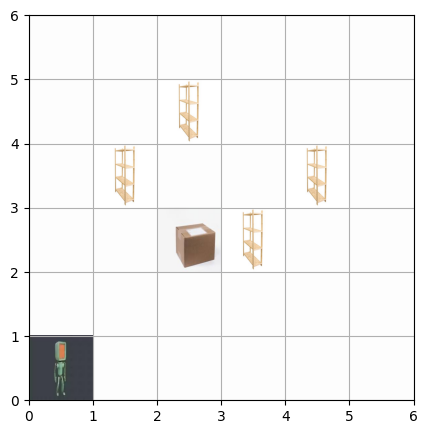

Step: 2
  Action Taken: Pick-up
  Current State: Position=[0 0], Carrying Item=False
  Reward: -1
  Done: False



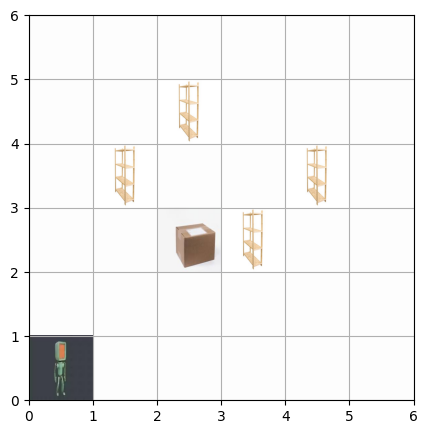

Step: 3
  Action Taken: Right
  Current State: Position=[1 0], Carrying Item=False
  Reward: -1
  Done: False



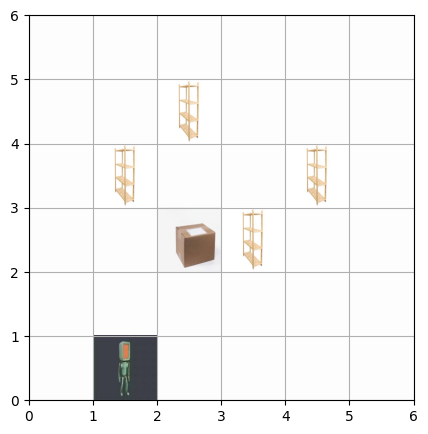

Step: 4
  Action Taken: Drop-off
  Current State: Position=[1 0], Carrying Item=False
  Reward: -1
  Done: False



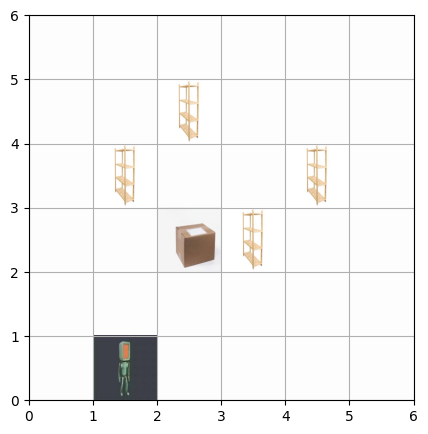

Step: 5
  Action Taken: Pick-up
  Current State: Position=[1 0], Carrying Item=False
  Reward: -1
  Done: False



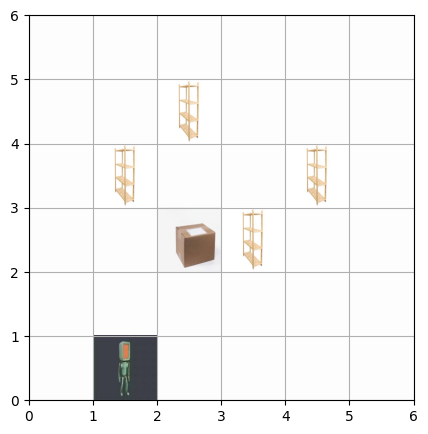

Step: 6
  Action Taken: Left
  Current State: Position=[0 0], Carrying Item=False
  Reward: -1
  Done: False



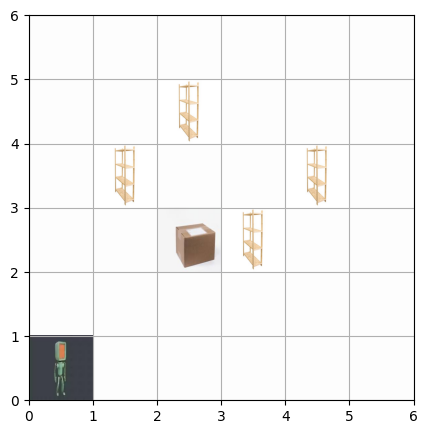

Step: 7
  Action Taken: Right
  Current State: Position=[1 0], Carrying Item=False
  Reward: -1
  Done: False



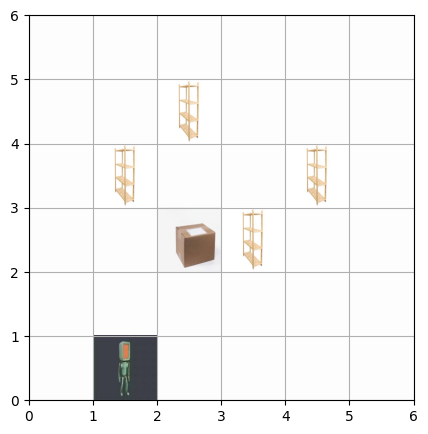

Step: 8
  Action Taken: Up
  Current State: Position=[1 1], Carrying Item=False
  Reward: -1
  Done: False



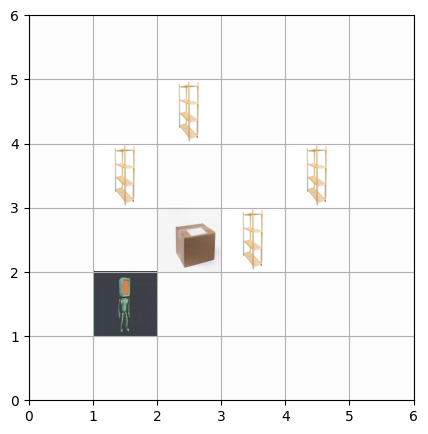

Step: 9
  Action Taken: Left
  Current State: Position=[0 1], Carrying Item=False
  Reward: -1
  Done: False



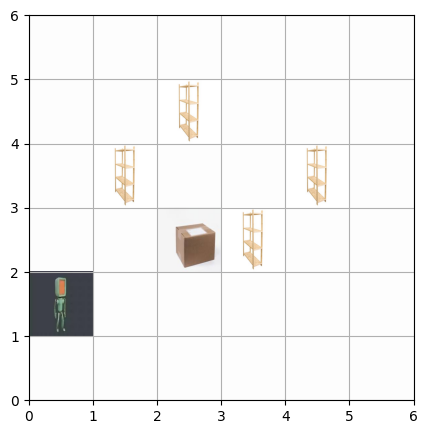

Step: 10
  Action Taken: Pick-up
  Current State: Position=[0 1], Carrying Item=False
  Reward: -1
  Done: False



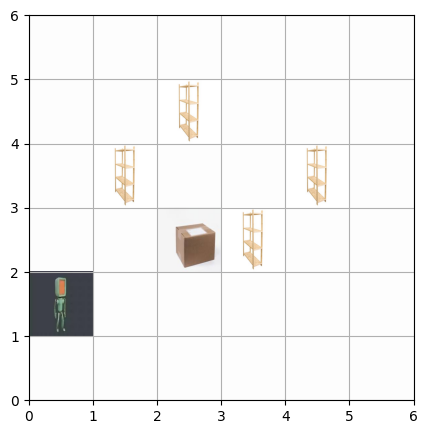

In [162]:
environment = Warehouse_robot()
initial_state = environment.reset()
mapped_actions = {1: "Up", 0: "Down", 2: "Left", 3: "Right", 4: "Pick-up", 5: "Drop-off"}

for step in range(10):
    action = environment.action_space.sample()
    next_state, r, finished, truncated, _ = environment.step(action)
    print(f"Step: {step + 1}")
    print(f"  Action Taken: {mapped_actions[action]}")
    print(f"  Current State: Position={next_state[:2]}, Carrying Item={bool(next_state[2])}")
    print(f"  Reward: {r}")
    print(f"  Done: {finished or truncated}\n")
    environment.render()
    
    if finished or truncated:  # Ensure we stop if episode ends
        print("Task completed! The robot successfully delivered the item.")
        break

In [163]:
class Stochastic_warehouse(gym.Env):
    def __init__(self):
        super(Stochastic_warehouse, self).__init__()
        self.grid_size = 6
        self.start_position = (0, 0)
        self.item_position = (2, 2)
        self.dropoff_position = (5, 5)
        self.robot_start_position = self.start_position
        self.carrying = False
        self.obstacles = [(1, 3), (2, 4), (3, 2), (4, 3)]
        self.dynamic_obstacles = [(0, 5), (3, 4)]  
        self.action_space = spaces.Discrete(6)
        self.observation_space = spaces.MultiDiscrete([self.grid_size, self.grid_size, 2])
        self.agent_idle_img = mpimg.imread("idle_agent.jpg")
        self.agent_carrying_img = mpimg.imread("agent_carrying_package.jpg")
        self.obstacle_img = mpimg.imread("obstacle.jpg")
        self.item_img = mpimg.imread("package.jpg")
        self.white_background_image = mpimg.imread("white_background.png")

    def reset(self):
        self.robot_start_position = self.start_position
        self.carrying = False
        observation = np.array([self.robot_start_position[0], self.robot_start_position[1], int(self.carrying)])
        info = {}
        return observation, info

    def step(self, action):
        a, b = self.robot_start_position
        stochastic_nature = 0.1
        terminated = False
        truncated = False
        if action in [0, 1, 2, 3]:
            if random.uniform(0, 1) > stochastic_nature:
                if action == 0 and b > 0:
                    b -= 1
                elif action == 1 and b < self.grid_size - 1:
                    b += 1
                elif action == 2 and a > 0:
                    a -= 1
                elif action == 3 and a < self.grid_size - 1:
                    a += 1
        if (a, b) in self.obstacles or (a, b) in self.dynamic_obstacles:
            a, b = self.robot_start_position
            reward = -20
        else:
            reward = -1
        if action == 4 and (a, b) == self.item_position and not self.carrying:
            self.carrying = True
            reward = 25
        elif action == 5 and (a, b) == self.dropoff_position and self.carrying:
            reward = 100
            terminated = True  
        self.robot_start_position = (a, b)
        observation = np.array([a, b, int(self.carrying)])
        info = {}
        return observation, reward, terminated, truncated, info

    def render(self):
        figure, axis = plt.subplots(figsize=(6, 6))
        axis.set_xticks(range(self.grid_size + 1))
        axis.set_yticks(range(self.grid_size + 1))
        axis.grid(True)
        axis.set_xlim(0, self.grid_size)
        axis.set_ylim(0, self.grid_size)

        for obs in self.obstacles:
            axis.imshow(self.obstacle_img, extent=[obs[0], obs[0] + 1, obs[1], obs[1] + 1])

        for obs in self.dynamic_obstacles:
            axis.imshow(self.obstacle_img, extent=[obs[0], obs[0] + 1, obs[1], obs[1] + 1])
            
        axis.imshow(self.item_img, extent=[self.item_position[0], self.item_position[0] + 1, self.item_position[1], self.item_position[1] + 1])
        axis.imshow(self.item_img, extent=[self.dropoff_position[0], self.dropoff_position[0] + 1, self.dropoff_position[1], self.dropoff_position[1] + 1])
        agent_image = self.agent_carrying_img if self.carrying else self.agent_idle_img
        axis.imshow(agent_image, extent=[self.robot_start_position[0], self.robot_start_position[0] + 1, self.robot_start_position[1], self.robot_start_position[1] + 1])
        plt.show()

Step: 1
  Action Taken: Down
  Current State: Position=[0 0], Carrying Item=False
  Reward: -1
  Done: False



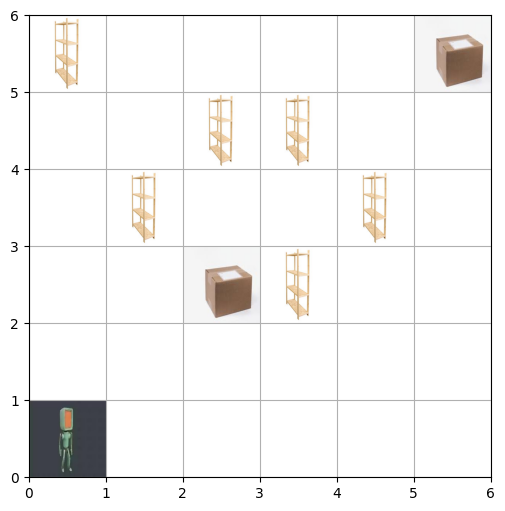

Step: 2
  Action Taken: Left
  Current State: Position=[0 0], Carrying Item=False
  Reward: -1
  Done: False



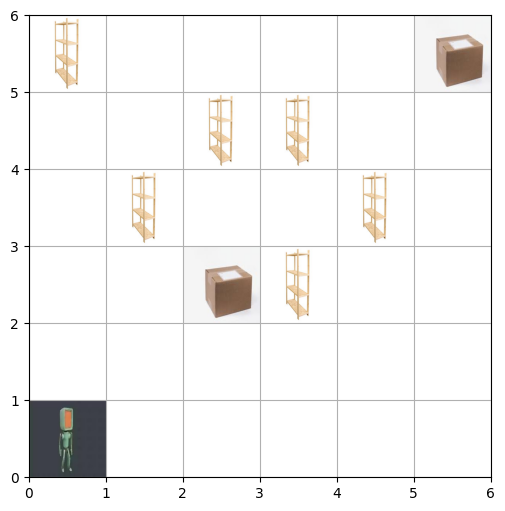

Step: 3
  Action Taken: Down
  Current State: Position=[0 0], Carrying Item=False
  Reward: -1
  Done: False



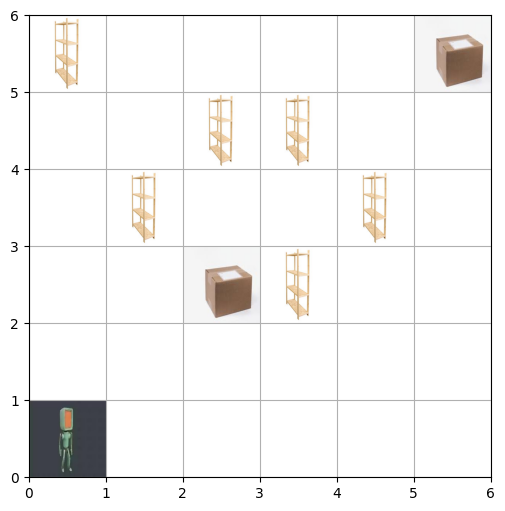

Step: 4
  Action Taken: Down
  Current State: Position=[0 0], Carrying Item=False
  Reward: -1
  Done: False



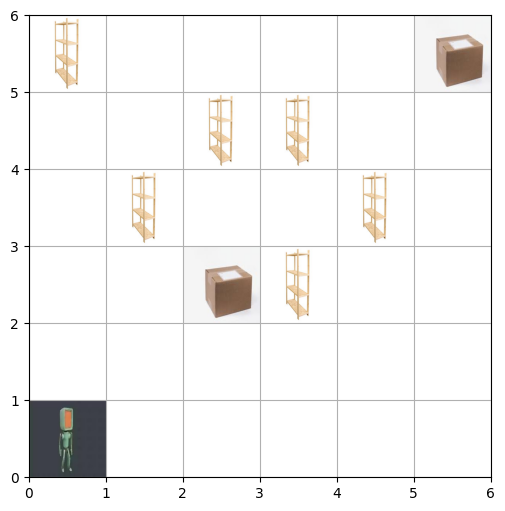

Step: 5
  Action Taken: Down
  Current State: Position=[0 0], Carrying Item=False
  Reward: -1
  Done: False



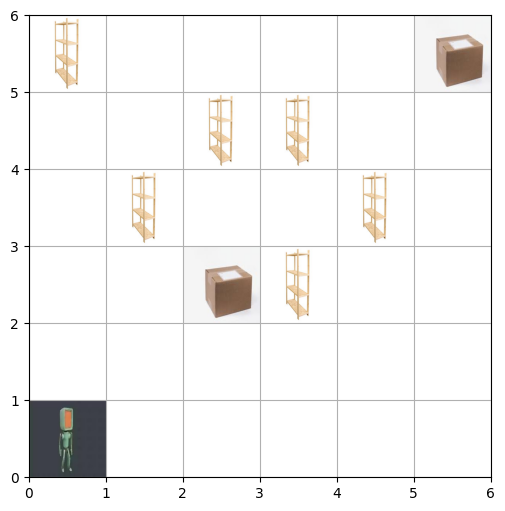

Step: 6
  Action Taken: Up
  Current State: Position=[0 1], Carrying Item=False
  Reward: -1
  Done: False



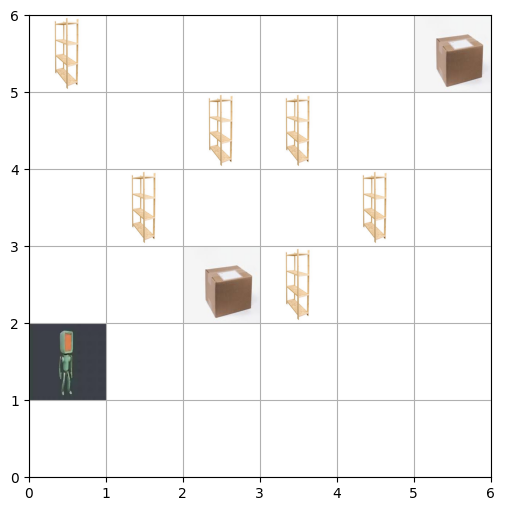

Step: 7
  Action Taken: Right
  Current State: Position=[1 1], Carrying Item=False
  Reward: -1
  Done: False



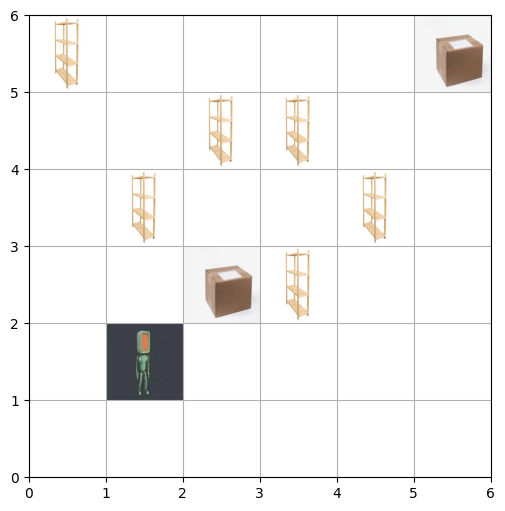

Step: 8
  Action Taken: Up
  Current State: Position=[1 2], Carrying Item=False
  Reward: -1
  Done: False



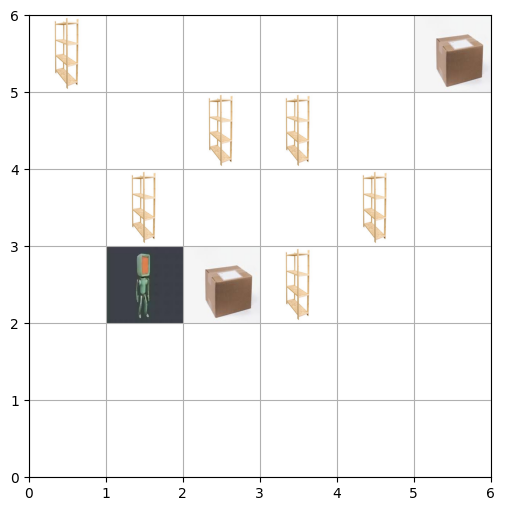

Step: 9
  Action Taken: Up
  Current State: Position=[1 2], Carrying Item=False
  Reward: -20
  Done: False



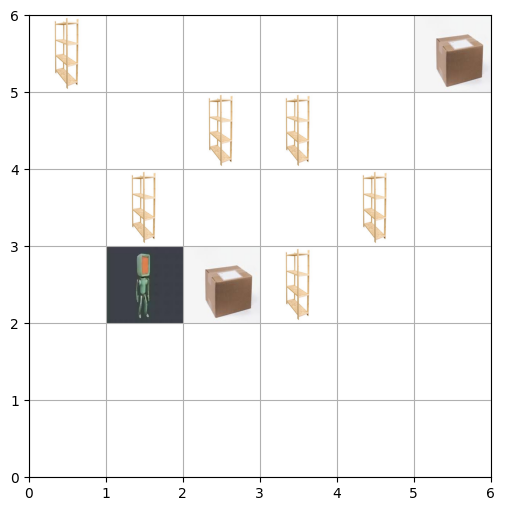

Step: 10
  Action Taken: Right
  Current State: Position=[2 2], Carrying Item=False
  Reward: -1
  Done: False



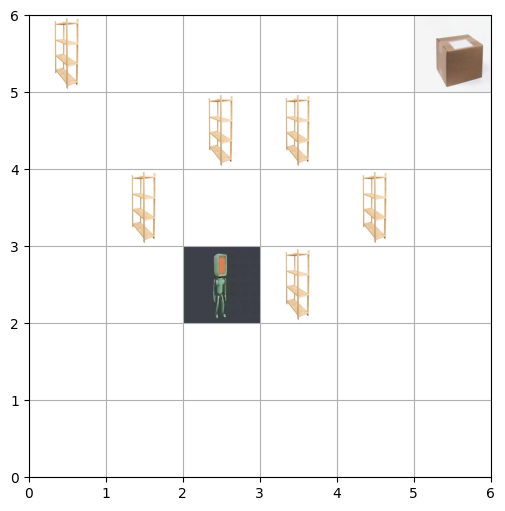

In [164]:
env = Stochastic_warehouse()
state = env.reset()
mapped_actions = {1: "Up", 0: "Down", 2: "Left", 3: "Right", 4: "Pick-up", 5: "Drop-off"}

for step in range(10):
    action = env.action_space.sample()
    next_state, r, finished, truncated, _ = env.step(action)
    print(f"Step: {step + 1}")
    print(f"  Action Taken: {mapped_actions[action]}")
    print(f"  Current State: Position={next_state[:2]}, Carrying Item={bool(next_state[2])}")
    print(f"  Reward: {r}")
    print(f"  Done: {finished or truncated}\n")
    env.render()
    
    if finished or truncated:
        print("Task completed! The robot successfully delivered the item.")
        break

### Q Learning:

### Deterministic environment(Base model):

In [165]:
environment = Warehouse_robot()
gamma = 0.9
alpha = 0.1
epsilon = 0.1
number_episodes = 500

def start_the_q_table():
    return defaultdict(lambda: np.zeros(environment.action_space.n))

Q_table = start_the_q_table()
print("Q_table-table before training:")
print(dict(Q_table))

def epsilon_greedy_policy(state, epsilon):
    if random.uniform(0, 1) < epsilon:
        return environment.action_space.sample()
    else:
        return np.argmax(Q_table[state])
    
def train_q_learning():
    rewards_per_episode = []
    epsilon_values = []
    epsilon = 1.0

    for episode in range(number_episodes):
        state, _ = environment.reset()
        state = tuple(state)
        total_reward = 0
        done = False

        while not done:
            action = epsilon_greedy_policy(state, epsilon)
            next_state, reward, done, _, _ = environment.step(action)
            next_state = tuple(next_state)
            best_next_action = np.argmax(Q_table[next_state])
            Q_table[state][action] += alpha * (reward + gamma * Q_table[next_state][best_next_action] - Q_table[state][action])
            state = next_state
            total_reward += reward
        
        rewards_per_episode.append(total_reward)
        epsilon = max(0.01, epsilon * 0.995)
        epsilon_values.append(epsilon)

        if (episode + 1) % 50 == 0:
            print(f"Episode {episode + 1}, Total Reward: {total_reward}, Epsilon: {epsilon}")
    
    return rewards_per_episode, epsilon_values

train_rewards_q_learning, epsilon_values = train_q_learning()
print("Trained Q_table-table:")
print(dict(Q_table))

with open("q_table.pkl", "wb") as f:
    pickle.dump(dict(Q_table), f)

print("Q_table-table saved as q_table.pkl")

Q_table-table before training:
{}
Episode 50, Total Reward: 84, Epsilon: 0.778312557068642
Episode 100, Total Reward: 68, Epsilon: 0.6057704364907278
Episode 150, Total Reward: 73, Epsilon: 0.47147873742168567
Episode 200, Total Reward: 105, Epsilon: 0.3669578217261671
Episode 250, Total Reward: 109, Epsilon: 0.285607880564032
Episode 300, Total Reward: 75, Epsilon: 0.22229219984074702
Episode 350, Total Reward: 114, Epsilon: 0.1730128104744653
Episode 400, Total Reward: 112, Epsilon: 0.1346580429260134
Episode 450, Total Reward: 112, Epsilon: 0.10480604571960442
Episode 500, Total Reward: 115, Epsilon: 0.08157186144027828
Trained Q_table-table:
{(0, 0, 0): array([153.97654766, 317.51888413, 219.56242261, 172.68391195,
       227.55248589, 224.20543037]), (1, 0, 0): array([ 28.28209994, 300.42115243,  10.16122457,  69.95878522,
        27.95836692,   9.94990924]), (2, 0, 0): array([ 73.11167561, 310.59221379,  18.88530567,   3.0787345 ,
        64.69178714,  26.5544989 ]), (2, 1, 0): a

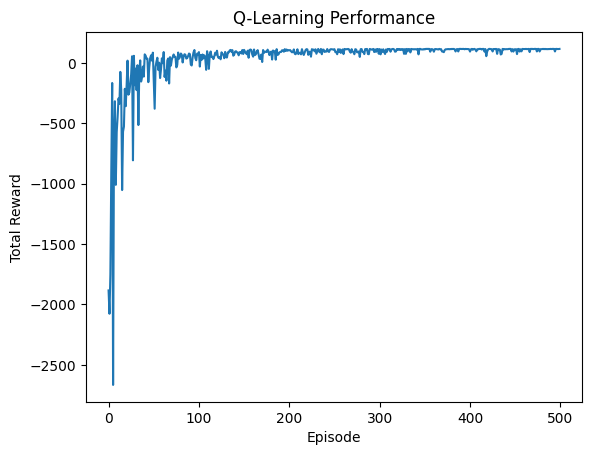

In [166]:
plt.figure()
plt.plot(train_rewards_q_learning)
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.title('Q-Learning Performance')
plt.show()

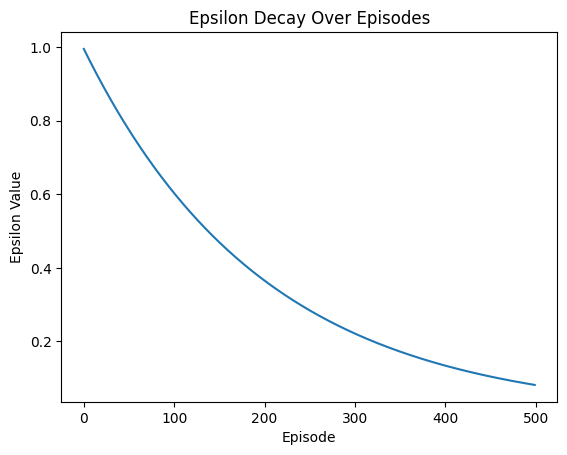

In [167]:
plt.figure()
plt.plot(epsilon_values)
plt.xlabel('Episode')
plt.ylabel('Epsilon Value')
plt.title('Epsilon Decay Over Episodes')
plt.show()

Step 0: Action = Up, Position=(0, 1), Carrying=False, Reward=-1


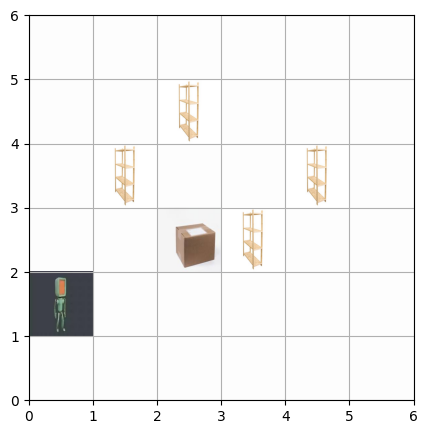

Step 1: Action = Right, Position=(1, 1), Carrying=False, Reward=-1


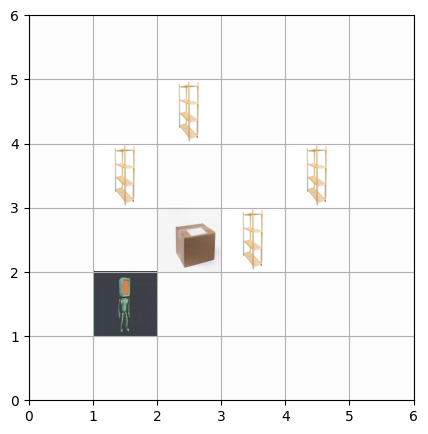

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


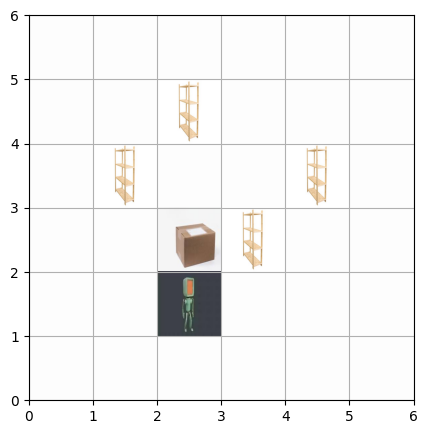

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


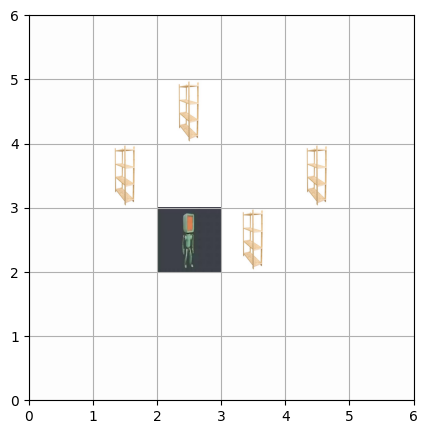

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


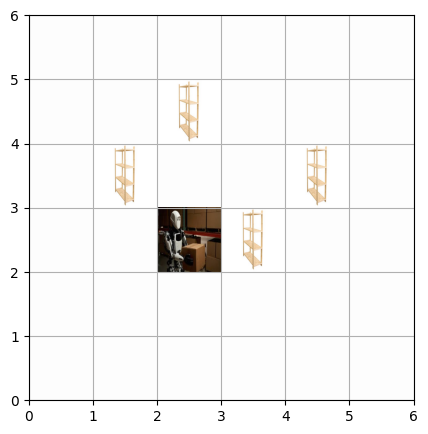

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


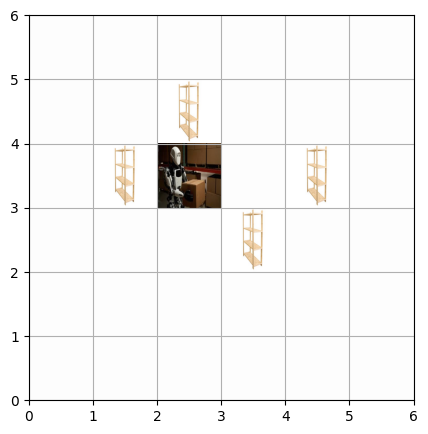

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


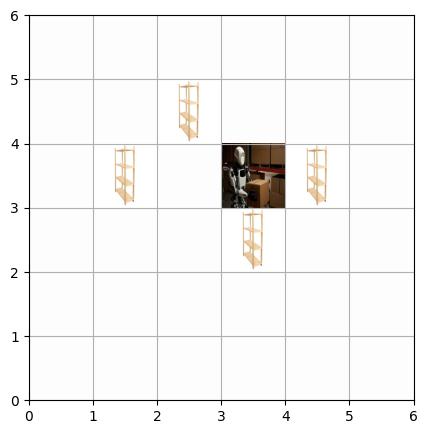

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


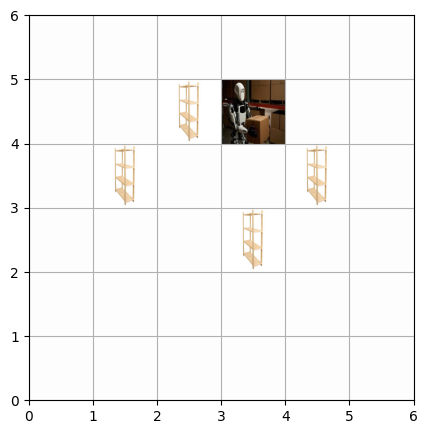

Step 8: Action = Right, Position=(4, 4), Carrying=True, Reward=-1


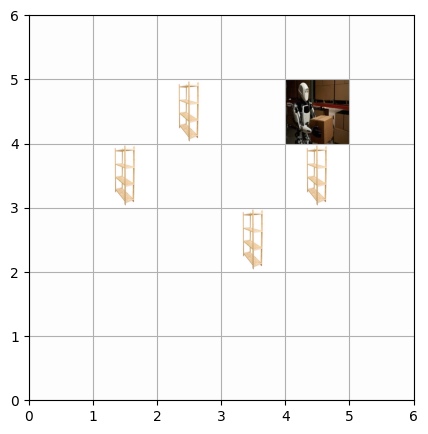

Step 9: Action = Up, Position=(4, 5), Carrying=True, Reward=-1


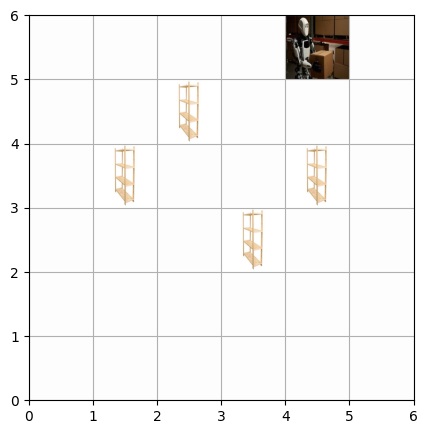

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


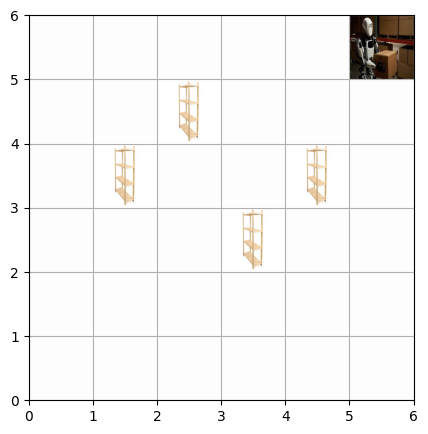

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


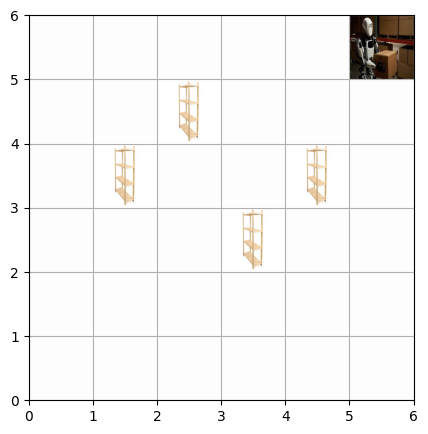

Episode 1: Task completed and the Total Reward is 115
Step 0: Action = Up, Position=(0, 1), Carrying=False, Reward=-1


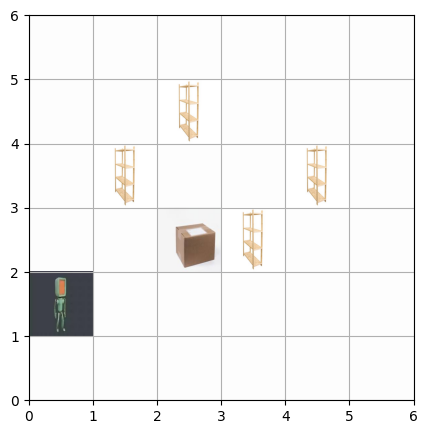

Step 1: Action = Right, Position=(1, 1), Carrying=False, Reward=-1


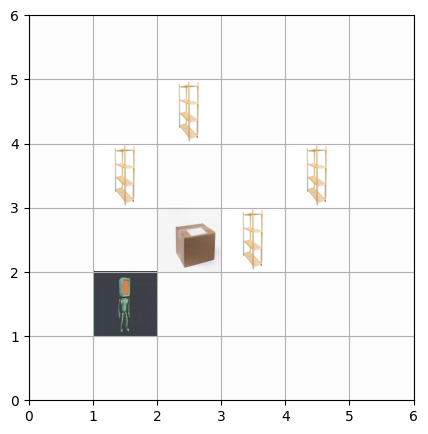

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


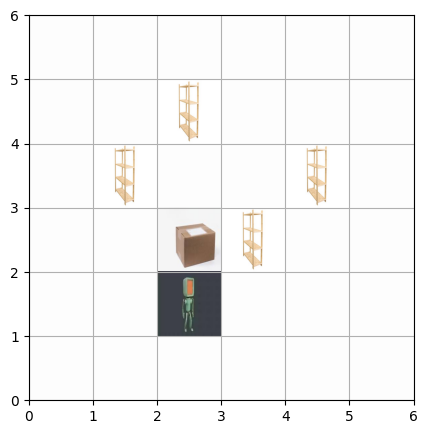

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


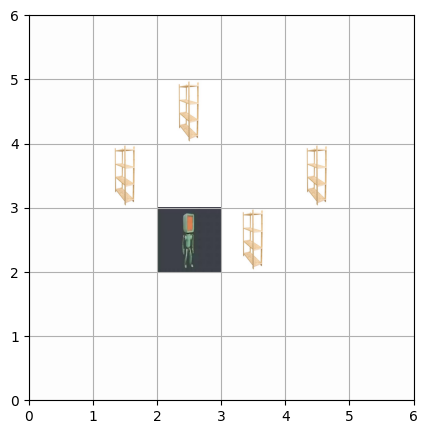

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


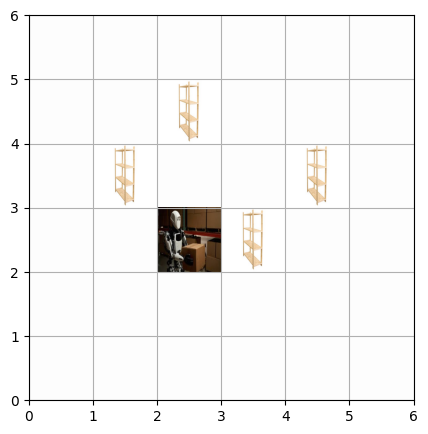

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


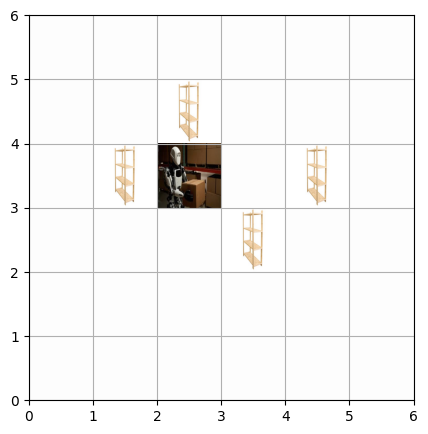

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


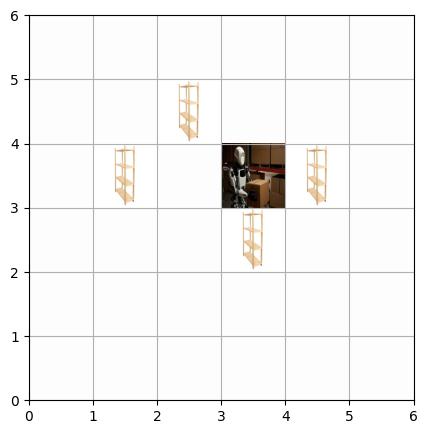

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


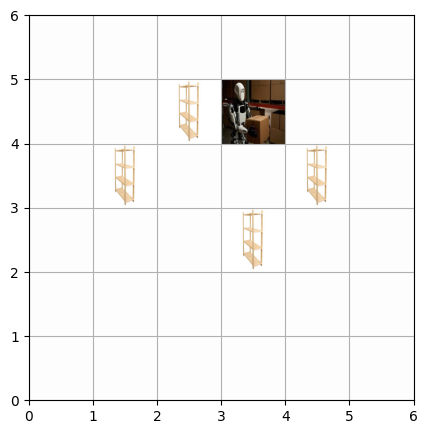

Step 8: Action = Right, Position=(4, 4), Carrying=True, Reward=-1


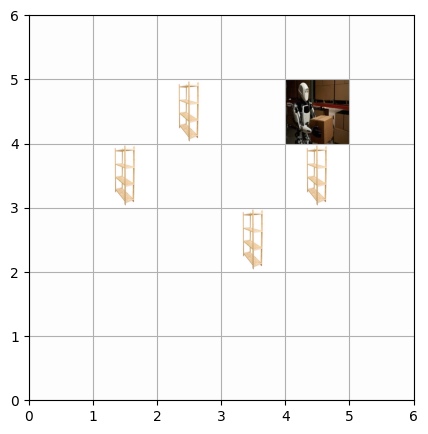

Step 9: Action = Up, Position=(4, 5), Carrying=True, Reward=-1


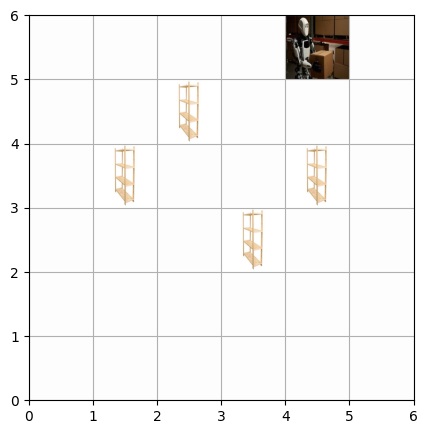

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


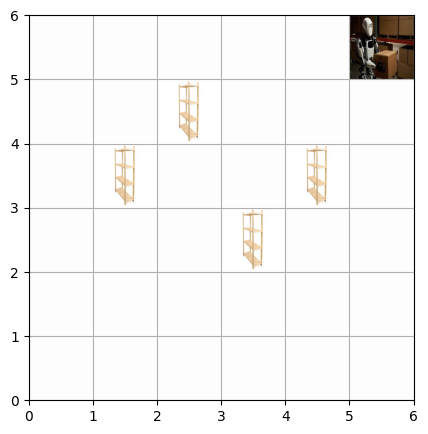

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


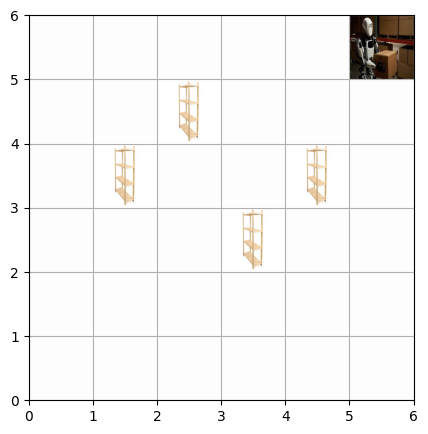

Episode 2: Task completed and the Total Reward is 115
Step 0: Action = Up, Position=(0, 1), Carrying=False, Reward=-1


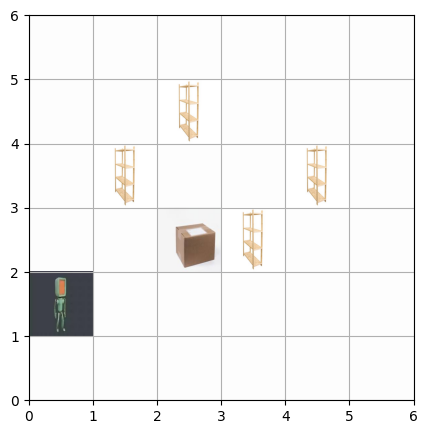

Step 1: Action = Right, Position=(1, 1), Carrying=False, Reward=-1


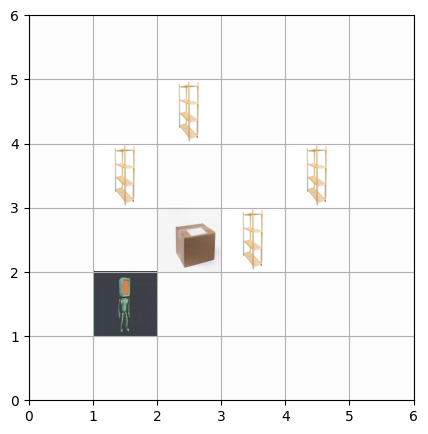

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


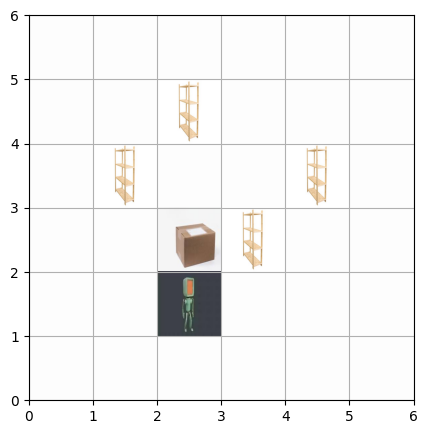

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


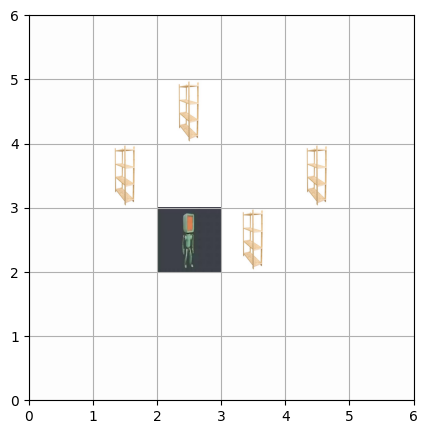

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


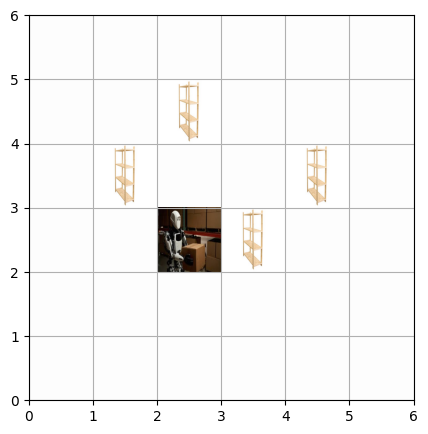

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


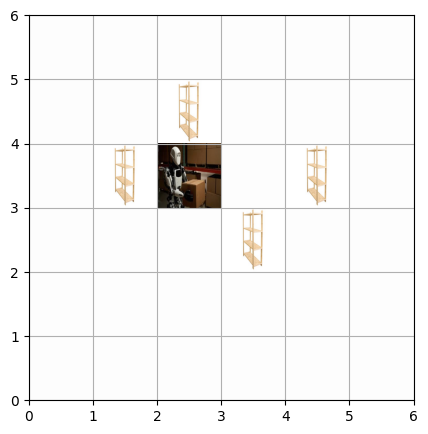

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


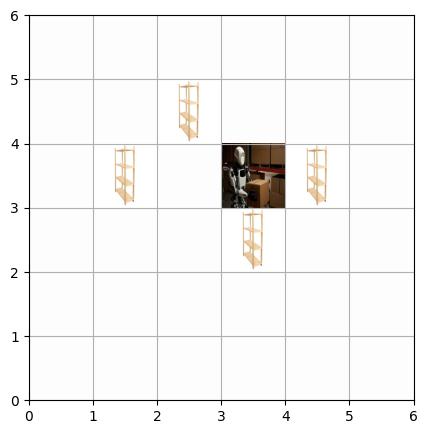

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


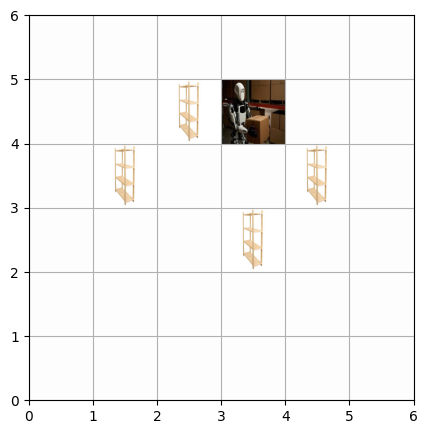

Step 8: Action = Right, Position=(4, 4), Carrying=True, Reward=-1


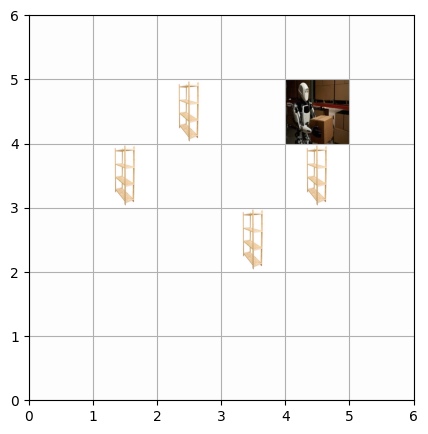

Step 9: Action = Up, Position=(4, 5), Carrying=True, Reward=-1


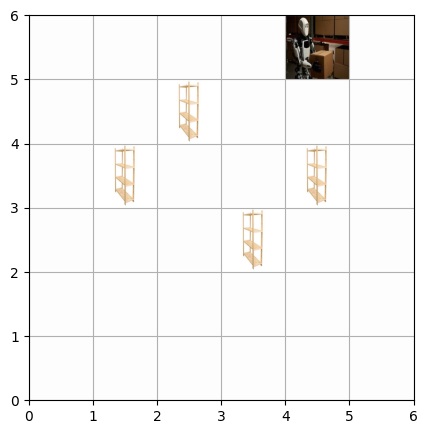

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


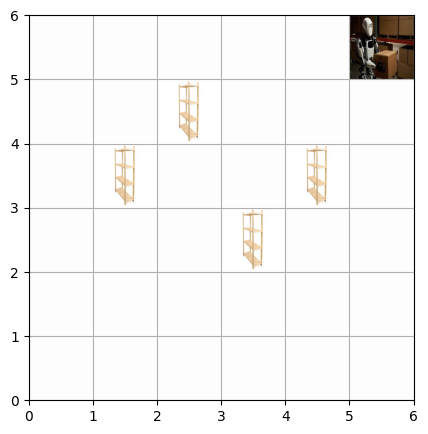

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


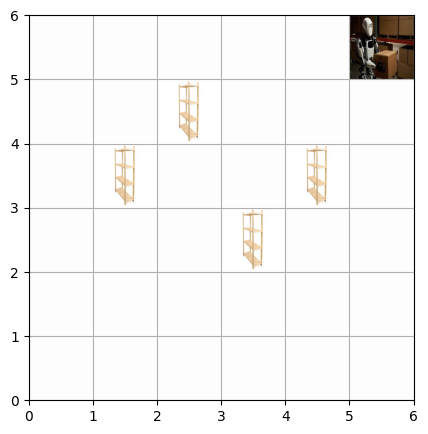

Episode 3: Task completed and the Total Reward is 115
Step 0: Action = Up, Position=(0, 1), Carrying=False, Reward=-1


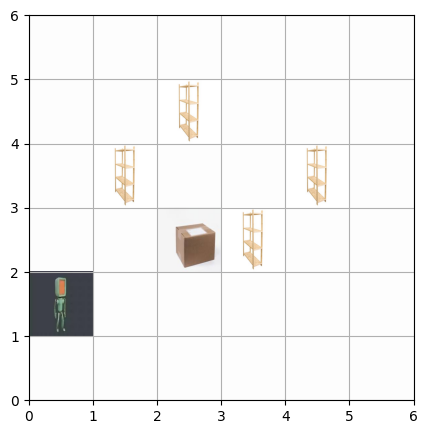

Step 1: Action = Right, Position=(1, 1), Carrying=False, Reward=-1


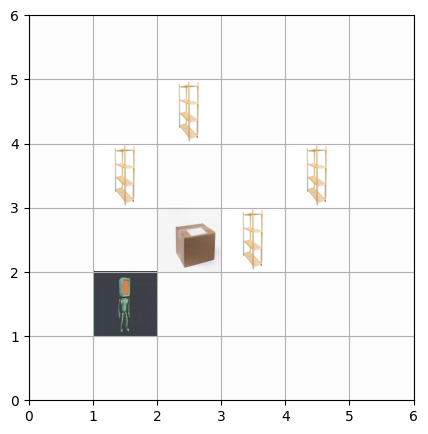

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


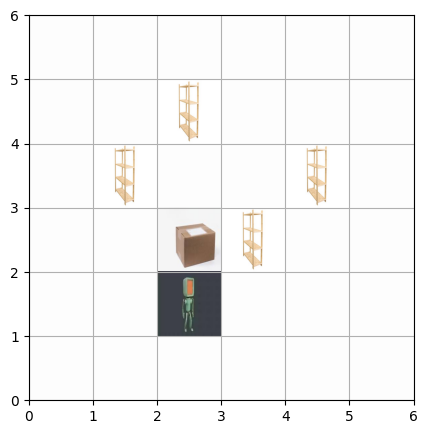

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


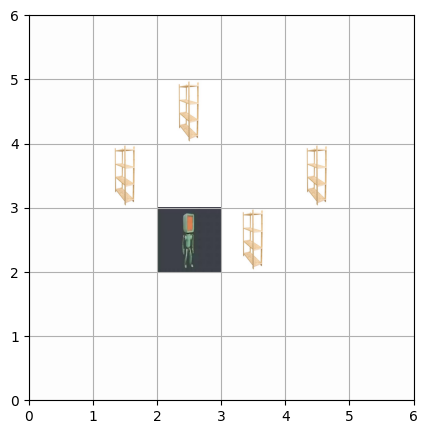

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


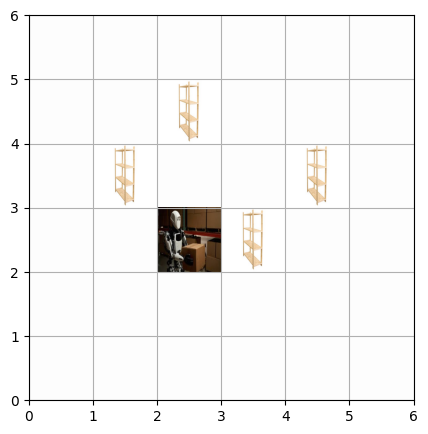

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


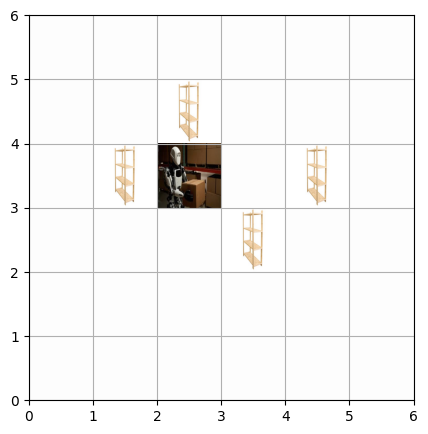

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


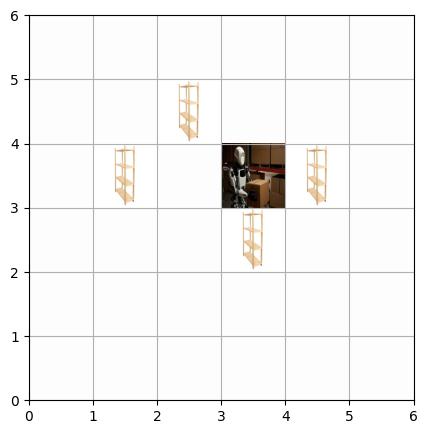

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


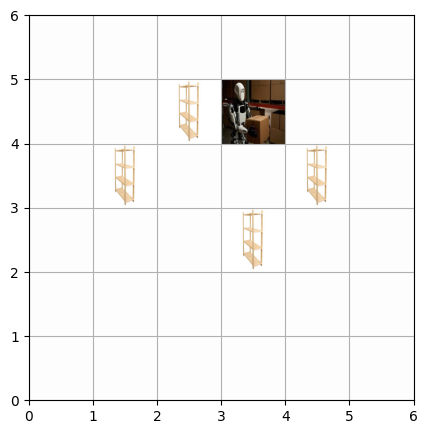

Step 8: Action = Right, Position=(4, 4), Carrying=True, Reward=-1


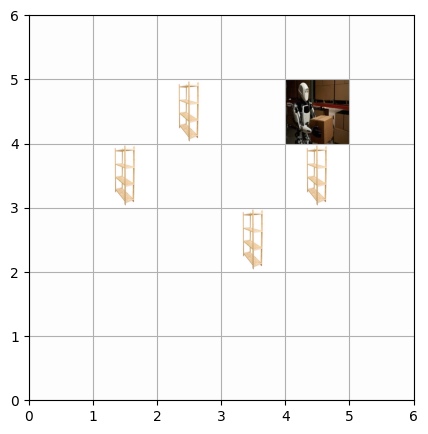

Step 9: Action = Up, Position=(4, 5), Carrying=True, Reward=-1


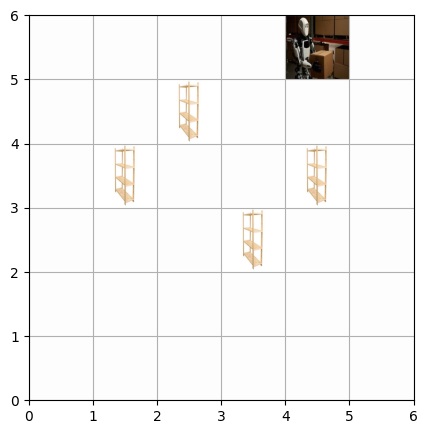

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


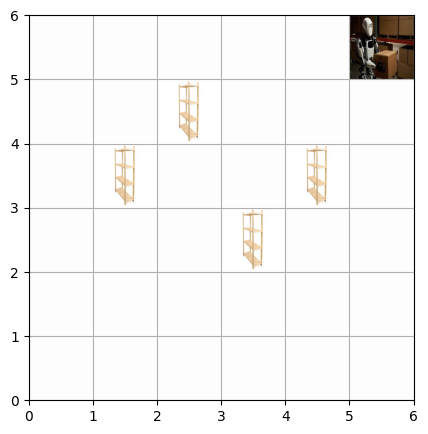

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


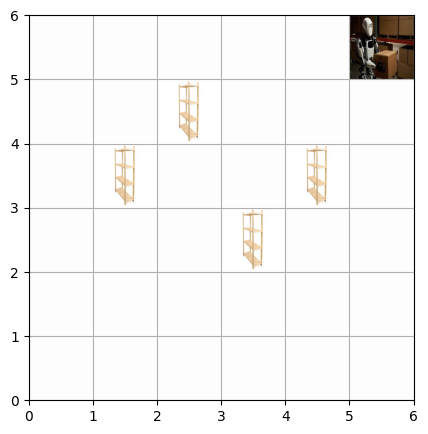

Episode 4: Task completed and the Total Reward is 115
Step 0: Action = Up, Position=(0, 1), Carrying=False, Reward=-1


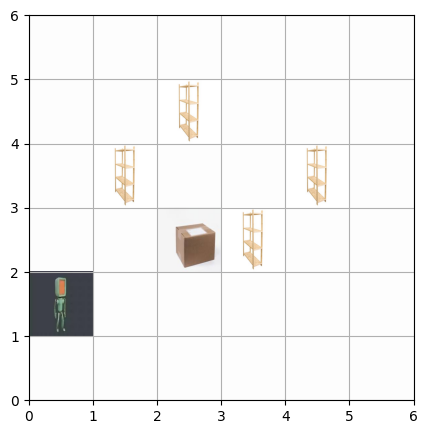

Step 1: Action = Right, Position=(1, 1), Carrying=False, Reward=-1


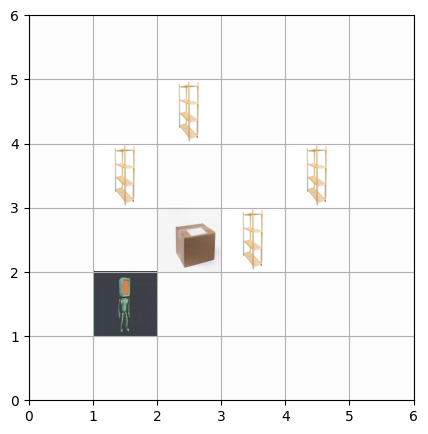

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


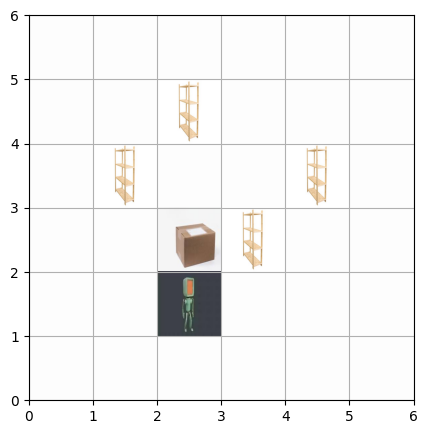

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


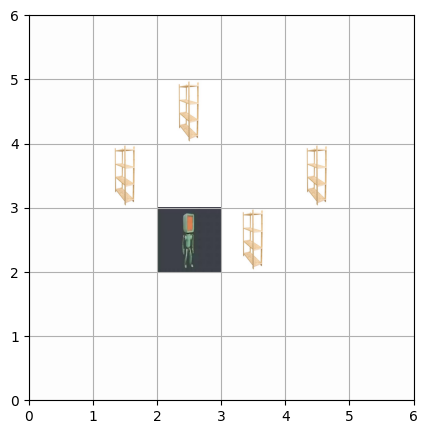

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


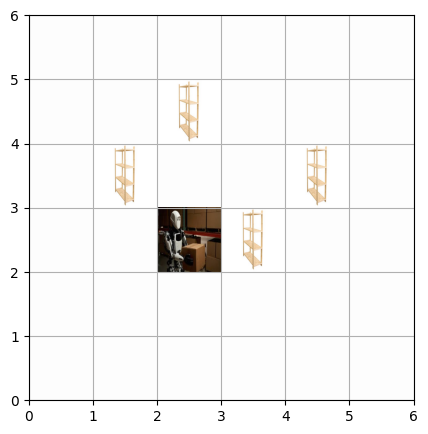

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


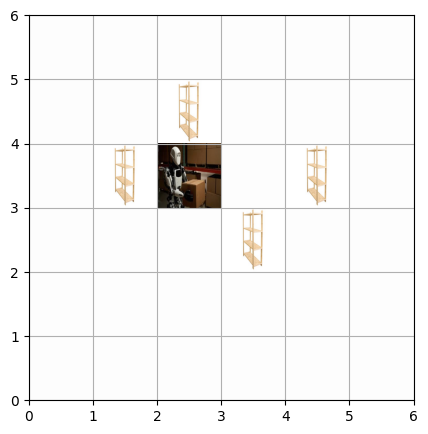

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


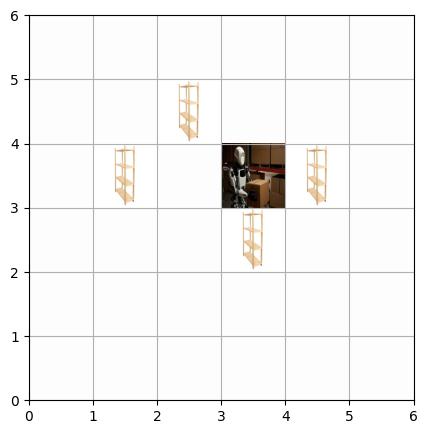

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


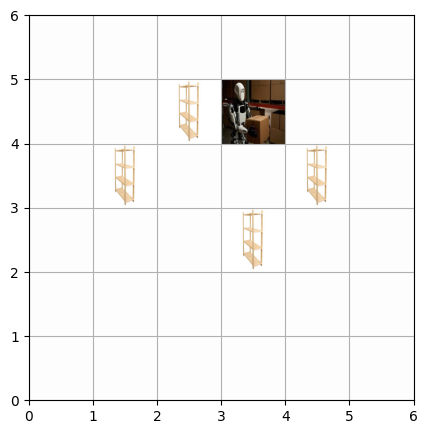

Step 8: Action = Right, Position=(4, 4), Carrying=True, Reward=-1


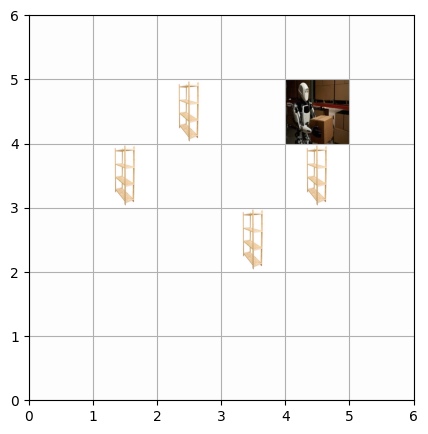

Step 9: Action = Up, Position=(4, 5), Carrying=True, Reward=-1


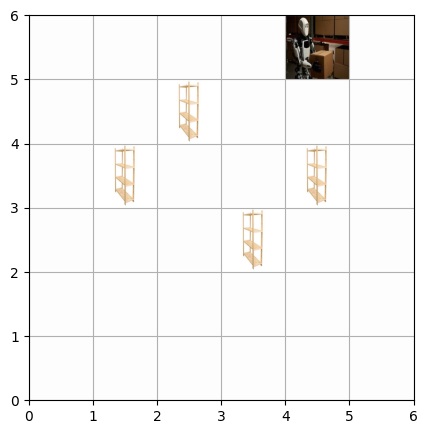

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


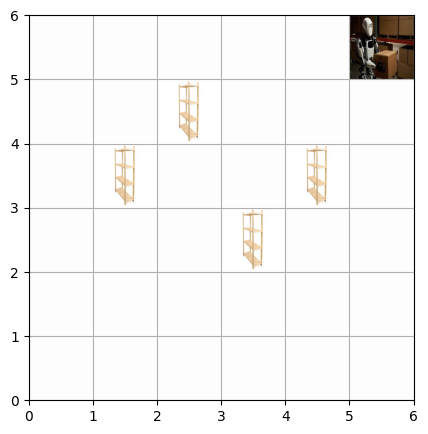

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


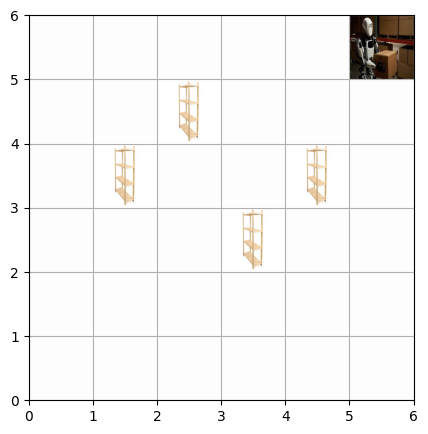

Episode 5: Task completed and the Total Reward is 115
Step 0: Action = Up, Position=(0, 1), Carrying=False, Reward=-1


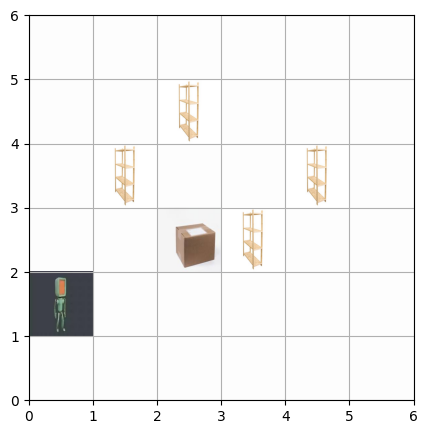

Step 1: Action = Right, Position=(1, 1), Carrying=False, Reward=-1


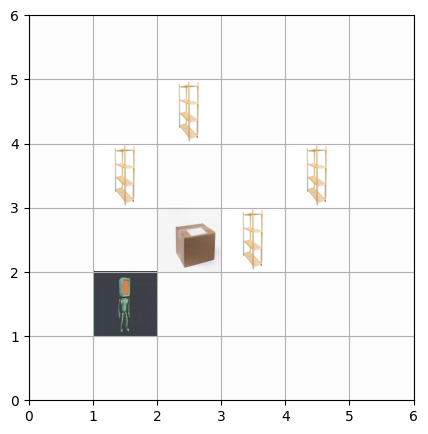

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


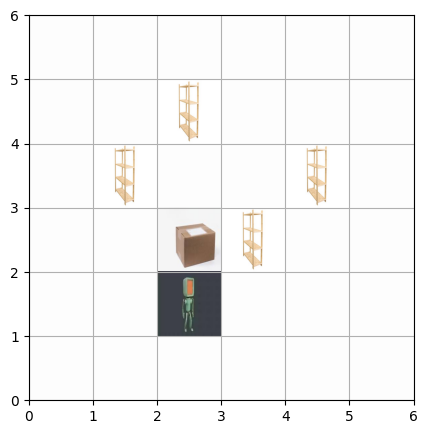

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


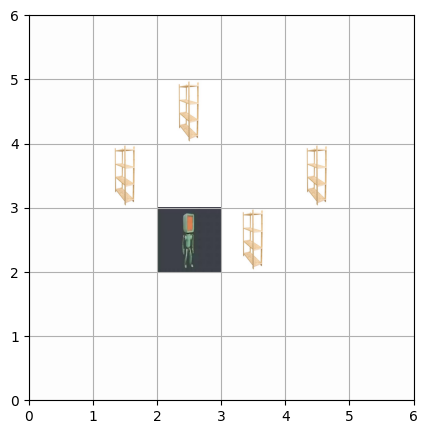

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


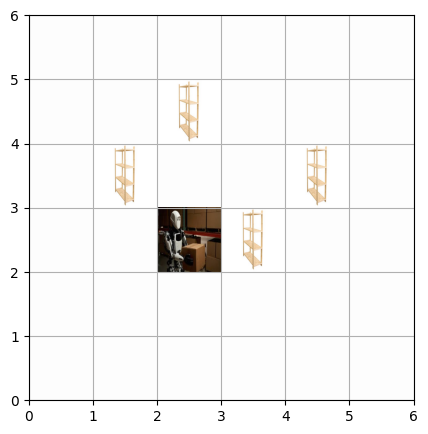

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


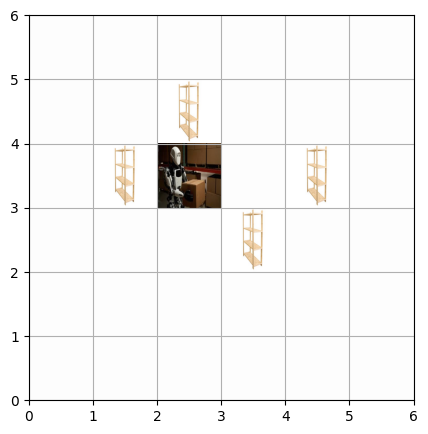

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


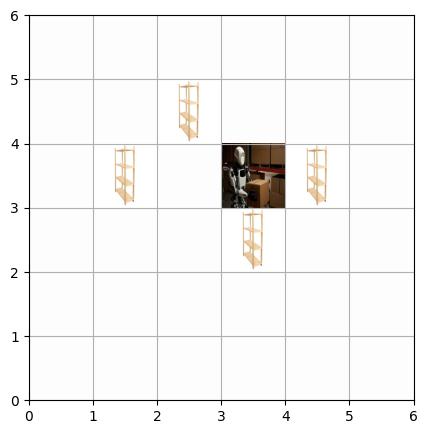

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


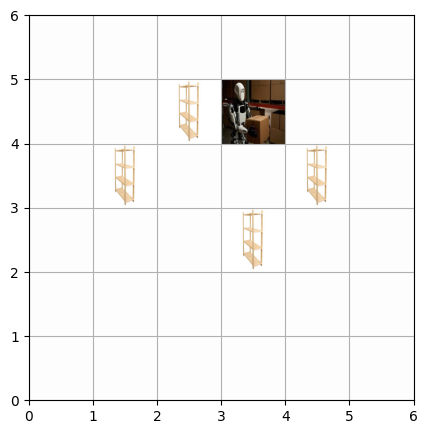

Step 8: Action = Right, Position=(4, 4), Carrying=True, Reward=-1


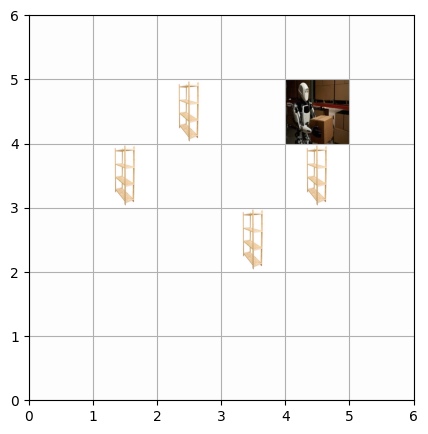

Step 9: Action = Up, Position=(4, 5), Carrying=True, Reward=-1


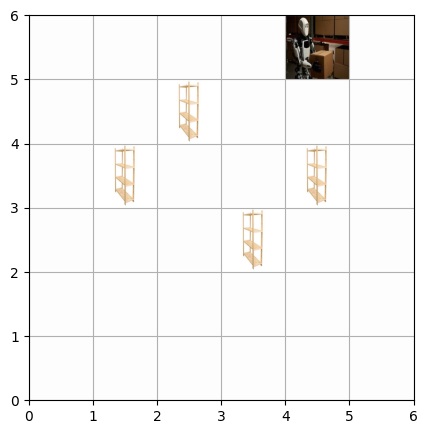

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


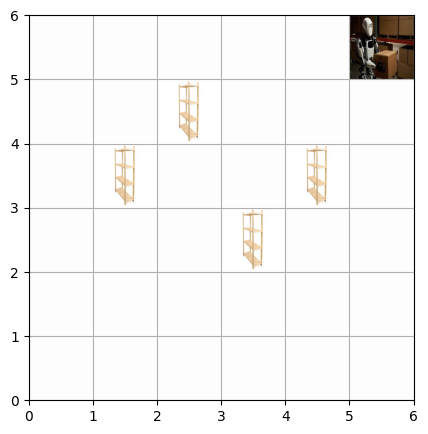

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


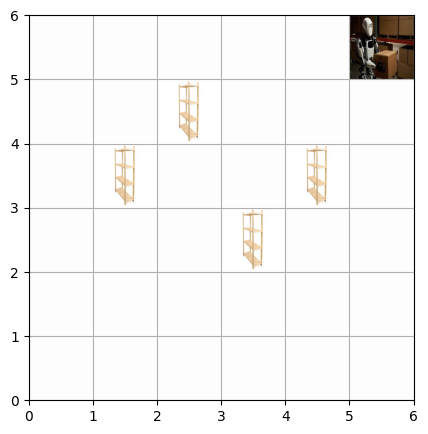

Episode 6: Task completed and the Total Reward is 115
Step 0: Action = Up, Position=(0, 1), Carrying=False, Reward=-1


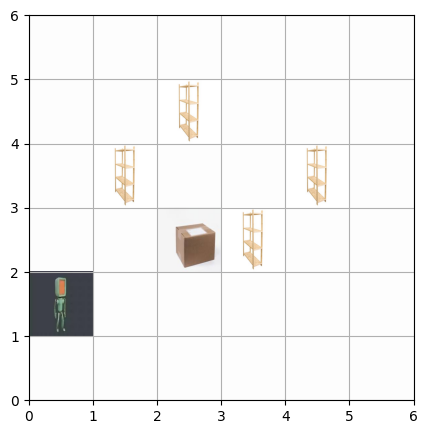

Step 1: Action = Right, Position=(1, 1), Carrying=False, Reward=-1


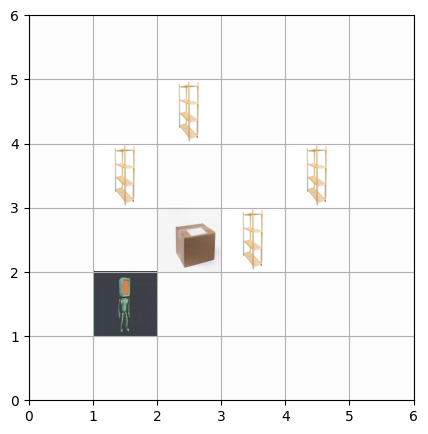

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


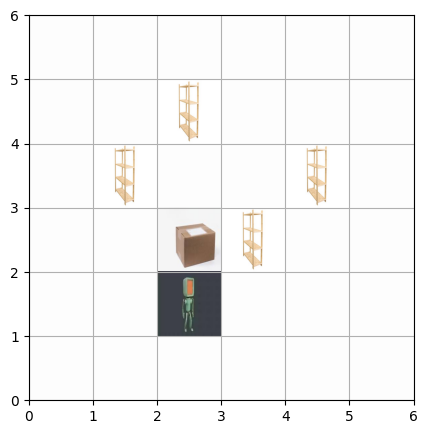

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


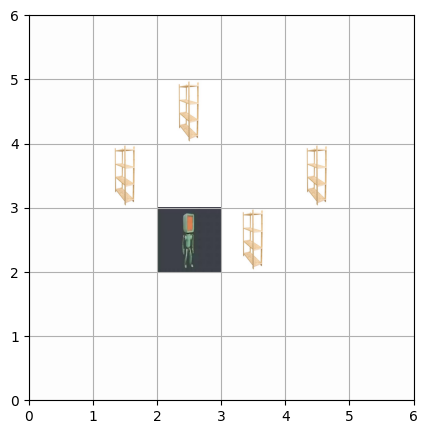

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


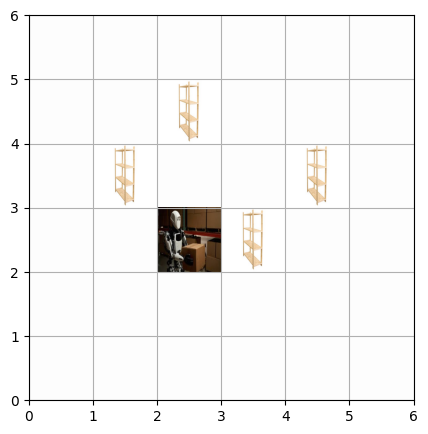

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


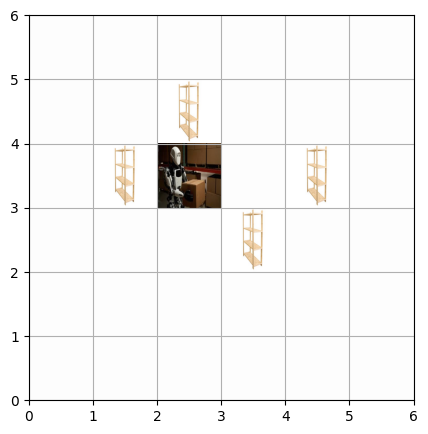

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


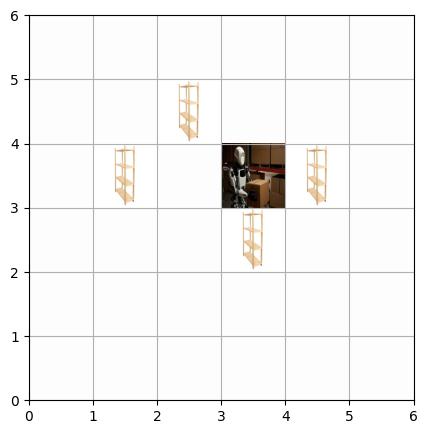

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


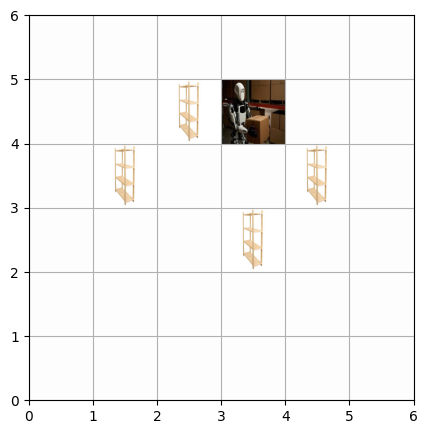

Step 8: Action = Right, Position=(4, 4), Carrying=True, Reward=-1


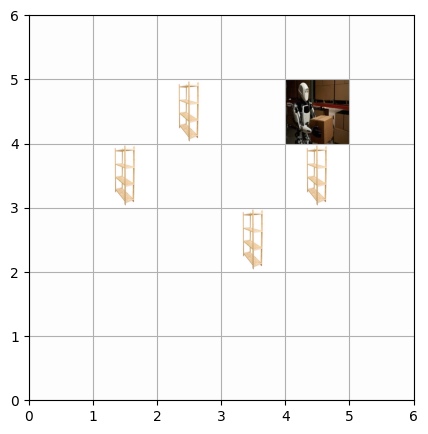

Step 9: Action = Up, Position=(4, 5), Carrying=True, Reward=-1


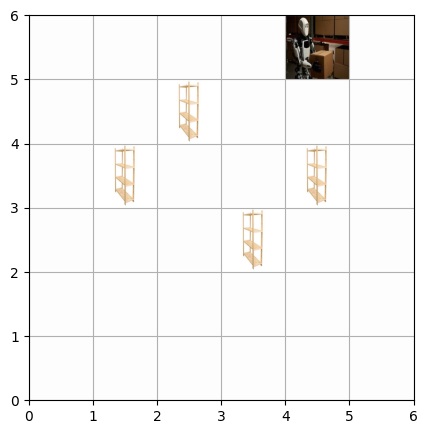

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


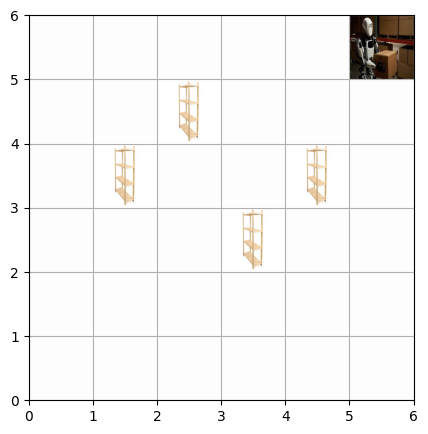

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


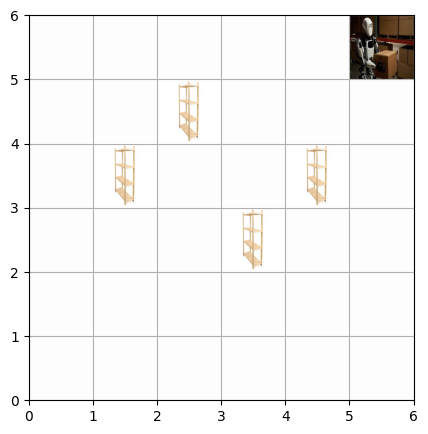

Episode 7: Task completed and the Total Reward is 115
Step 0: Action = Up, Position=(0, 1), Carrying=False, Reward=-1


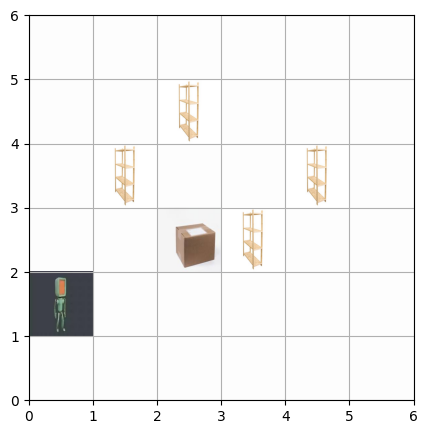

Step 1: Action = Right, Position=(1, 1), Carrying=False, Reward=-1


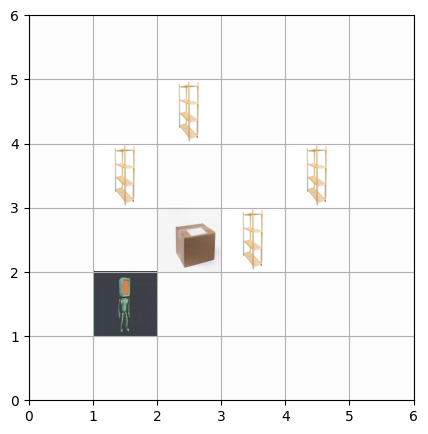

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


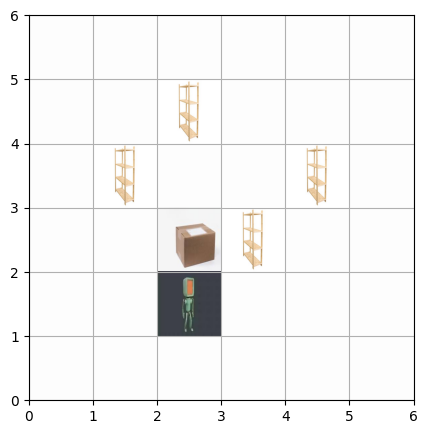

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


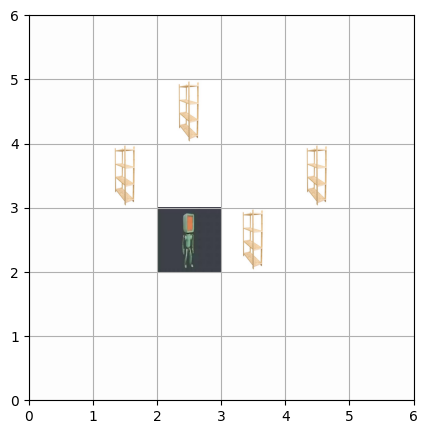

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


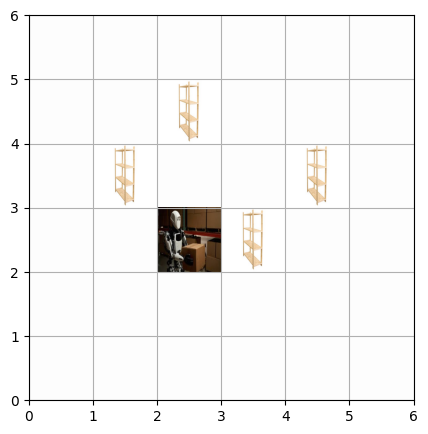

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


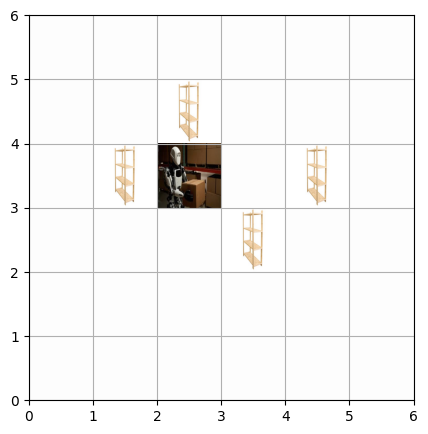

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


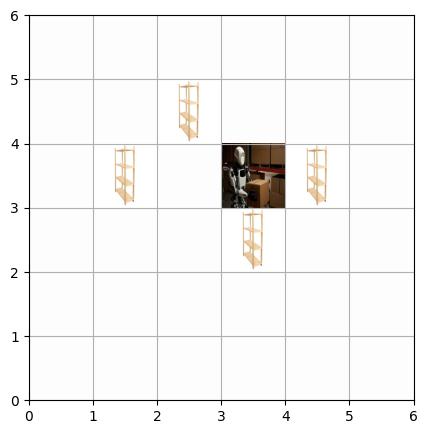

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


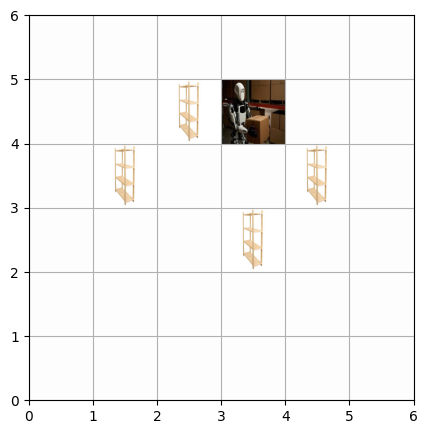

Step 8: Action = Right, Position=(4, 4), Carrying=True, Reward=-1


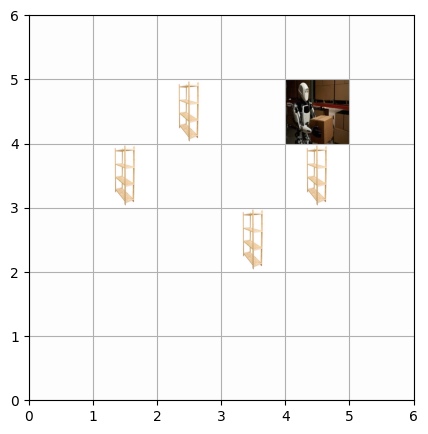

Step 9: Action = Up, Position=(4, 5), Carrying=True, Reward=-1


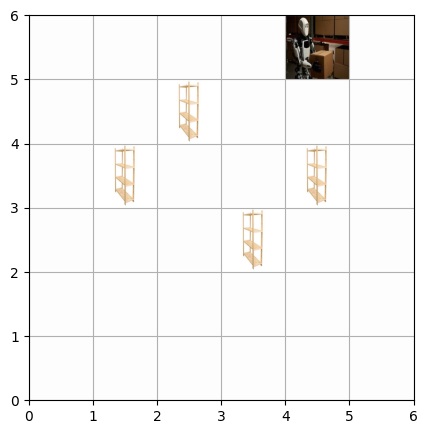

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


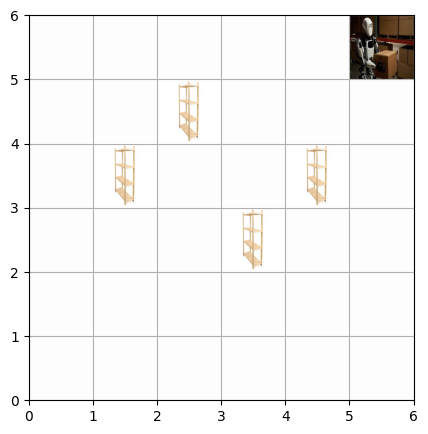

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


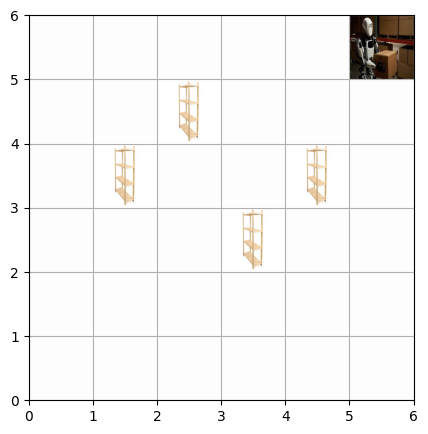

Episode 8: Task completed and the Total Reward is 115
Step 0: Action = Up, Position=(0, 1), Carrying=False, Reward=-1


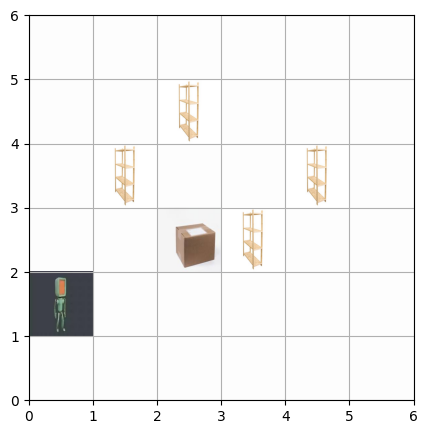

Step 1: Action = Right, Position=(1, 1), Carrying=False, Reward=-1


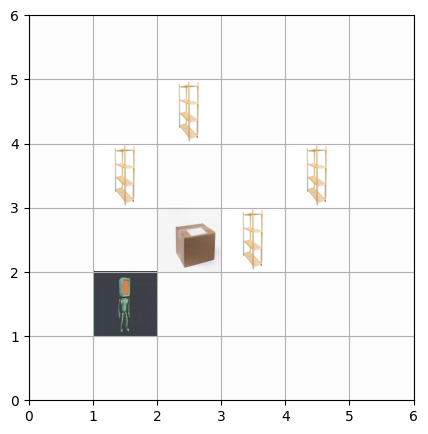

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


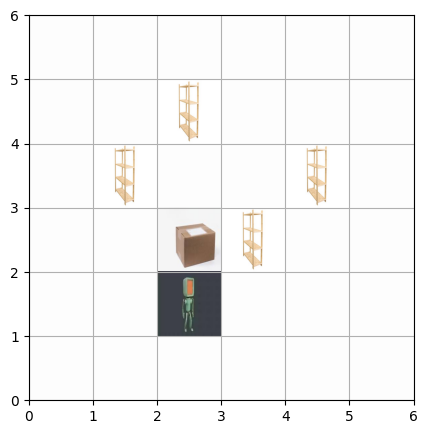

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


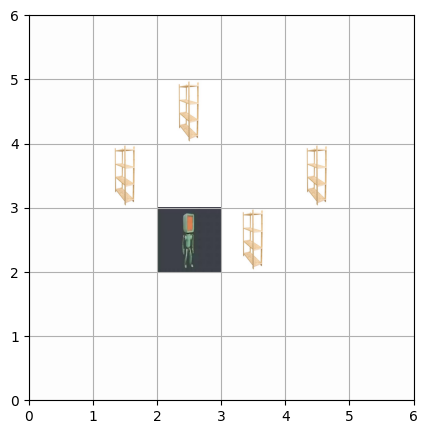

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


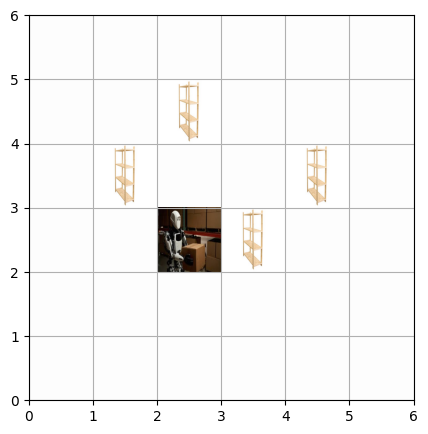

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


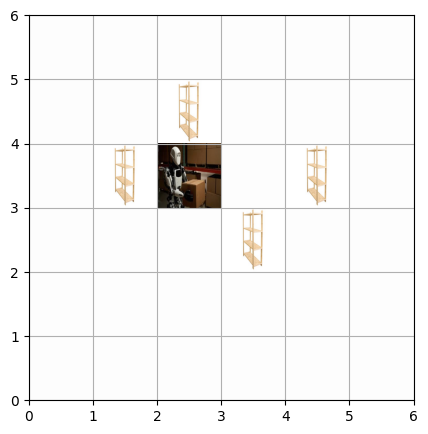

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


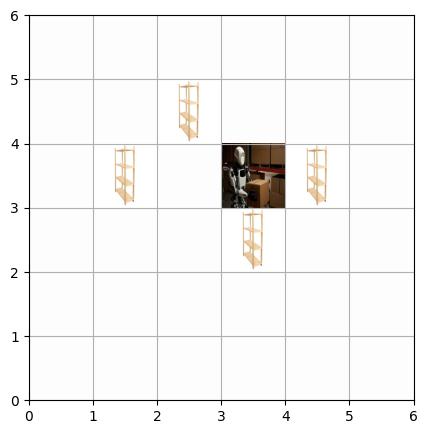

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


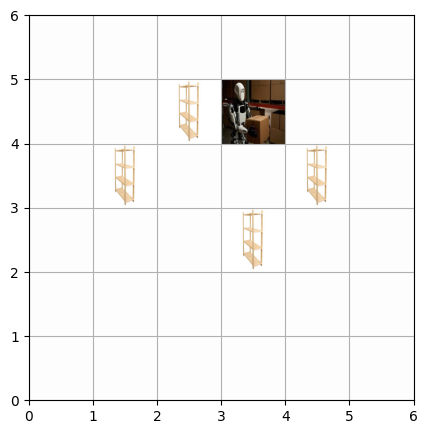

Step 8: Action = Right, Position=(4, 4), Carrying=True, Reward=-1


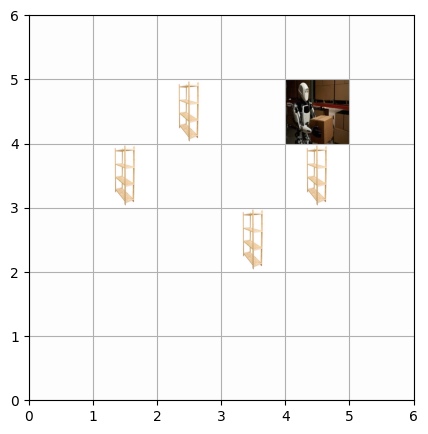

Step 9: Action = Up, Position=(4, 5), Carrying=True, Reward=-1


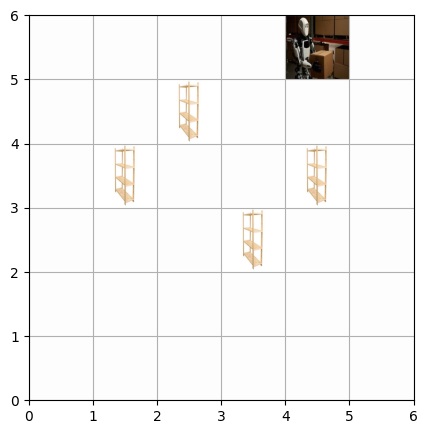

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


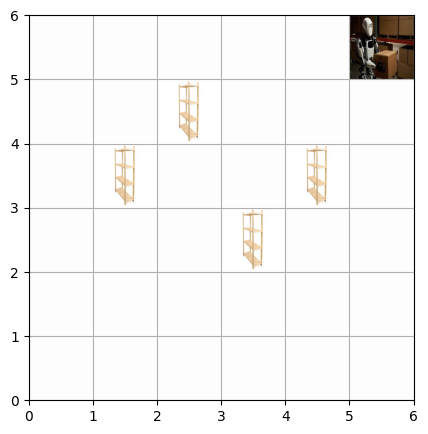

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


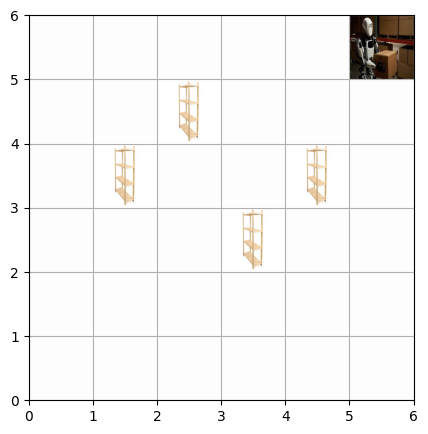

Episode 9: Task completed and the Total Reward is 115
Step 0: Action = Up, Position=(0, 1), Carrying=False, Reward=-1


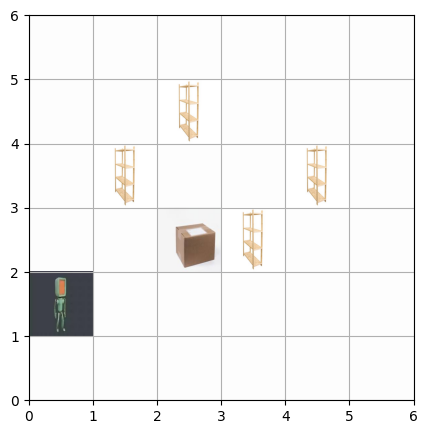

Step 1: Action = Right, Position=(1, 1), Carrying=False, Reward=-1


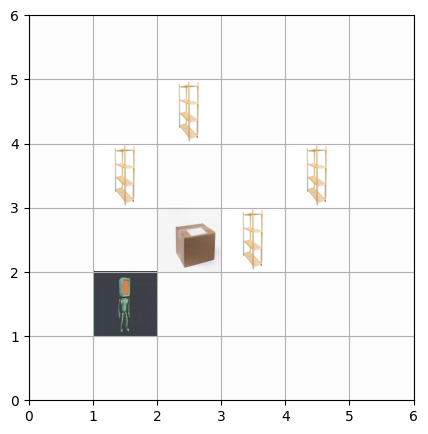

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


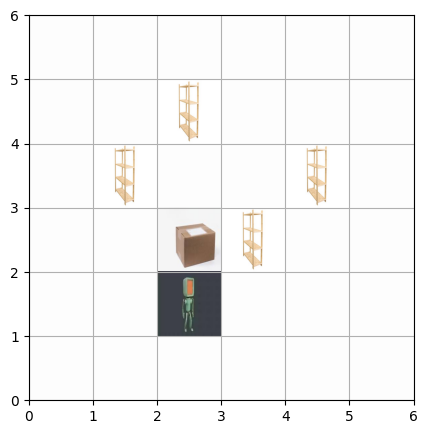

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


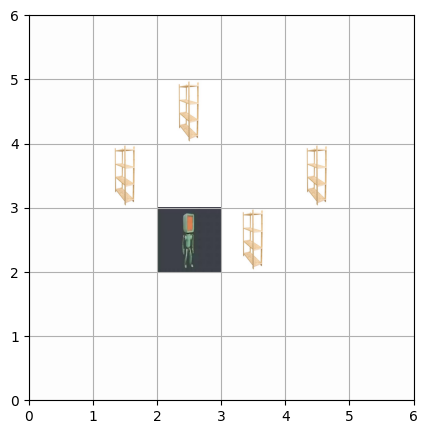

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


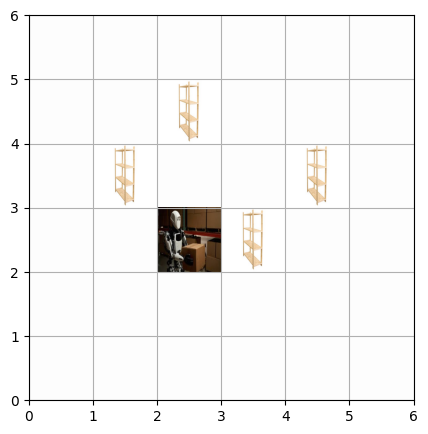

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


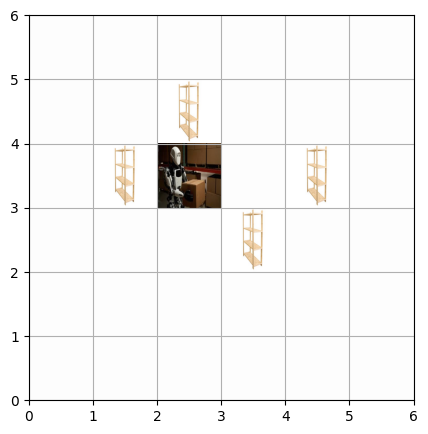

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


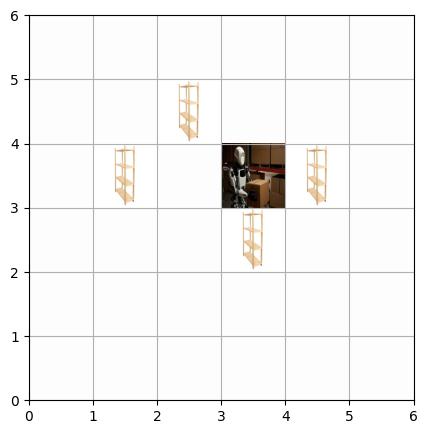

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


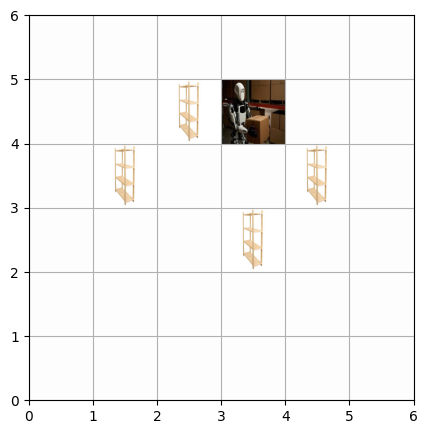

Step 8: Action = Right, Position=(4, 4), Carrying=True, Reward=-1


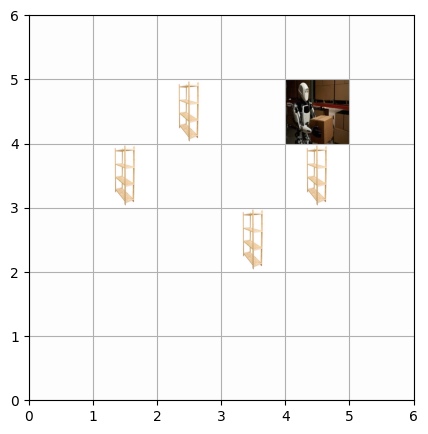

Step 9: Action = Up, Position=(4, 5), Carrying=True, Reward=-1


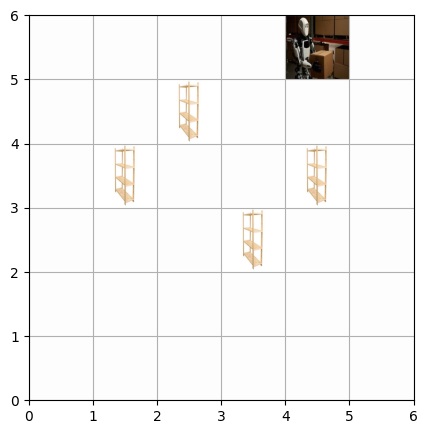

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


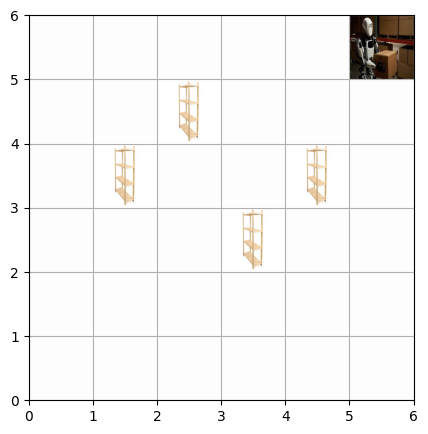

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


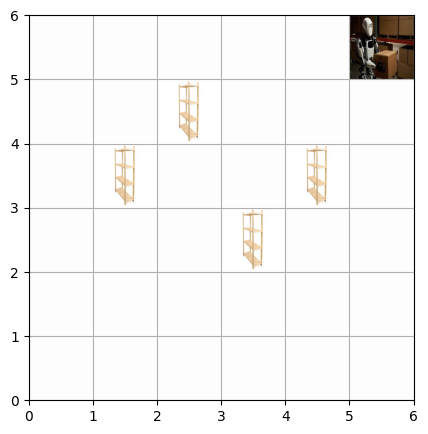

Episode 10: Task completed and the Total Reward is 115


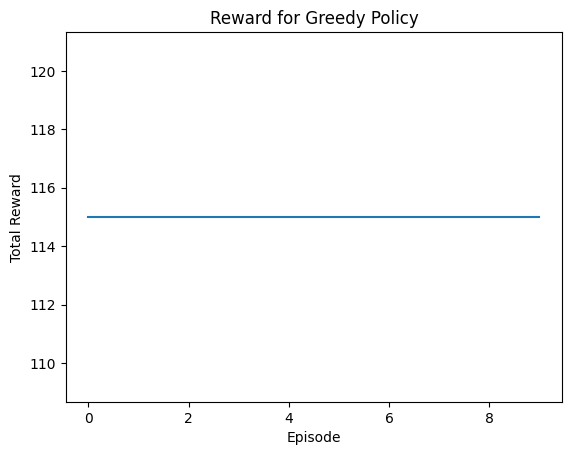

In [168]:
def test_agent(number_episodes=10):
    rewards_per_episode = []
    
    for episode_number in range(number_episodes):
        state, _ = environment.reset()
        state = tuple(state)
        reward_total = 0
        done = False
        step = 0
        
        while not done:
            action = np.argmax(Q_table[state])
            next_state, reward, done, _, _ = environment.step(action)
            next_state = tuple(next_state)
            reward_total += reward
            print(f"Step {step}: Action = {mapped_actions[action]}, Position={next_state[:2]}, Carrying={bool(next_state[2])}, Reward={reward}")
            environment.render()
            state = next_state
            step += 1
            if done:
                print(f"Episode {episode_number + 1}: Task completed and the Total Reward is {reward_total}")
                break
        rewards_per_episode.append(reward_total)
    
    plt.figure()
    plt.plot(rewards_per_episode)
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.title('Reward for Greedy Policy')
    plt.show()
    return rewards_per_episode
test_rewards_q_learning = test_agent()


### Hyperparameter Tuning:

In [169]:
def start_the_q_table(environment):
    return defaultdict(lambda: np.zeros(environment.action_space.n))

def epsilon_greedy_policy(Q_table, state, epsilon, environment):
    if random.uniform(0, 1) < epsilon:
        return environment.action_space.sample()
    else:
        return np.argmax(Q_table[state])

def train_q_learning(environment, gamma, epsilon_decay, num_episodes=500, alpha=0.1, epsilon=1.0, epsilon_min=0.1):
    Q_table = start_the_q_table(environment)
    print("\nInitial Q_table-table (first 10 states):")
    for state in list(Q_table.keys())[:10]:
        print(f"{state}: {Q_table[state]}")

    rewards_per_episode = []
    epsilon_values = []
    
    for episode in range(num_episodes):
        state, _ = environment.reset()
        state = tuple(state)
        total_reward = 0
        done = False
        
        while not done:
            action = epsilon_greedy_policy(Q_table, state, epsilon, environment)
            next_state, reward, done, _, _ = environment.step(action)
            next_state = tuple(next_state)
            best_next_action = np.argmax(Q_table[next_state])
            Q_table[state][action] += alpha * (reward + gamma * Q_table[next_state][best_next_action] - Q_table[state][action])
            state = next_state
            total_reward += reward
        
        rewards_per_episode.append(total_reward)
        epsilon_values.append(epsilon)
        epsilon = max(epsilon_min, epsilon * epsilon_decay)

    print("\nFinal Q_table-table (first 10 states):")

    for state in list(Q_table.keys())[:10]:
        print(f"{state}: {Q_table[state]}")
    
    return Q_table, rewards_per_episode, epsilon_values

In [170]:
def test_function(environment, Q_table, num_episodes=10):
    rewards_per_episode = []
    
    for episode in range(num_episodes):
        state, _ = environment.reset()
        state = tuple(state)  
        total_reward = 0
        done = False
    
        while not done:
            action = np.argmax(Q_table[state])
            next_state, reward, done, _, _ = environment.step(action)
            state = tuple(next_state)
            total_reward += reward
        
        rewards_per_episode.append(total_reward)

    plt.figure()
    plt.plot(rewards_per_episode)
    plt.xlabel("Episode")
    plt.ylabel("Total Reward")
    plt.title("Greedy Policy with Tuned Parameters")
    plt.show()

In [171]:
def evaluate_hyperparameters(trial):
    gamma = trial.suggest_float("gamma", 0.8, 0.99)
    epsilon_decay = trial.suggest_float("epsilon_decay", 0.95, 0.999)
    environment = Warehouse_robot()
    Q, rewards, epsilon_values = train_q_learning(environment, gamma, epsilon_decay)
    plt.figure()
    plt.plot(rewards)
    plt.xlabel("Episode")
    plt.ylabel("Total Reward")
    plt.title(f"Q-Learning Performance (gamma={gamma}, epsilon_decay={epsilon_decay})")
    plt.show()
    plt.figure()
    plt.plot(epsilon_values)
    plt.xlabel("Episode")
    plt.ylabel("Epsilon Value")
    plt.title(f"Epsilon Decay Over Episodes (gamma={gamma}, epsilon_decay={epsilon_decay})")
    plt.show()
    test_function(environment, Q)
    return np.mean(rewards[-50:])

[I 2025-02-18 19:46:00,649] A new study created in memory with name: no-name-9f9880e6-0b23-4e68-8c87-109190b72fac



Initial Q_table-table (first 10 states):

Final Q_table-table (first 10 states):
(0, 0, 0): [ 371.68778772 1178.90969665  506.95606564  147.26123112  450.60247457
  138.3376911 ]
(1, 0, 0): [-2.67567807e-01  7.11095181e+02  9.47364917e+00 -6.79720151e-01
 -1.02365633e+00  3.73546874e-01]
(2, 0, 0): [-0.97301855  1.93252875 -0.76991835 -0.61984371 -0.98343089 -0.5904509 ]
(1, 1, 0): [ 203.2905265  1313.76263519  259.01444511   45.17588577  177.19544967
  374.28783213]
(3, 0, 0): [-0.76747572 -0.59452508 -0.37625683 -0.41908013 -0.72415631 -0.64473746]
(4, 0, 0): [-0.271      -0.19957013 -0.20818324 -0.61961049 -0.40951    -0.35347013]
(5, 0, 0): [-0.65927056 -0.42769324 -0.43544504 -0.55209855 -0.43544504 -0.9490517 ]
(5, 1, 0): [-0.32201674 -0.48674224 -0.19       -0.19957013 -0.44242166 -0.1       ]
(4, 1, 0): [-0.10957013 -0.37069635 -0.66998594 -0.29693504 -0.3439     -0.1       ]
(4, 2, 0): [-0.5217031  -8.22474816 -9.43371216 -0.19       -0.4657632  -0.82112998]


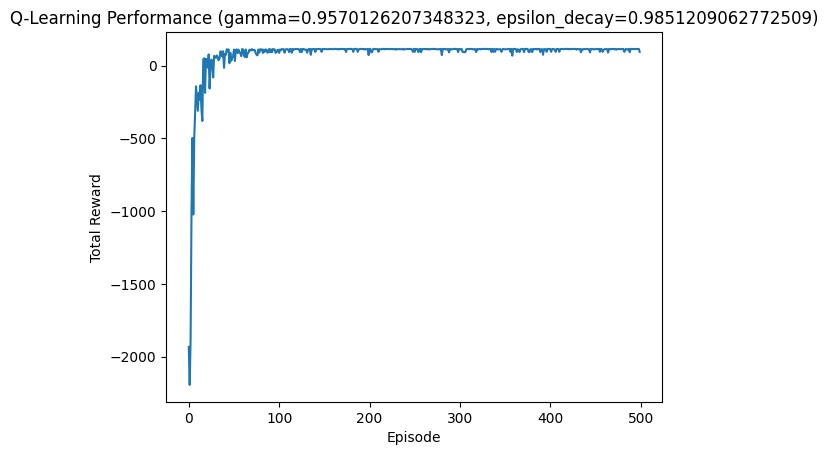

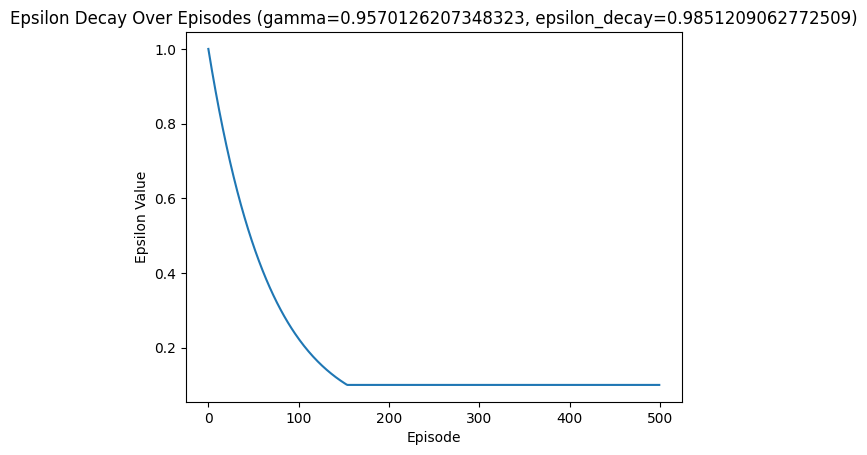

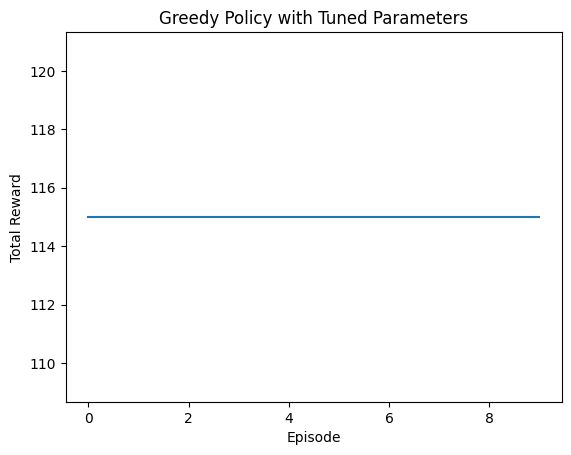

[I 2025-02-18 19:46:01,368] Trial 0 finished with value: 111.28 and parameters: {'gamma': 0.9570126207348323, 'epsilon_decay': 0.9851209062772509}. Best is trial 0 with value: 111.28.



Initial Q_table-table (first 10 states):

Final Q_table-table (first 10 states):
(0, 1, 0): [112.60954167   9.96965947  43.94730025 587.37590413  -0.59018421
  -0.59982649]
(0, 0, 0): [335.88944725 255.5568172  336.08960831 670.97277383 250.25593636
 225.80572231]
(0, 2, 0): [ -0.4143081   -0.60577357  10.39842653 114.32574551  -0.72699182
  -0.19933983]
(1, 2, 0): [132.65950046 455.83326625  13.3445806  840.09631064 297.82383852
 261.58506768]
(2, 2, 0): [195.5939105  135.33976463 118.58938245 473.91627746 904.48757963
 395.84260363]
(2, 2, 1): [ 52.13680999 945.56277153  76.6075924  454.88062132 234.46894168
 473.68406835]
(2, 3, 1): [ 336.96187311  384.6288752   353.60536654 1017.23041838  395.82177301
  300.49157989]
(3, 3, 1): [ 455.39234414 1093.78374613  538.3478638   454.46867034  332.56543461
  604.30999953]
(3, 4, 1): [ 596.81015932 1175.97656525  675.23435206  267.0856545   509.40018473
  504.32778552]
(4, 4, 1): [-1.68879670e+00  1.28115633e+00 -5.33950477e-01  7.62927625e

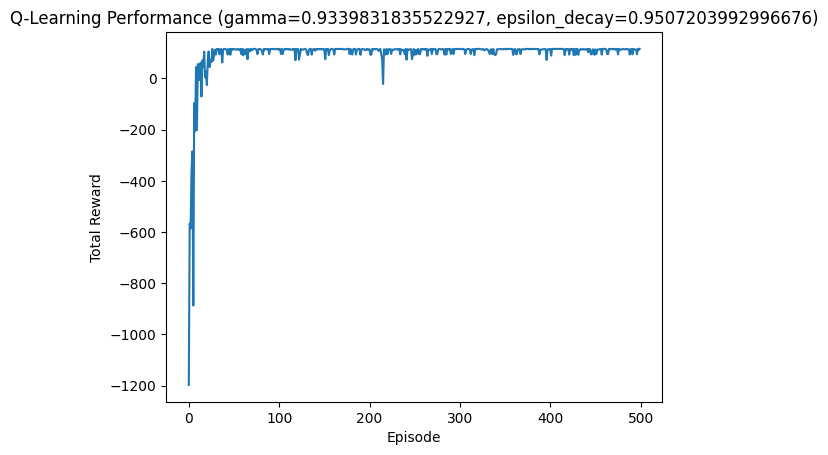

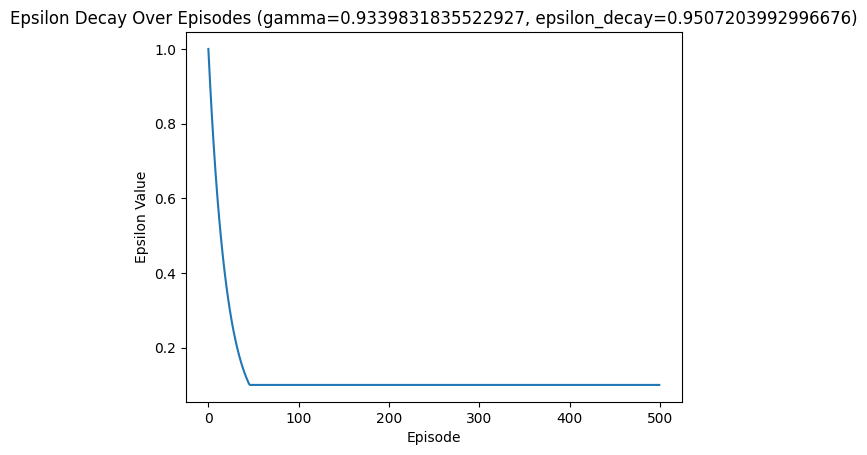

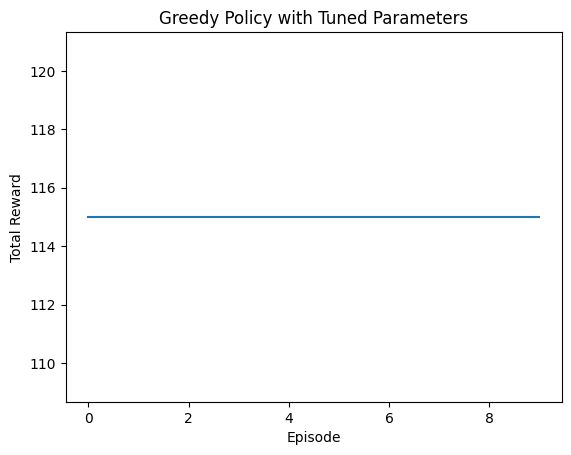

[I 2025-02-18 19:46:02,062] Trial 1 finished with value: 110.72 and parameters: {'gamma': 0.9339831835522927, 'epsilon_decay': 0.9507203992996676}. Best is trial 0 with value: 111.28.



Initial Q_table-table (first 10 states):

Final Q_table-table (first 10 states):
(0, 1, 0): [ 970.17629709  621.7508047   783.76855488 2786.03428397  720.9573877
  900.37894754]
(0, 0, 0): [ 773.40600198 2699.13117558  801.44656774   57.40218221 1267.60052736
  799.1381768 ]
(1, 1, 0): [  63.67045676 2880.02159116  879.70290201  615.46464175  614.9155276
  705.38684606]
(1, 0, 0): [ -1.11470416  -0.69451675  -0.82724992 396.38415723  11.69741662
  -0.98164818]
(1, 2, 0): [ 525.06727912  977.11514792  648.44069381 2976.40733448  561.09203556
  774.56810171]
(2, 2, 0): [ 222.91897783   74.54614589 1212.63319236 1247.77341111 3069.01937699
  564.72667966]
(2, 1, 0): [ 6.15630067e+00  2.20686099e+03 -4.14690377e-01 -5.53466611e-01
  7.19242766e+01  1.08642866e+00]
(2, 0, 0): [-5.70926673e-01  1.10334478e+03 -4.74989690e-01 -3.53775142e-01
  8.70153696e+01 -3.28822029e-01]
(3, 0, 0): [-0.1        -0.37066164 -0.20239502 -0.28976277 -0.3439     -0.468559  ]
(3, 1, 0): [ -0.40951     -9.4220

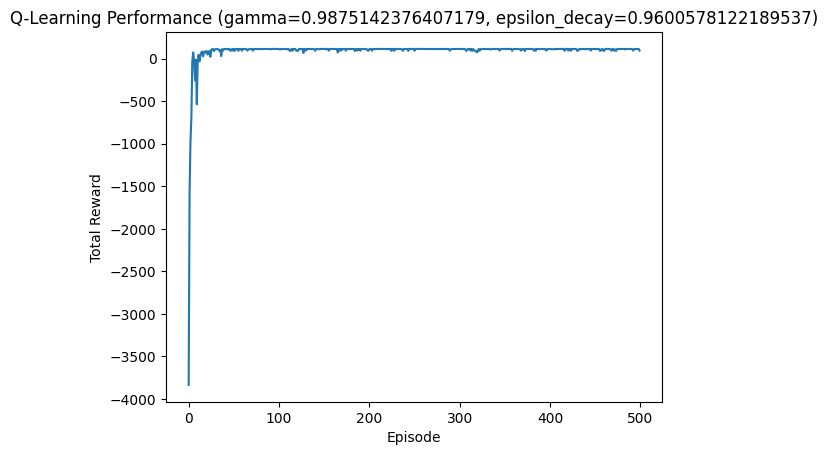

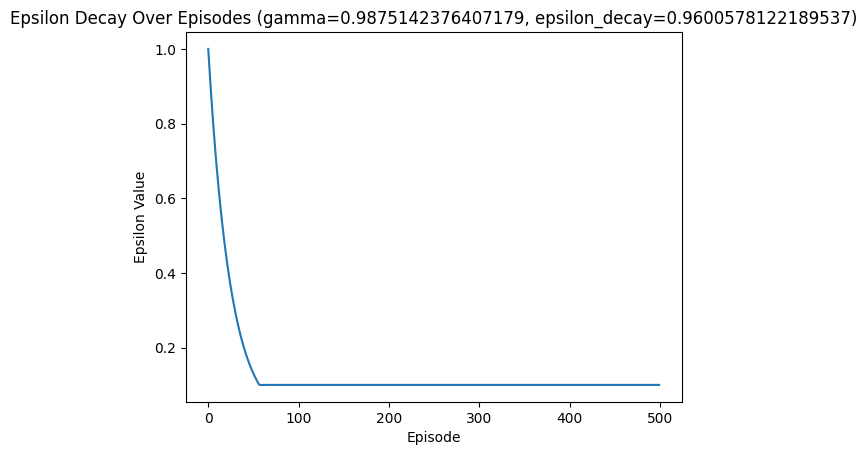

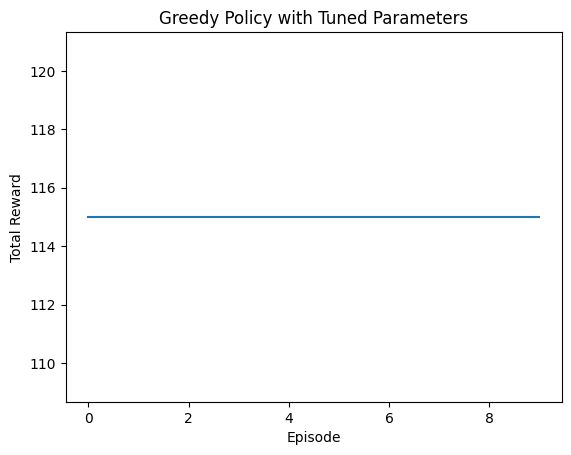

[I 2025-02-18 19:46:02,912] Trial 2 finished with value: 110.14 and parameters: {'gamma': 0.9875142376407179, 'epsilon_decay': 0.9600578122189537}. Best is trial 0 with value: 111.28.



Initial Q_table-table (first 10 states):

Final Q_table-table (first 10 states):
(0, 1, 0): [-9.74643217e-01  5.02094951e-01 -4.75102587e-01  4.82192109e+02
  2.28740189e+01 -3.87223761e-01]
(0, 0, 0): [176.96499166  94.77614425 250.06662863 768.98591439 326.34644478
 253.10957906]
(1, 1, 0): [395.55084477 121.84948597 155.42029305 883.46676133 366.32863993
 290.76387428]
(2, 1, 0): [217.795615   946.4582304  441.63759224 102.59368649 210.03683275
 388.98919794]
(2, 2, 0): [ 315.21062009   38.79382745  263.81053857  385.00074018 1013.41835781
  442.0201383 ]
(2, 2, 1): [ 139.60254952 1056.96697917  133.68935641  491.32752578  392.16451027
  300.3582008 ]
(2, 1, 1): [ -2.12062761 496.93015636  -1.94630883  -1.95039478  -2.0043659
  -1.95497856]
(1, 1, 1): [-2.0180594  -1.98486493 -1.94354878 -1.94718635 -2.01047011 -2.00523216]
(2, 0, 1): [-1.87470626 -1.93008208 -1.96700271 -1.92576512 -1.8829854  -1.87527161]
(3, 0, 1): [-1.65289415 -1.73715187 -1.74400489 -1.66855875 -1.74480685 -1.

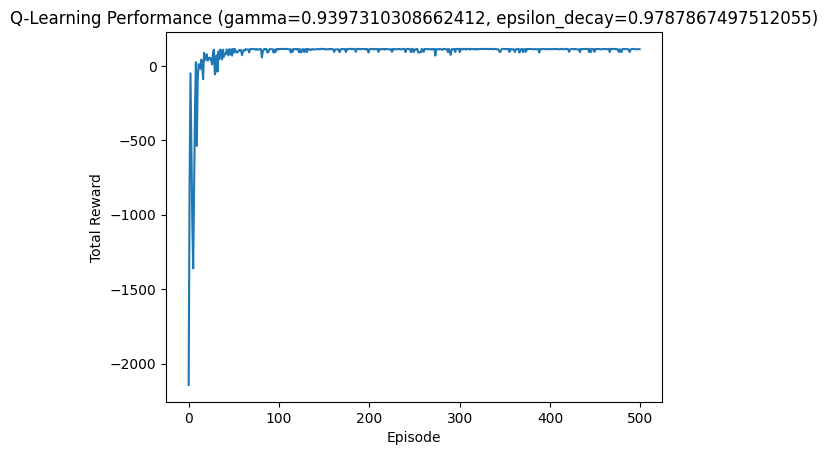

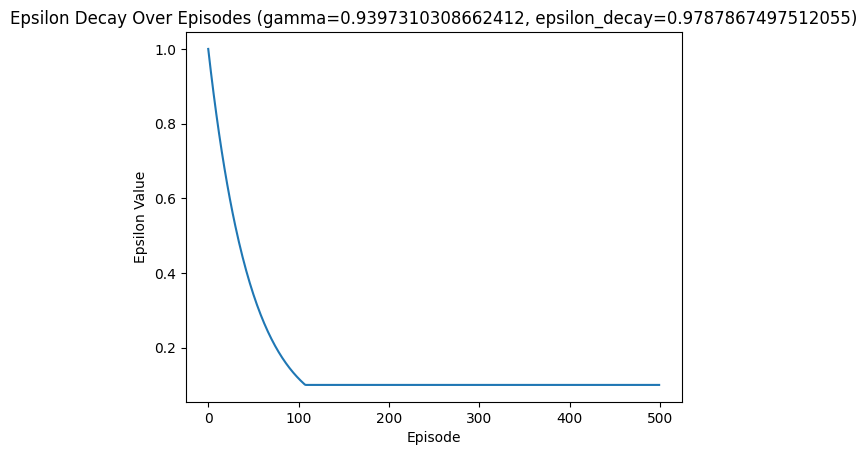

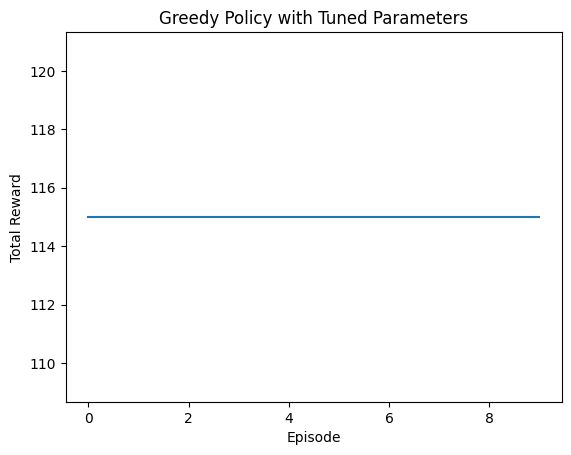

[I 2025-02-18 19:46:03,659] Trial 3 finished with value: 111.76 and parameters: {'gamma': 0.9397310308662412, 'epsilon_decay': 0.9787867497512055}. Best is trial 3 with value: 111.76.



Initial Q_table-table (first 10 states):

Final Q_table-table (first 10 states):
(0, 0, 0): [129.88545063 373.933471    96.94946484  67.5299565   32.22004792
 143.85506048]
(1, 0, 0): [ -1.06490137 250.78731596  -1.24153724  -0.85439482   8.46876118
  -0.75699531]
(1, 1, 0): [ 39.70262801 458.37831891  41.54041668  90.38612166 145.2619002
 166.5168798 ]
(0, 1, 0): [ 86.09080125 120.30584721 234.18908725 414.10774382 172.32590063
 195.51438324]
(0, 2, 0): [ 3.66852145e-02 -6.99659669e-01 -6.05512677e-01  3.87638162e+02
 -4.69122415e-01 -6.00179825e-01]
(1, 2, 0): [235.83519712 159.77659867 190.10148942 507.14306949 170.57020517
 199.73747151]
(2, 2, 0): [111.07111451 101.09110639 249.66352065 258.90508808 560.83476414
 132.13167156]
(2, 1, 0): [-7.60625226e-01  3.64810907e+02 -5.49477804e-01 -6.33420022e-01
 -5.04279993e-01 -3.52087575e-01]
(2, 0, 0): [-0.62247517  0.28002541 -0.76461534 -1.05368914 -0.59893187 -0.78543452]
(3, 0, 0): [-0.76984432 -0.75882321 -0.73771345 -1.26937843 -0

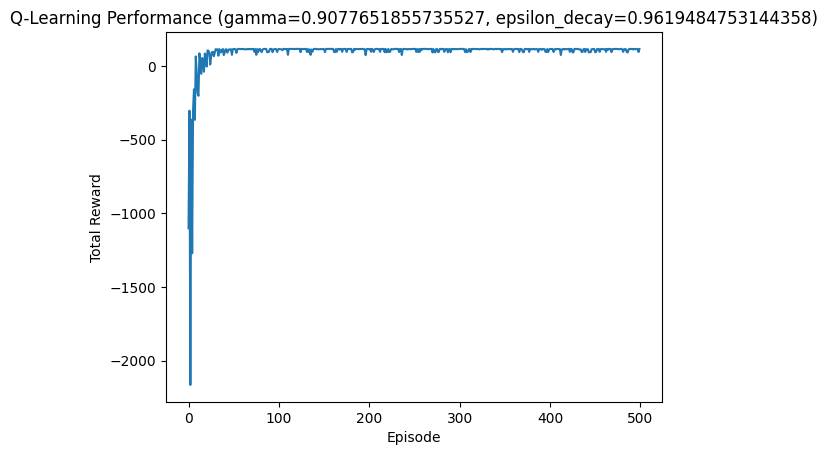

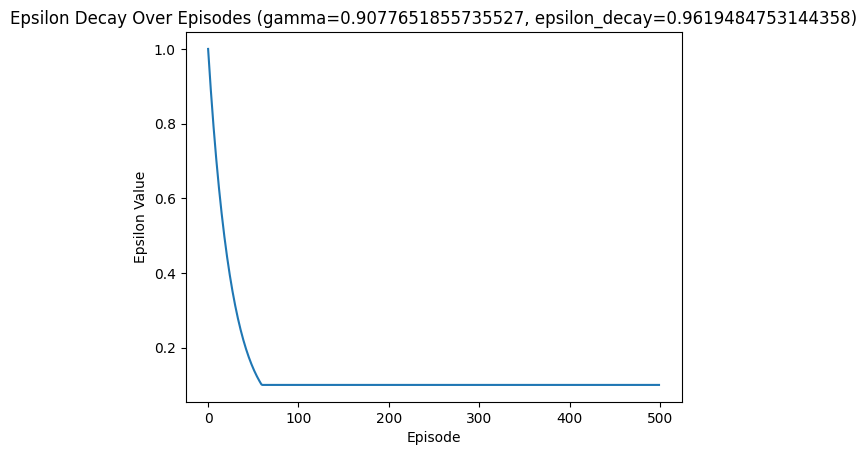

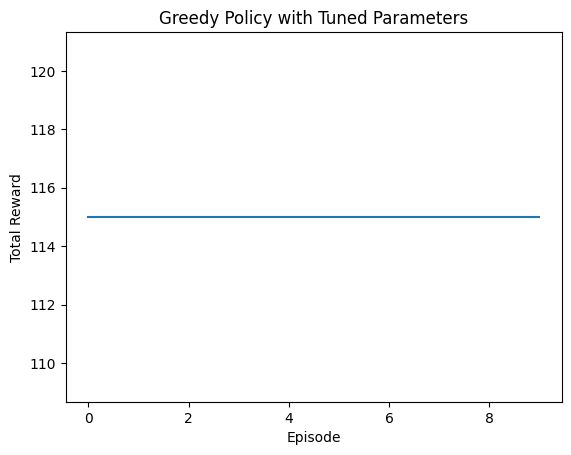

[I 2025-02-18 19:46:04,311] Trial 4 finished with value: 110.16 and parameters: {'gamma': 0.9077651855735527, 'epsilon_decay': 0.9619484753144358}. Best is trial 3 with value: 111.76.



Initial Q_table-table (first 10 states):

Final Q_table-table (first 10 states):
(0, 1, 0): [ -0.73620571  -0.47565044  -0.66521561 116.44318704  -0.83571958
  -0.65861231]
(0, 0, 0): [  8.78491763  29.81436844  44.40975951 124.68779762  39.32765007
  28.75811379]
(1, 1, 0): [ 40.66780386 174.31079436  40.00279331  50.20476028  51.71466859
  79.52468811]
(1, 0, 0): [ 63.45154328 147.52109744  52.02053672  15.19576676  57.89163244
  77.10578819]
(2, 0, 0): [-0.69887265 67.0373909  -0.67256483 -0.7986891  -0.64644184 -0.47730502]
(2, 1, 0): [ -0.59583076 174.98696342  -0.33205294  -0.5088152    3.52482052
  -0.46481736]
(3, 1, 0): [-0.84677882 -8.23272952 -0.08655636 -0.55070277 -0.70218537 -0.39123142]
(4, 1, 0): [-0.51637707 -0.44100861 -0.6418939  -0.57437632 -0.56362775 -0.49242649]
(4, 0, 0): [-0.50692562 -0.83734731 -0.41533897 -0.38230313 -0.50005761 -0.29559409]
(5, 0, 0): [-0.36849409 -0.29559409 -0.52210449 -0.56164355 -0.1985241  -0.28719579]


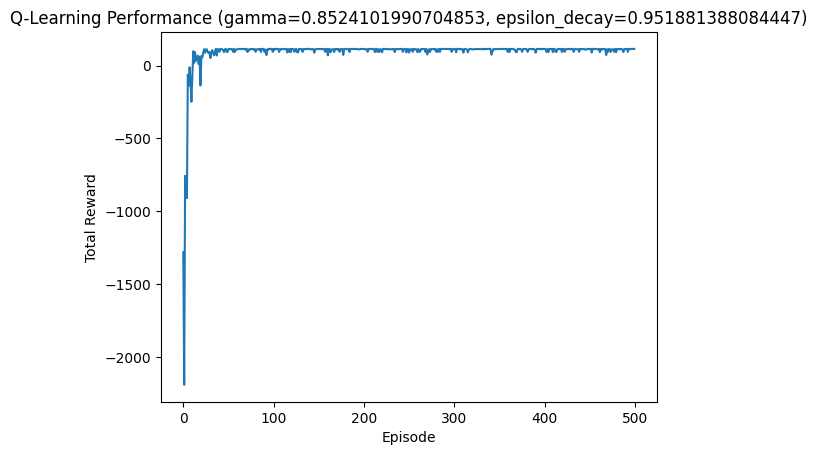

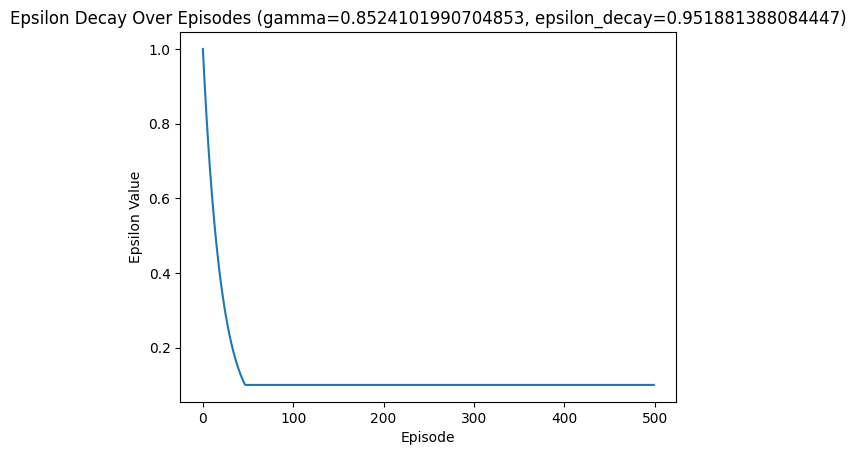

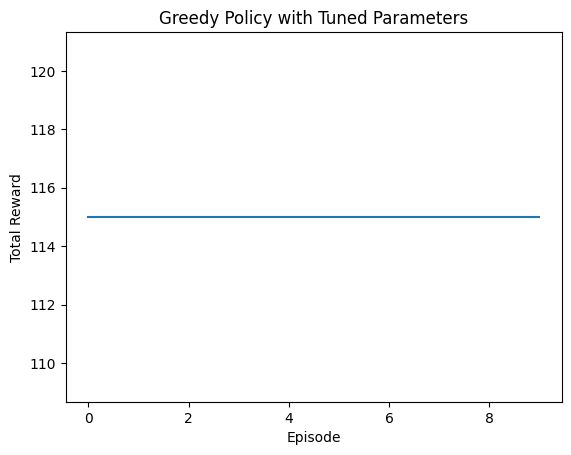

[I 2025-02-18 19:46:05,322] Trial 5 finished with value: 109.92 and parameters: {'gamma': 0.8524101990704853, 'epsilon_decay': 0.951881388084447}. Best is trial 3 with value: 111.76.


Best hyperparameters: {'gamma': 0.9397310308662412, 'epsilon_decay': 0.9787867497512055}

Initial Q_table-table (first 10 states):

Final Q_table-table (first 10 states):
(0, 1, 0): [174.93583928   8.97116242 215.22823009 824.02590191 257.68808135
 287.97454736]
(0, 0, 0): [273.42054802 768.21541131 451.81348646 254.623794   174.33133036
 256.23574461]
(1, 0, 0): [ 28.96470051 635.81194624  -1.20534721   1.67193092  -1.36707111
  -1.24619383]
(0, 2, 0): [-0.99313508 -1.08668979 -0.69703886 65.13129696  4.17032145 -0.16554011]
(1, 2, 0): [ 1.74945712e-02 -9.35639419e+00 -1.83677541e-01  5.33135132e+02
  2.71802891e+00  2.24250045e+00]
(1, 1, 0): [206.48662283  89.85402162 401.2132283  882.70240202 326.24113451
 198.95357491]
(2, 1, 0): [139.08553228 945.7164496  479.97165832 205.93867179 396.32802292
 210.79150568]
(2, 0, 0): [-5.30149896e-01  4.65210791e+02 -1.02438939e+00 -4.44383002e-01
 -3.25080591e-01 -6.79370536e-01]
(3, 1, 0): [-6.53817726e-01  4.41772606e+00  5.29049688e+02 -4.9

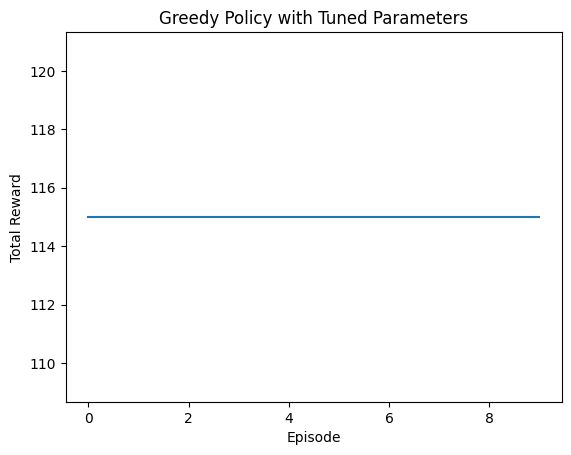

In [172]:
study = optuna.create_study(direction="maximize")
study.optimize(evaluate_hyperparameters, n_trials=6)
best_params = study.best_params
print("Best hyperparameters:", best_params)
environment = Warehouse_robot()
Q, rewards, epsilon_values = train_q_learning(environment, best_params["gamma"], best_params["epsilon_decay"])

with open("q_table_tuned.pkl", "wb") as f:
    pickle.dump(dict(Q), f)

print("Tuned Q-table saved as q_table_tuned.pkl")
test_function(environment, Q)

### Stochastic environment:

In [173]:
env = Stochastic_warehouse()
gamma = 0.9
alpha = 0.1
epsilon = 0.1
number_episodes = 500
Q = defaultdict(lambda: np.zeros(env.action_space.n))
print("Initial Q-table:")
print(dict(Q))

def epsilon_greedy_policy(state, epsilon):
    if random.uniform(0, 1) < epsilon:
        return env.action_space.sample()
    else:
        return np.argmax(Q[state])

def train_q_learning():
    rewards_per_episode = []
    epsilon_values = []
    epsilon = 1.0

    for episode in range(number_episodes):
        state, _ = env.reset()
        state = tuple(state)
        total_reward = 0
        done = False
        truncated = False

        while not (done or truncated):
            action = epsilon_greedy_policy(state, epsilon)
            next_state, reward, done, truncated, _ = env.step(action)
            next_state = tuple(next_state)
            best_next_action = np.argmax(Q[next_state])
            Q[state][action] += alpha * (reward + gamma * Q[next_state][best_next_action] - Q[state][action])
            state = next_state
            total_reward += reward
        
        rewards_per_episode.append(total_reward)
        epsilon = max(0.01, epsilon * 0.995)
        epsilon_values.append(epsilon)
        if (episode + 1) % 50 == 0:
            print(f"Episode {episode + 1}, Total Reward: {total_reward}, Epsilon: {epsilon}")
    
    return rewards_per_episode, epsilon_values


train_rewards_q_learning_stochastic, epsilon_values = train_q_learning()
print("Trained Q-table:")
print(dict(Q))

with open("q_table_stochastic.pkl", "wb") as f:
    pickle.dump(dict(Q), f)

print("Q-table saved as q_table_stochastic.pkl")

Initial Q-table:
{}
Episode 50, Total Reward: 26, Epsilon: 0.778312557068642
Episode 100, Total Reward: 103, Epsilon: 0.6057704364907278
Episode 150, Total Reward: 76, Epsilon: 0.47147873742168567
Episode 200, Total Reward: 101, Epsilon: 0.3669578217261671
Episode 250, Total Reward: 103, Epsilon: 0.285607880564032
Episode 300, Total Reward: 89, Epsilon: 0.22229219984074702
Episode 350, Total Reward: 105, Epsilon: 0.1730128104744653
Episode 400, Total Reward: 87, Epsilon: 0.1346580429260134
Episode 450, Total Reward: 108, Epsilon: 0.10480604571960442
Episode 500, Total Reward: 112, Epsilon: 0.08157186144027828
Trained Q-table:
{(0, 0, 0): array([154.65811477,  87.56964197, 160.64392356, 231.33764355,
       177.85910733, 164.5495745 ]), (0, 1, 0): array([ 44.26424011,  11.64385423,  23.5736632 , 127.34318142,
        13.02126148,  22.2097317 ]), (1, 1, 0): array([ 34.16773351, 232.73837416,  31.25400041,  69.83470223,
        73.39035851,  51.61643549]), (1, 2, 0): array([ 79.28500273, 

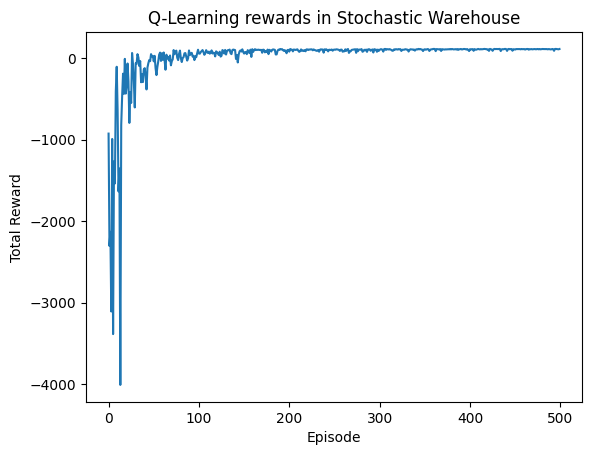

In [174]:
plt.figure()
plt.plot(train_rewards_q_learning_stochastic)
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.title('Q-Learning rewards in Stochastic Warehouse')
plt.show()

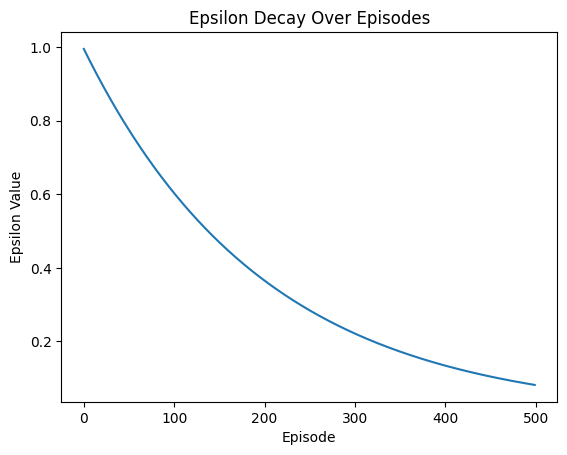

In [175]:
plt.figure()
plt.plot(epsilon_values)
plt.xlabel('Episode')
plt.ylabel('Epsilon Value')
plt.title('Epsilon Decay Over Episodes')
plt.show()

Step 0: Action=3, Position=(1, 0), Carrying=False, Reward=-1


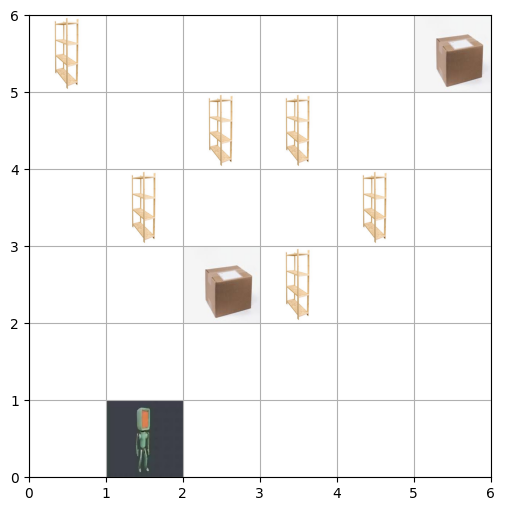

Step 1: Action=3, Position=(2, 0), Carrying=False, Reward=-1


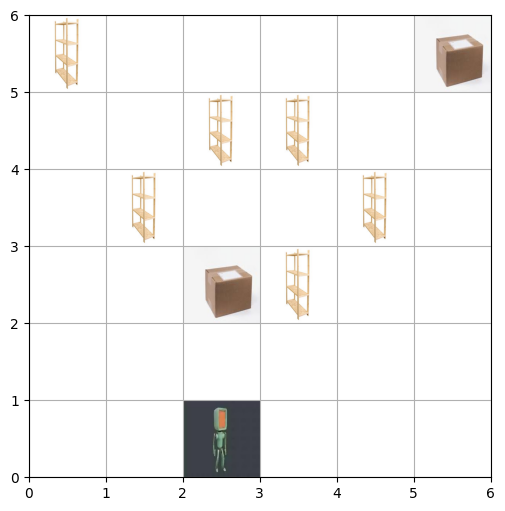

Step 2: Action=1, Position=(2, 1), Carrying=False, Reward=-1


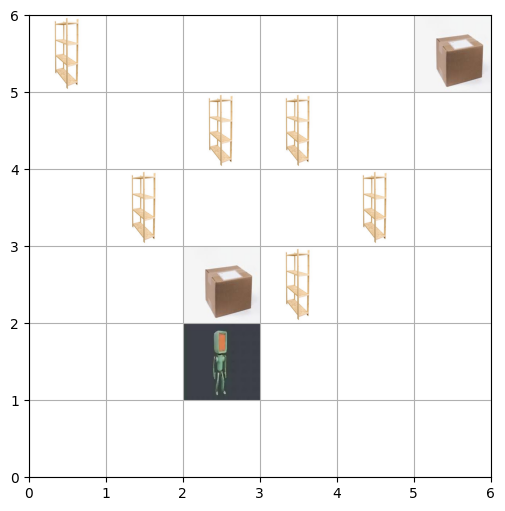

Step 3: Action=1, Position=(2, 2), Carrying=False, Reward=-1


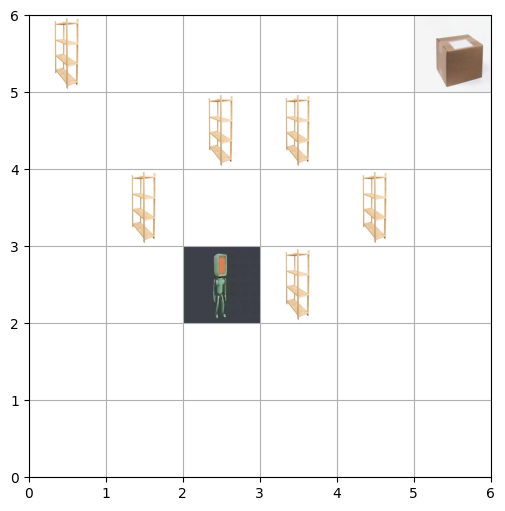

Step 4: Action=4, Position=(2, 2), Carrying=True, Reward=25


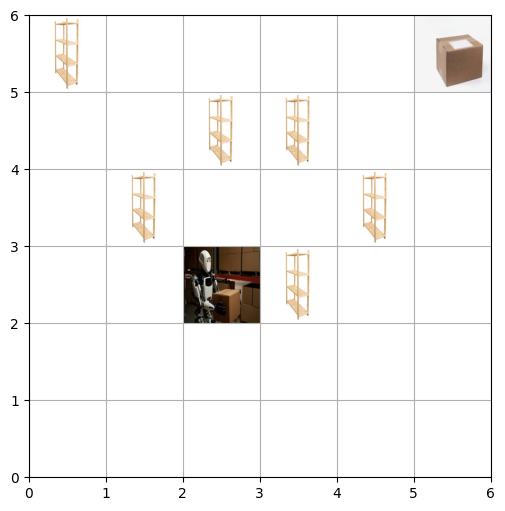

Step 5: Action=0, Position=(2, 1), Carrying=True, Reward=-1


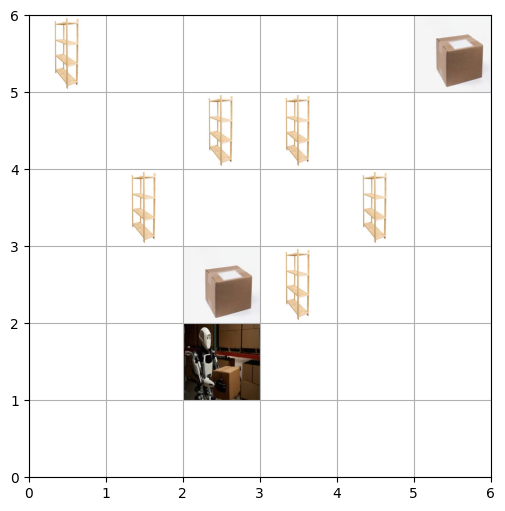

Step 6: Action=3, Position=(3, 1), Carrying=True, Reward=-1


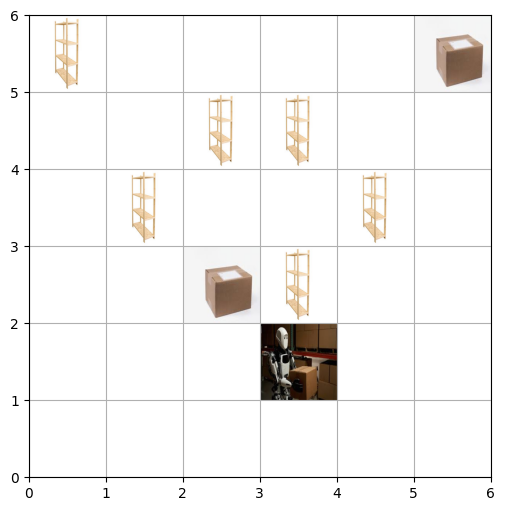

Step 7: Action=3, Position=(4, 1), Carrying=True, Reward=-1


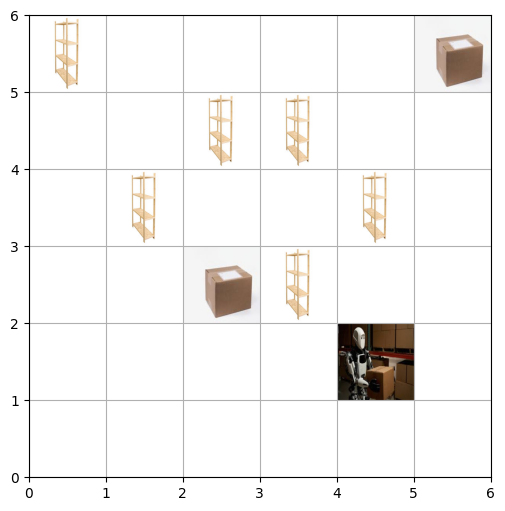

Step 8: Action=3, Position=(5, 1), Carrying=True, Reward=-1


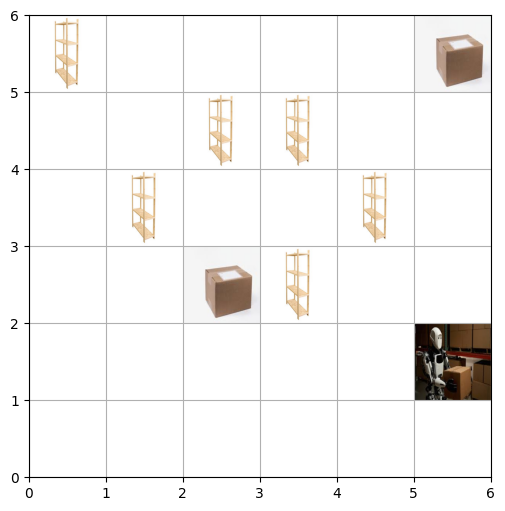

Step 9: Action=1, Position=(5, 2), Carrying=True, Reward=-1


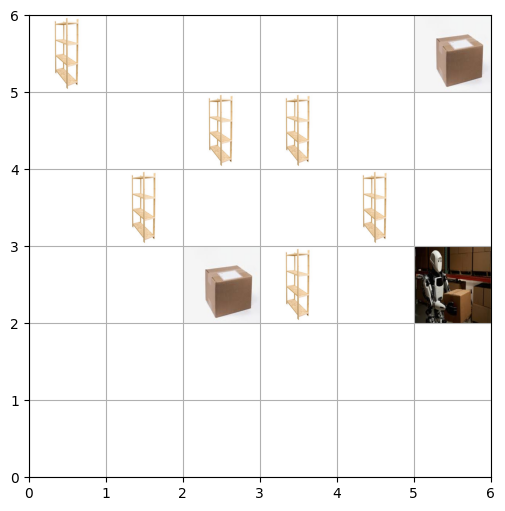

Step 10: Action=1, Position=(5, 3), Carrying=True, Reward=-1


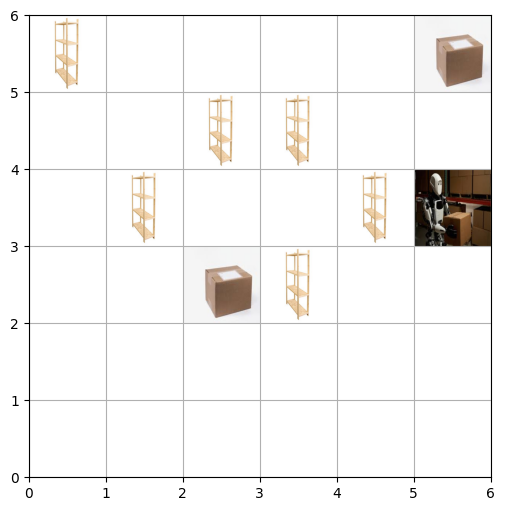

Step 11: Action=1, Position=(5, 4), Carrying=True, Reward=-1


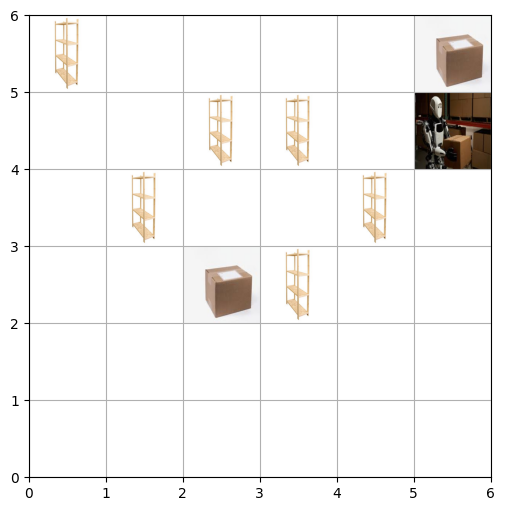

Step 12: Action=1, Position=(5, 5), Carrying=True, Reward=-1


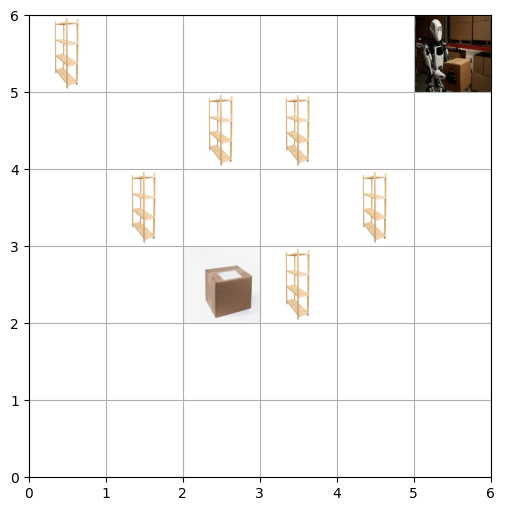

Step 13: Action=5, Position=(5, 5), Carrying=True, Reward=100


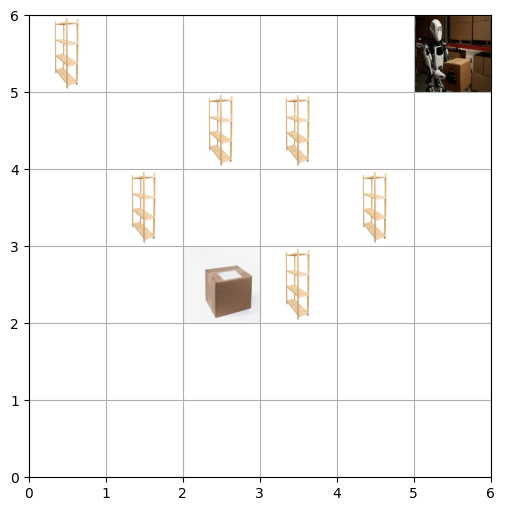

Episode 1: Task completed! Total Reward: 113
Step 0: Action=3, Position=(1, 0), Carrying=False, Reward=-1


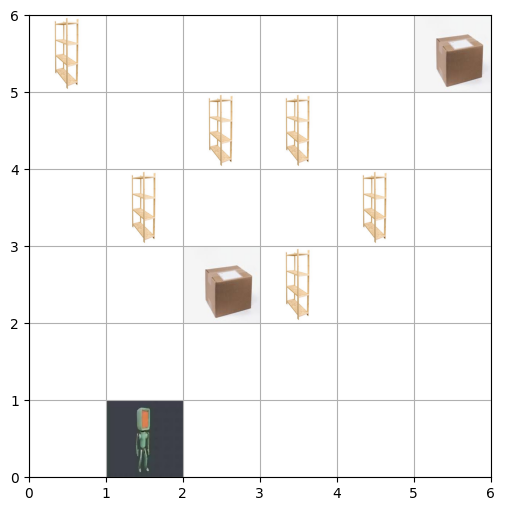

Step 1: Action=3, Position=(1, 0), Carrying=False, Reward=-1


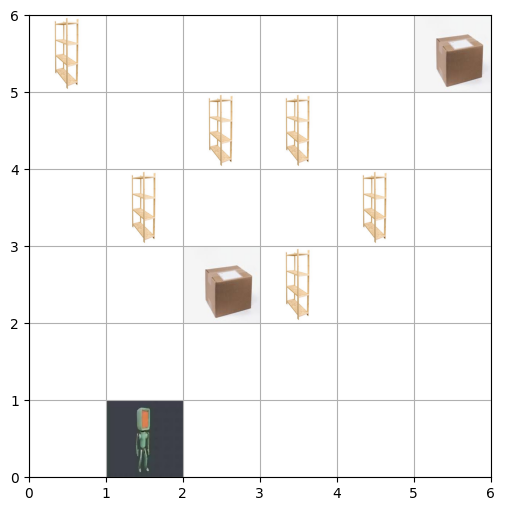

Step 2: Action=3, Position=(2, 0), Carrying=False, Reward=-1


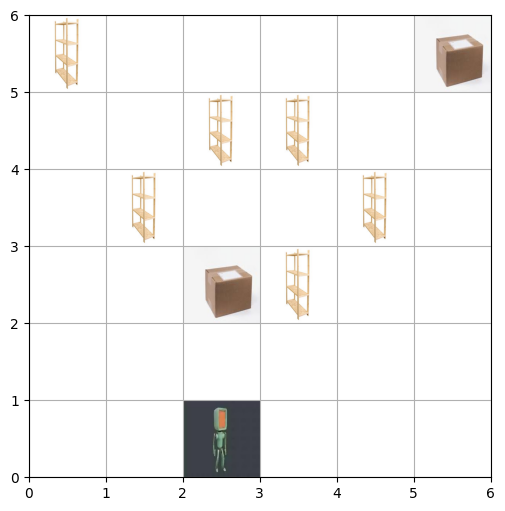

Step 3: Action=1, Position=(2, 1), Carrying=False, Reward=-1


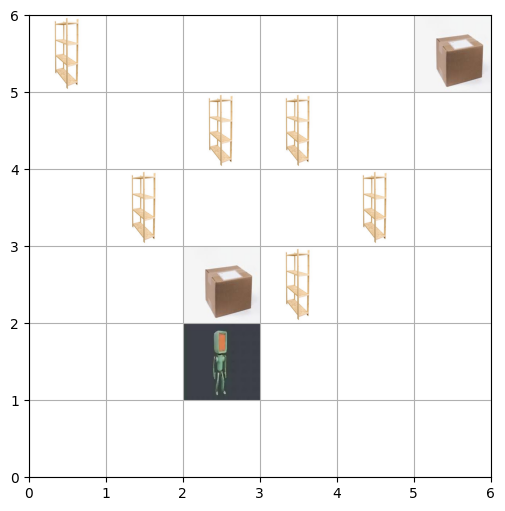

Step 4: Action=1, Position=(2, 2), Carrying=False, Reward=-1


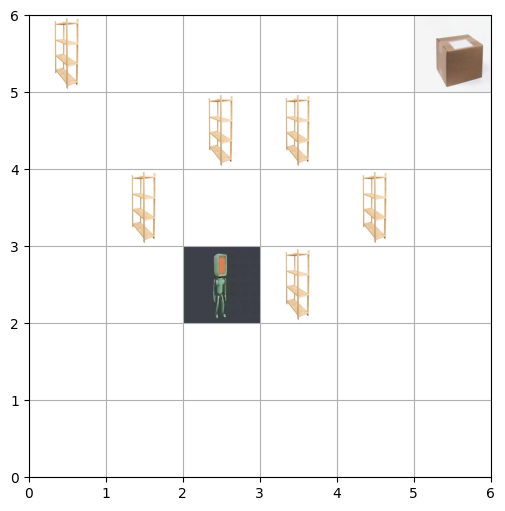

Step 5: Action=4, Position=(2, 2), Carrying=True, Reward=25


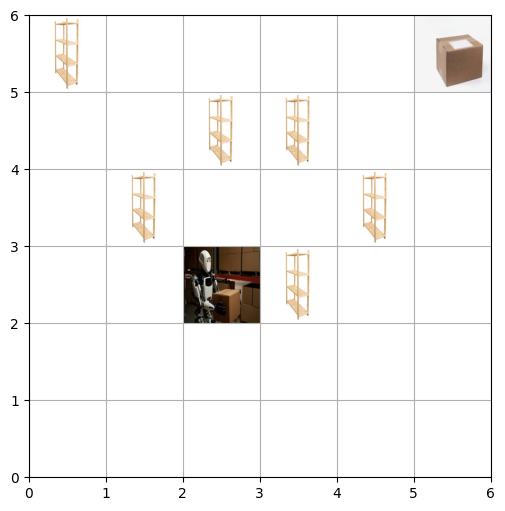

Step 6: Action=0, Position=(2, 1), Carrying=True, Reward=-1


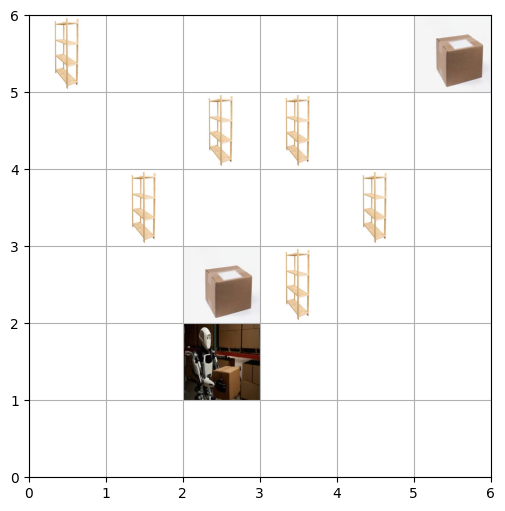

Step 7: Action=3, Position=(3, 1), Carrying=True, Reward=-1


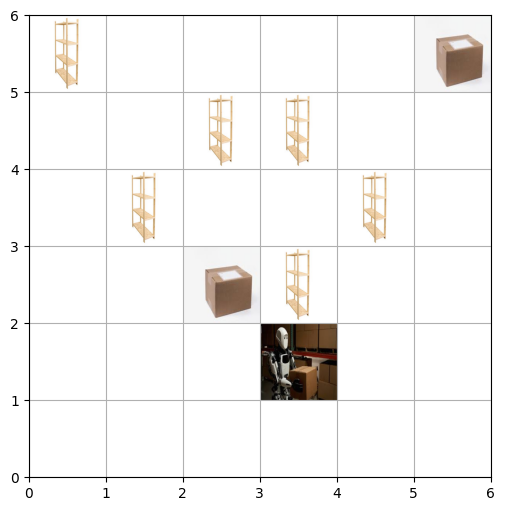

Step 8: Action=3, Position=(4, 1), Carrying=True, Reward=-1


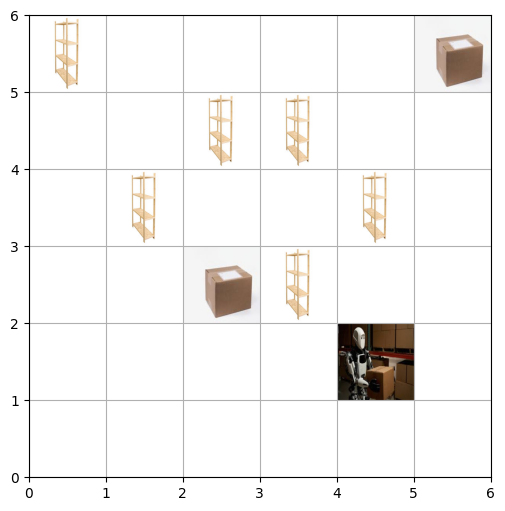

Step 9: Action=3, Position=(4, 1), Carrying=True, Reward=-1


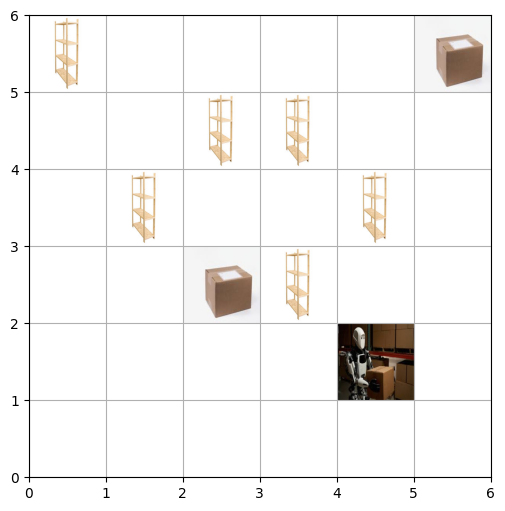

Step 10: Action=3, Position=(5, 1), Carrying=True, Reward=-1


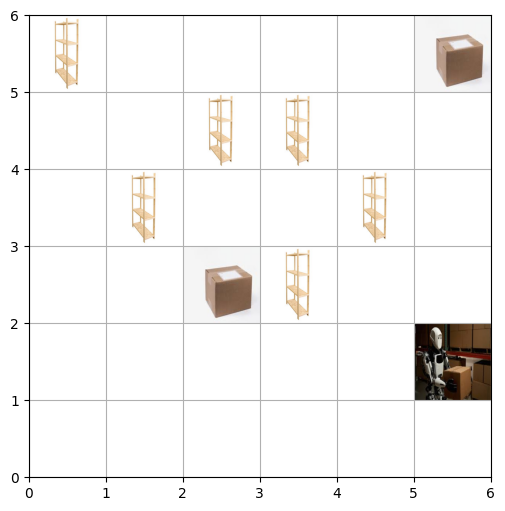

Step 11: Action=1, Position=(5, 2), Carrying=True, Reward=-1


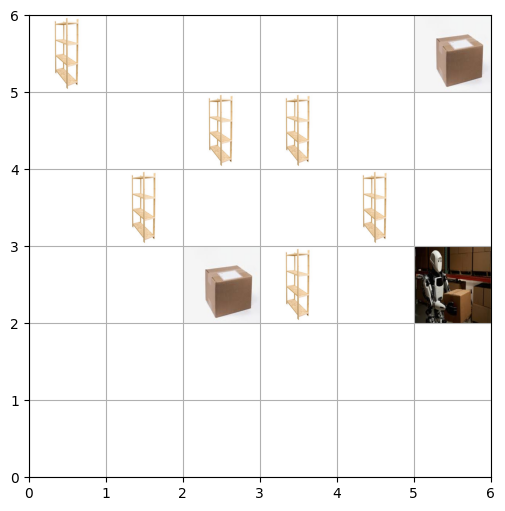

Step 12: Action=1, Position=(5, 3), Carrying=True, Reward=-1


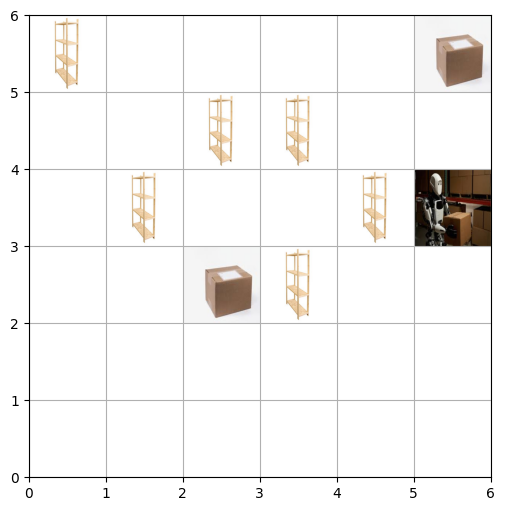

Step 13: Action=1, Position=(5, 4), Carrying=True, Reward=-1


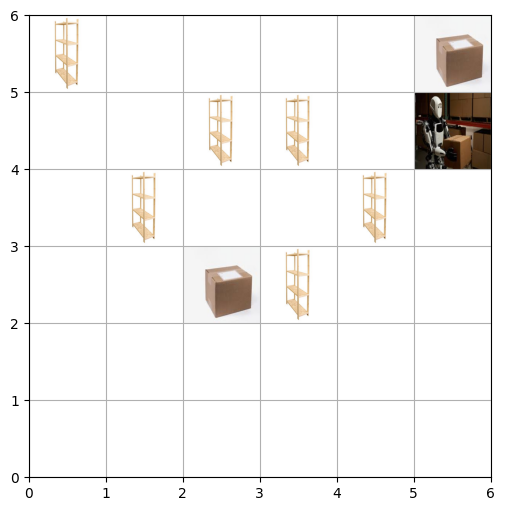

Step 14: Action=1, Position=(5, 5), Carrying=True, Reward=-1


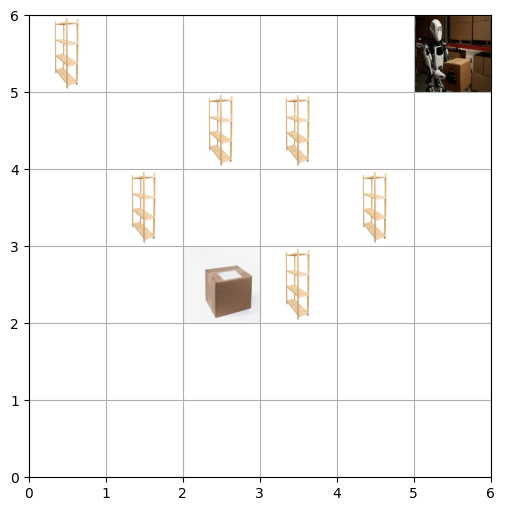

Step 15: Action=5, Position=(5, 5), Carrying=True, Reward=100


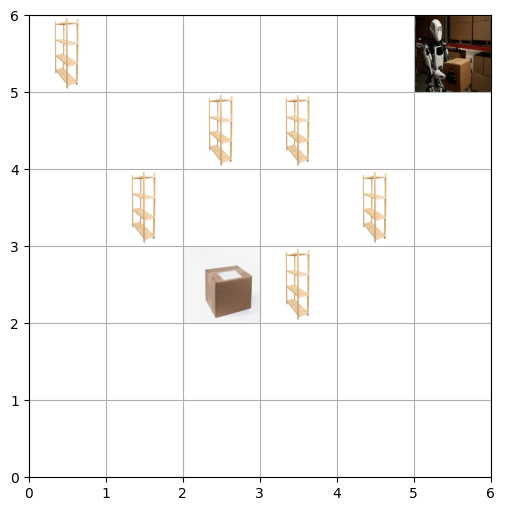

Episode 2: Task completed! Total Reward: 111
Step 0: Action=3, Position=(0, 0), Carrying=False, Reward=-1


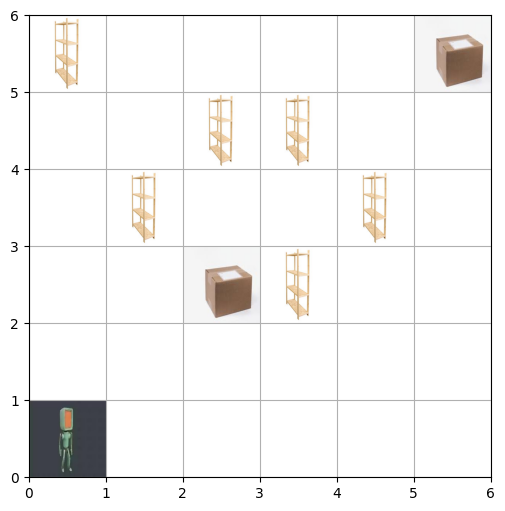

Step 1: Action=3, Position=(1, 0), Carrying=False, Reward=-1


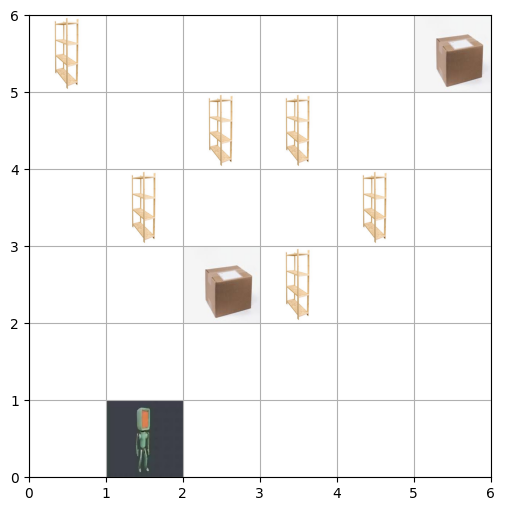

Step 2: Action=3, Position=(1, 0), Carrying=False, Reward=-1


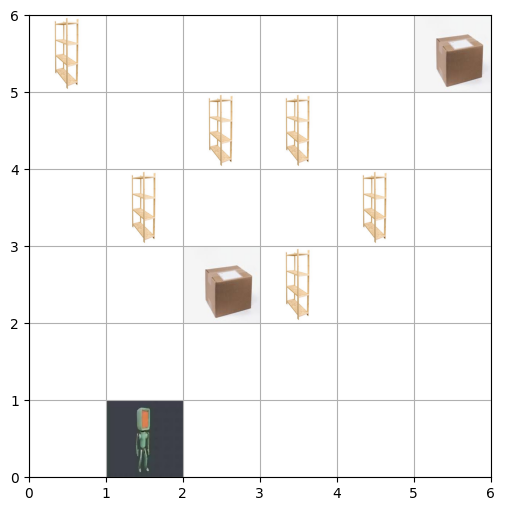

Step 3: Action=3, Position=(2, 0), Carrying=False, Reward=-1


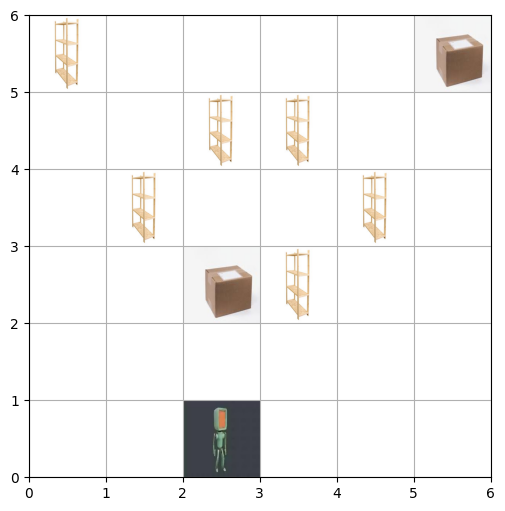

Step 4: Action=1, Position=(2, 1), Carrying=False, Reward=-1


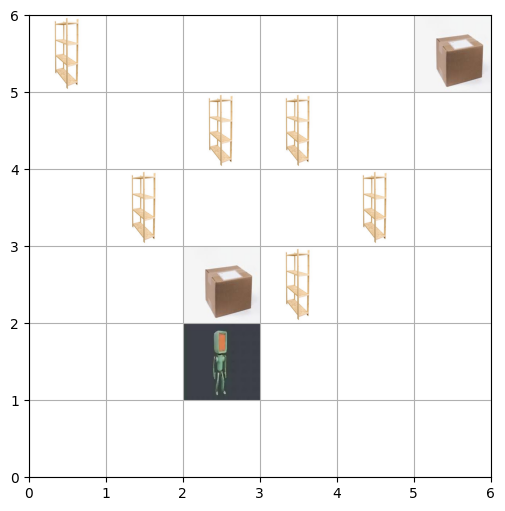

Step 5: Action=1, Position=(2, 2), Carrying=False, Reward=-1


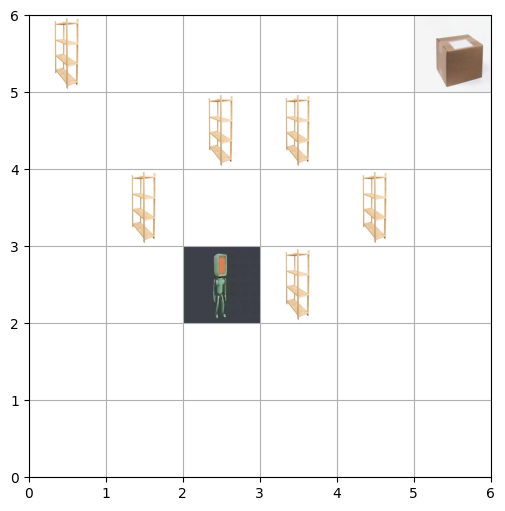

Step 6: Action=4, Position=(2, 2), Carrying=True, Reward=25


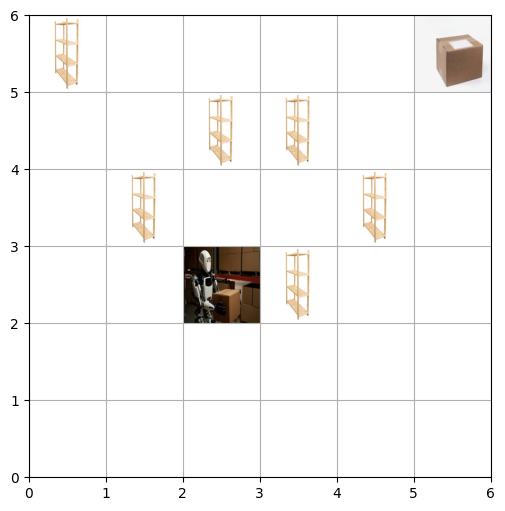

Step 7: Action=0, Position=(2, 1), Carrying=True, Reward=-1


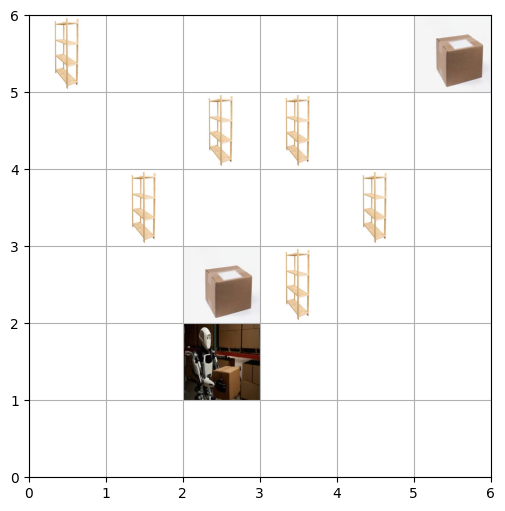

Step 8: Action=3, Position=(3, 1), Carrying=True, Reward=-1


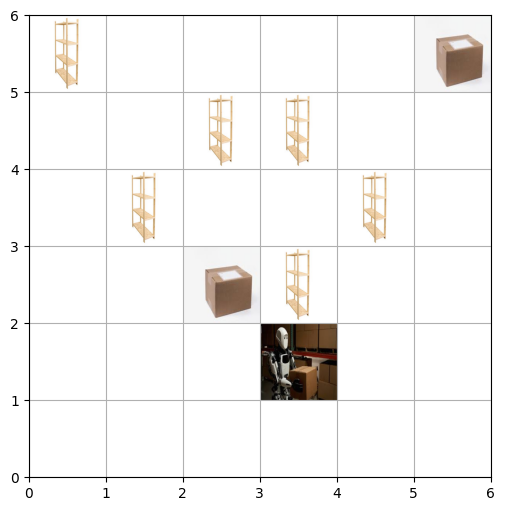

Step 9: Action=3, Position=(4, 1), Carrying=True, Reward=-1


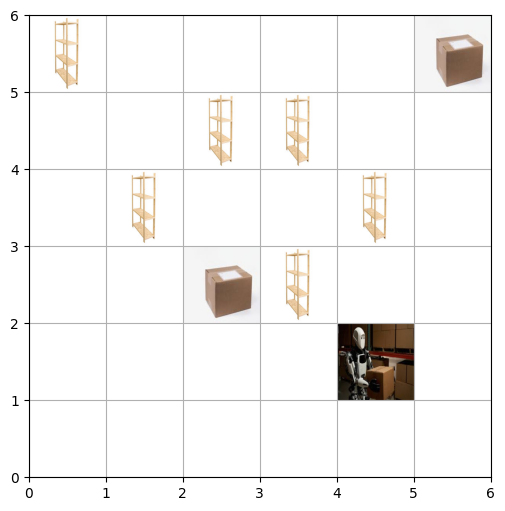

Step 10: Action=3, Position=(5, 1), Carrying=True, Reward=-1


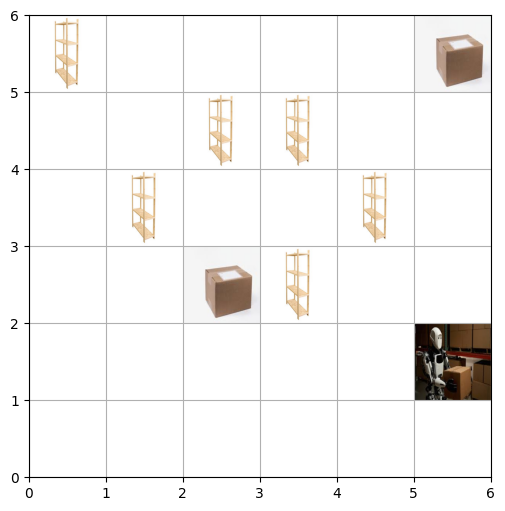

Step 11: Action=1, Position=(5, 2), Carrying=True, Reward=-1


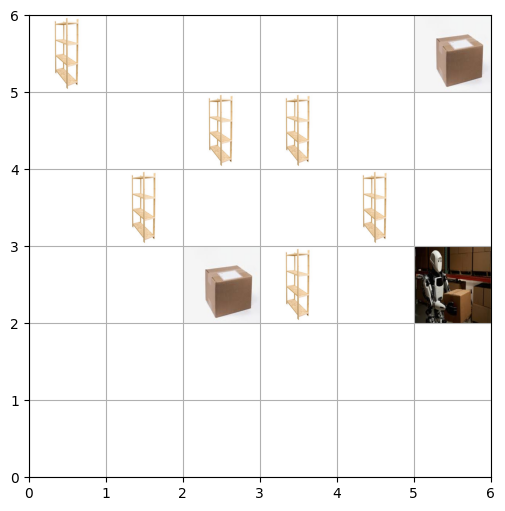

Step 12: Action=1, Position=(5, 3), Carrying=True, Reward=-1


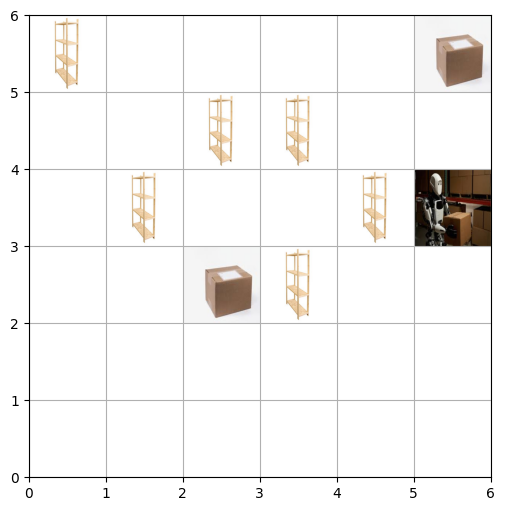

Step 13: Action=1, Position=(5, 4), Carrying=True, Reward=-1


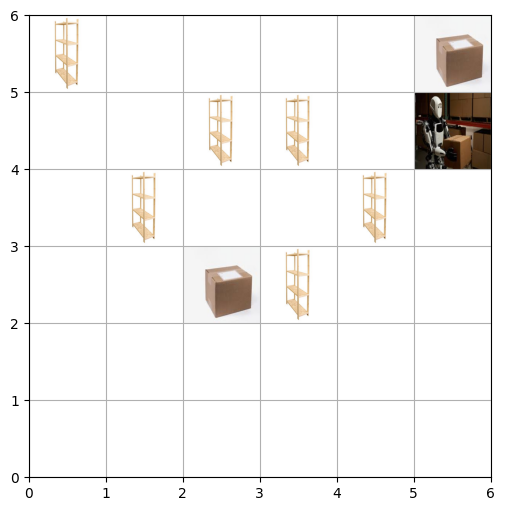

Step 14: Action=1, Position=(5, 5), Carrying=True, Reward=-1


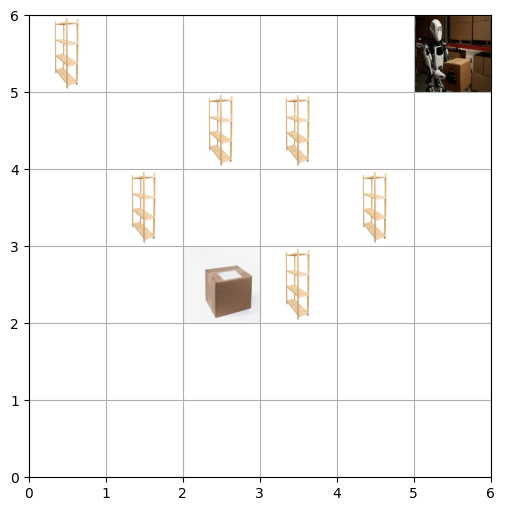

Step 15: Action=5, Position=(5, 5), Carrying=True, Reward=100


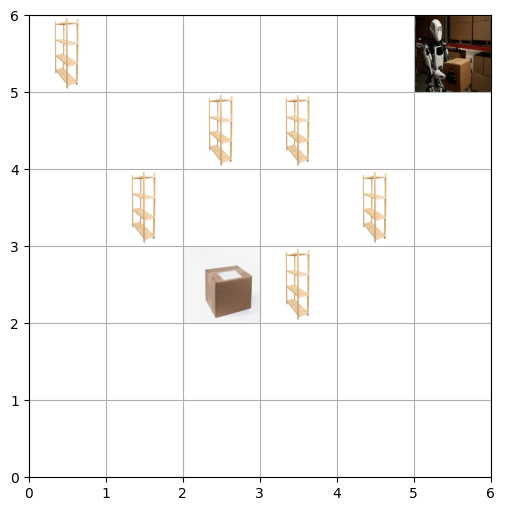

Episode 3: Task completed! Total Reward: 111
Step 0: Action=3, Position=(1, 0), Carrying=False, Reward=-1


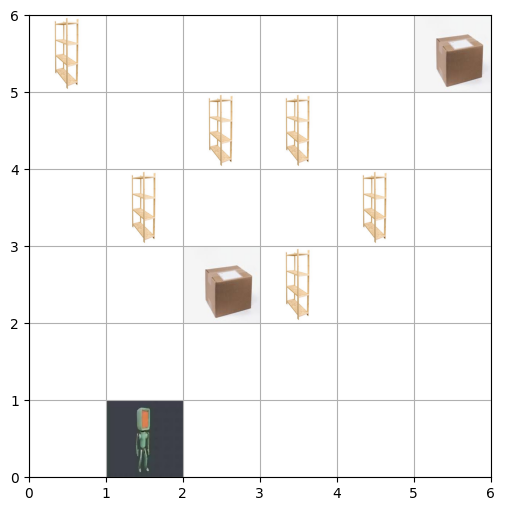

Step 1: Action=3, Position=(2, 0), Carrying=False, Reward=-1


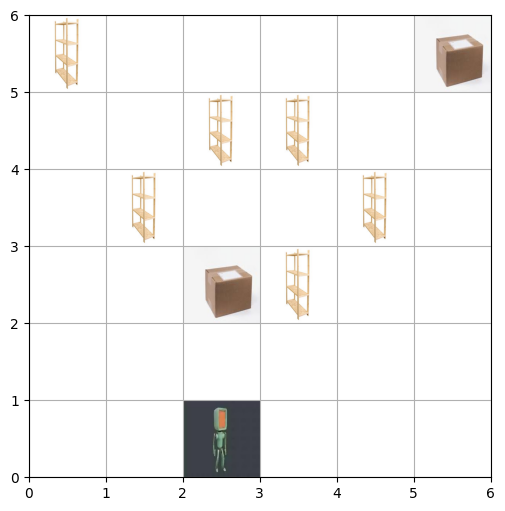

Step 2: Action=1, Position=(2, 1), Carrying=False, Reward=-1


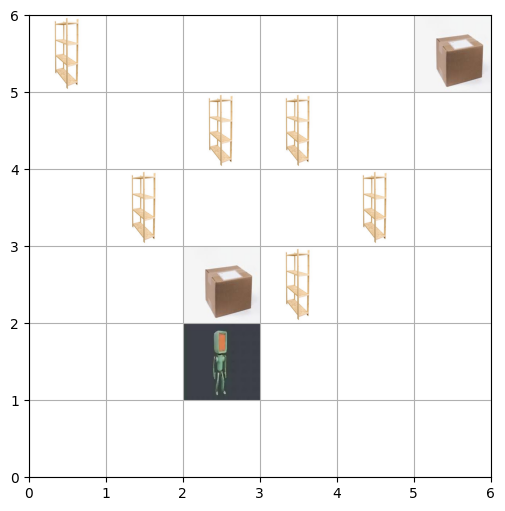

Step 3: Action=1, Position=(2, 2), Carrying=False, Reward=-1


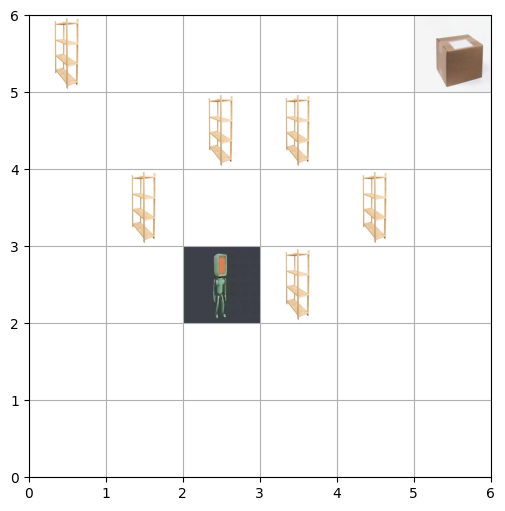

Step 4: Action=4, Position=(2, 2), Carrying=True, Reward=25


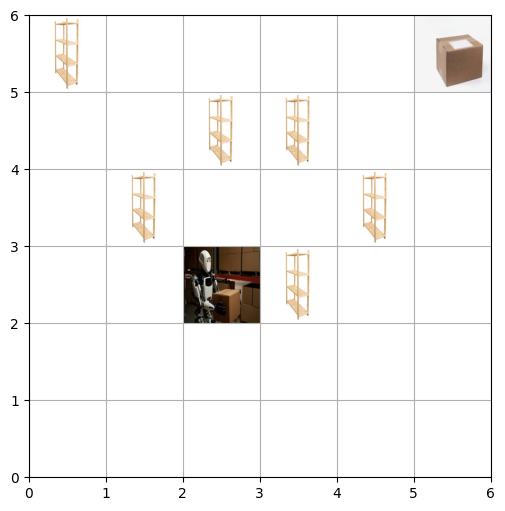

Step 5: Action=0, Position=(2, 1), Carrying=True, Reward=-1


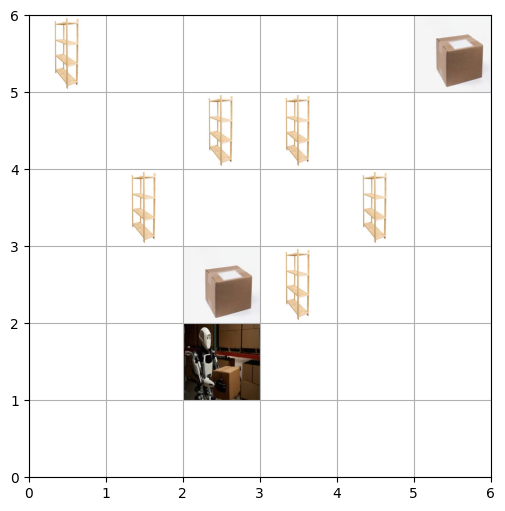

Step 6: Action=3, Position=(3, 1), Carrying=True, Reward=-1


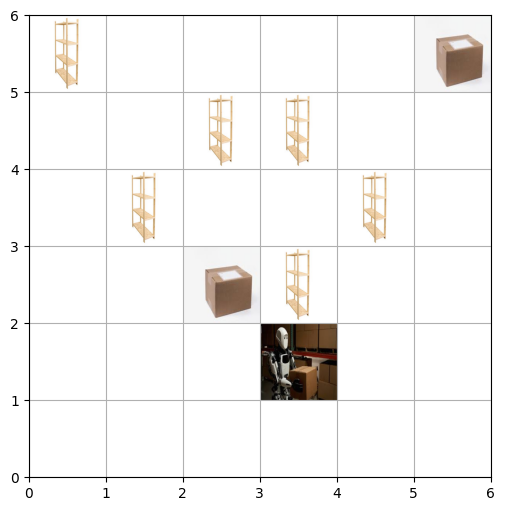

Step 7: Action=3, Position=(4, 1), Carrying=True, Reward=-1


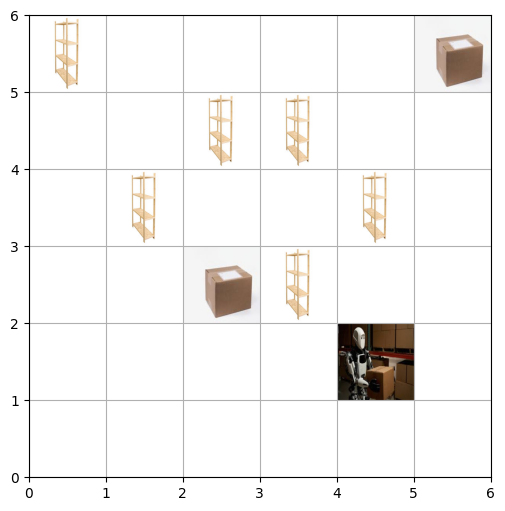

Step 8: Action=3, Position=(5, 1), Carrying=True, Reward=-1


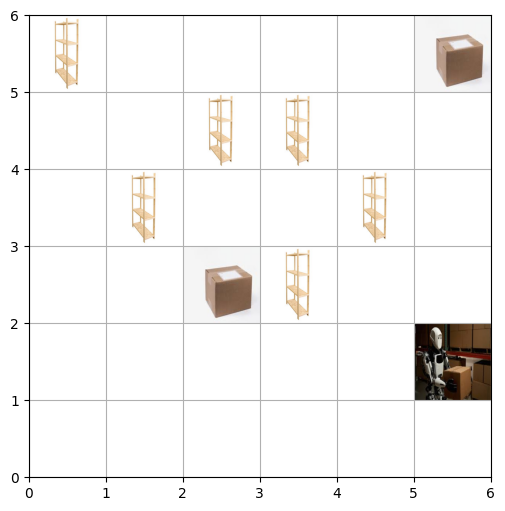

Step 9: Action=1, Position=(5, 2), Carrying=True, Reward=-1


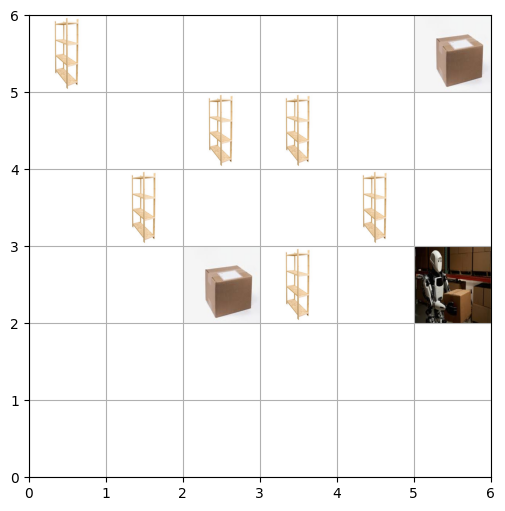

Step 10: Action=1, Position=(5, 3), Carrying=True, Reward=-1


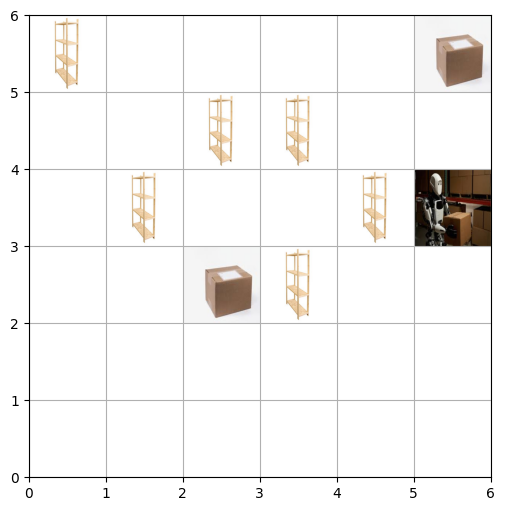

Step 11: Action=1, Position=(5, 3), Carrying=True, Reward=-1


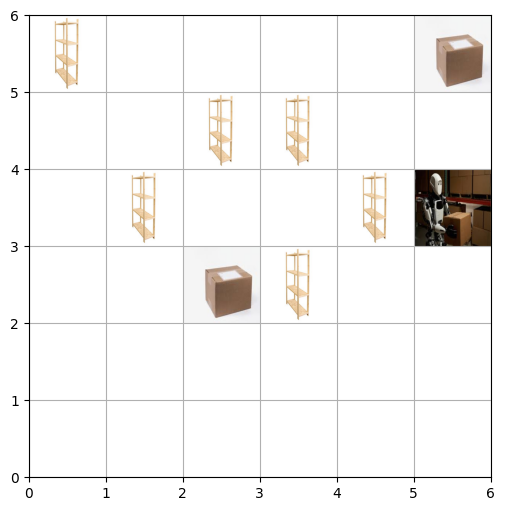

Step 12: Action=1, Position=(5, 4), Carrying=True, Reward=-1


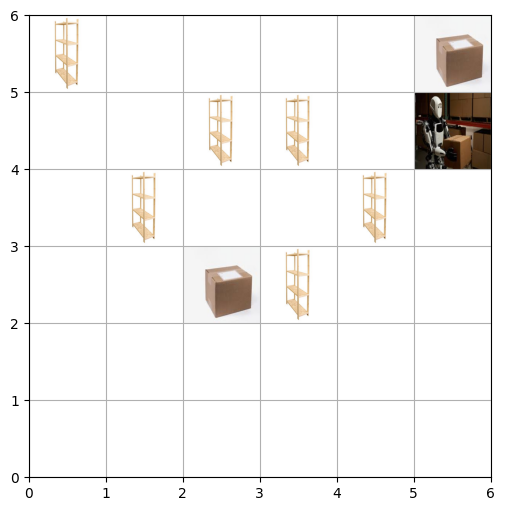

Step 13: Action=1, Position=(5, 5), Carrying=True, Reward=-1


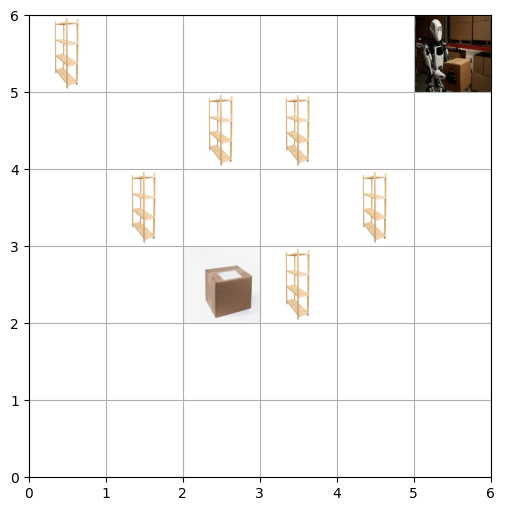

Step 14: Action=5, Position=(5, 5), Carrying=True, Reward=100


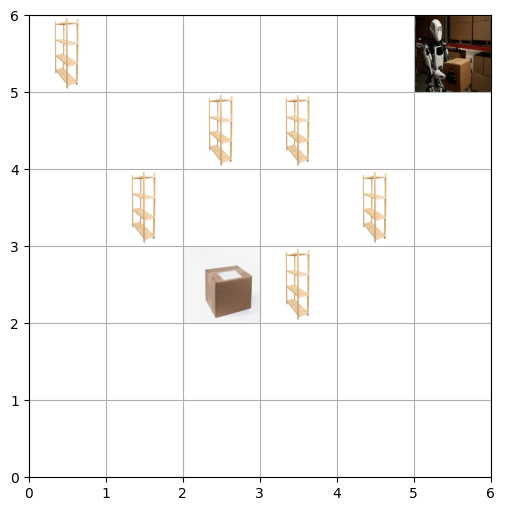

Episode 4: Task completed! Total Reward: 112
Step 0: Action=3, Position=(1, 0), Carrying=False, Reward=-1


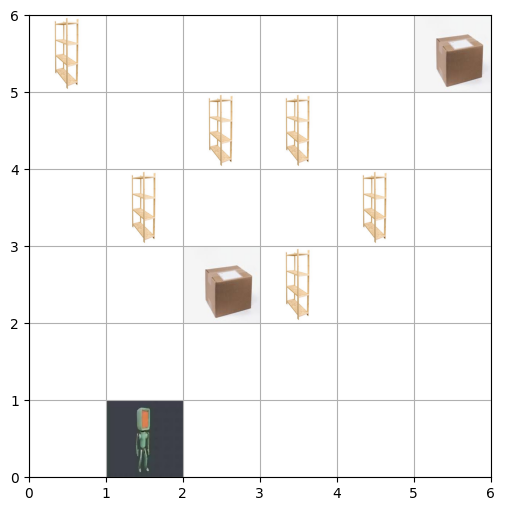

Step 1: Action=3, Position=(2, 0), Carrying=False, Reward=-1


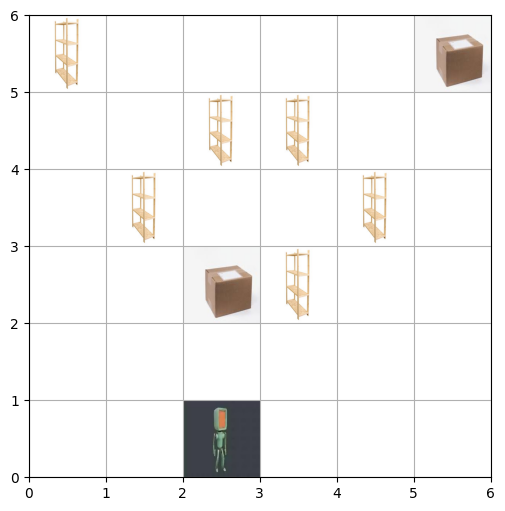

Step 2: Action=1, Position=(2, 1), Carrying=False, Reward=-1


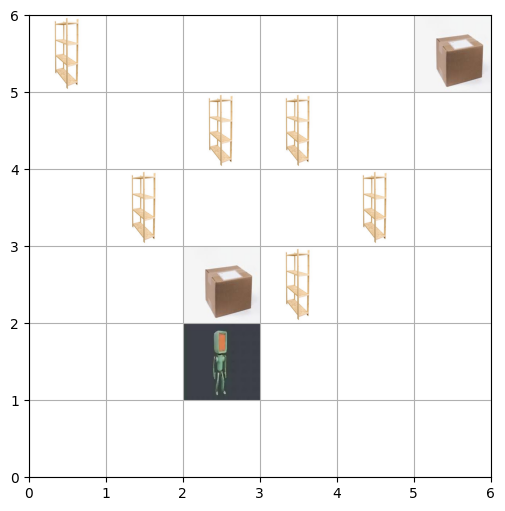

Step 3: Action=1, Position=(2, 1), Carrying=False, Reward=-1


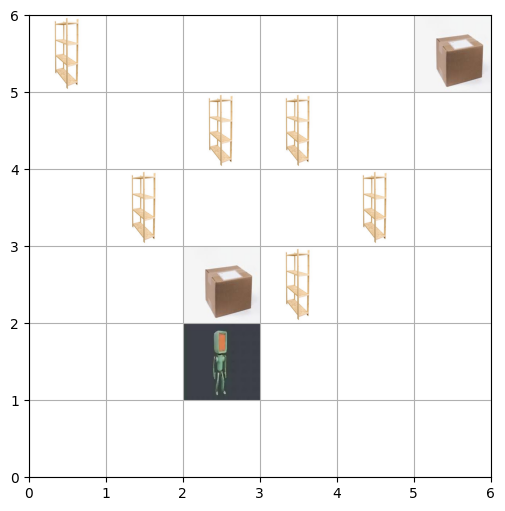

Step 4: Action=1, Position=(2, 2), Carrying=False, Reward=-1


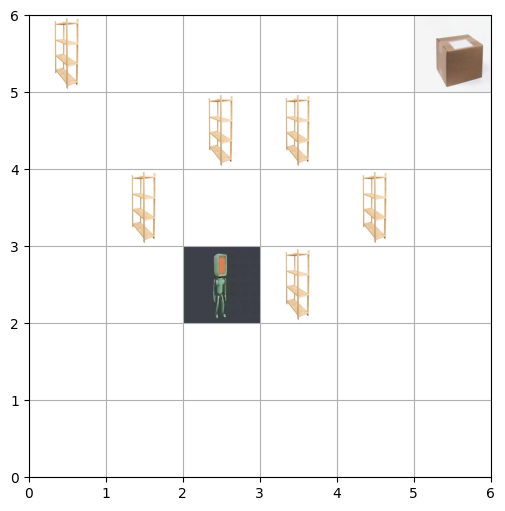

Step 5: Action=4, Position=(2, 2), Carrying=True, Reward=25


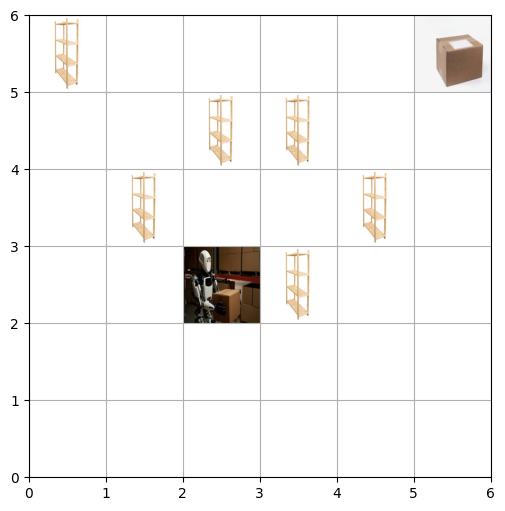

Step 6: Action=0, Position=(2, 1), Carrying=True, Reward=-1


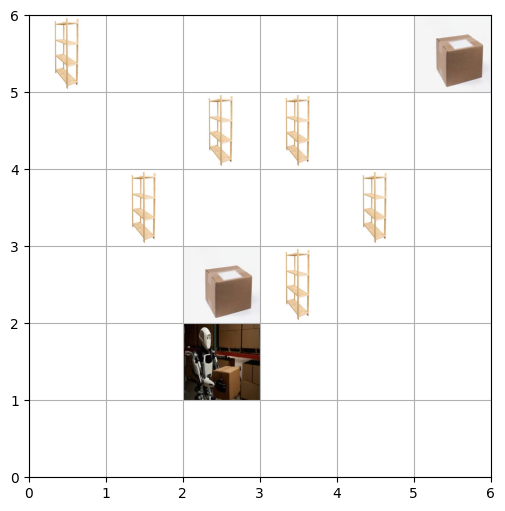

Step 7: Action=3, Position=(3, 1), Carrying=True, Reward=-1


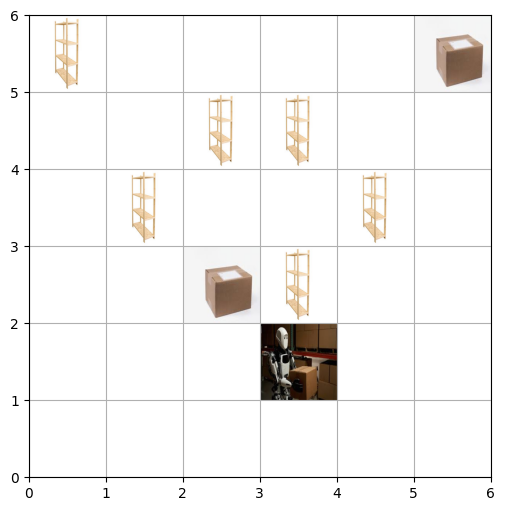

Step 8: Action=3, Position=(4, 1), Carrying=True, Reward=-1


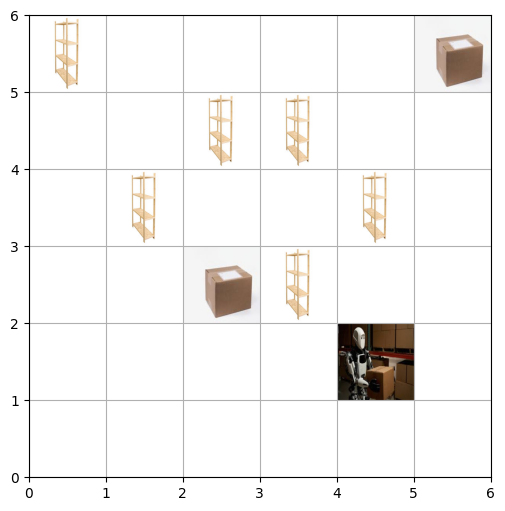

Step 9: Action=3, Position=(4, 1), Carrying=True, Reward=-1


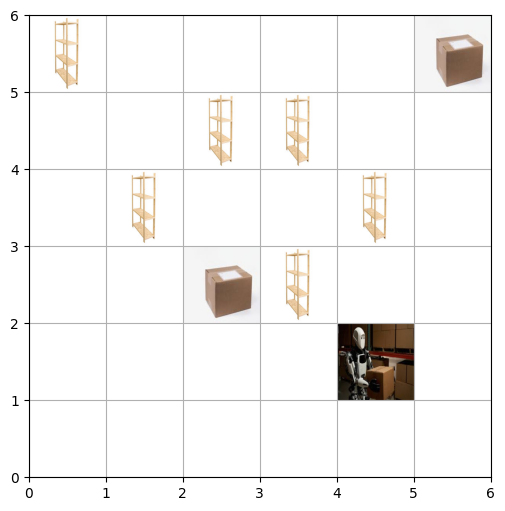

Step 10: Action=3, Position=(4, 1), Carrying=True, Reward=-1


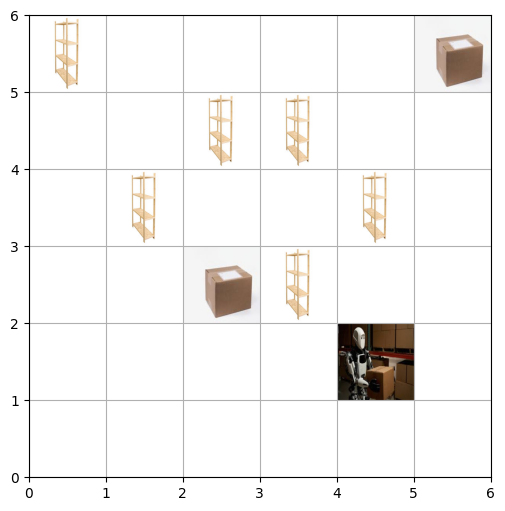

Step 11: Action=3, Position=(5, 1), Carrying=True, Reward=-1


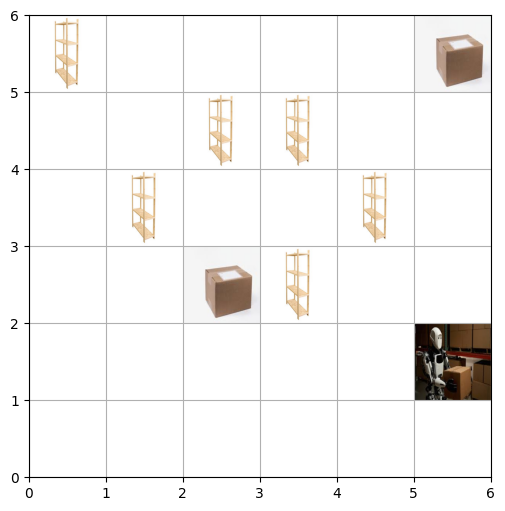

Step 12: Action=1, Position=(5, 2), Carrying=True, Reward=-1


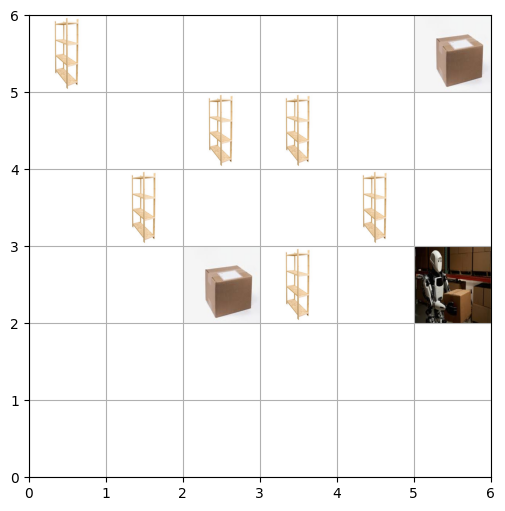

Step 13: Action=1, Position=(5, 2), Carrying=True, Reward=-1


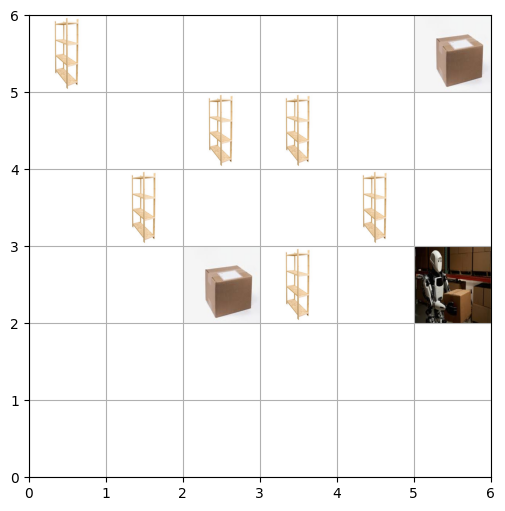

Step 14: Action=1, Position=(5, 3), Carrying=True, Reward=-1


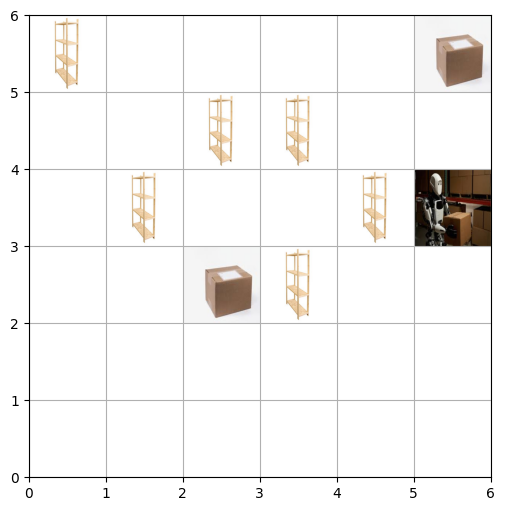

Step 15: Action=1, Position=(5, 4), Carrying=True, Reward=-1


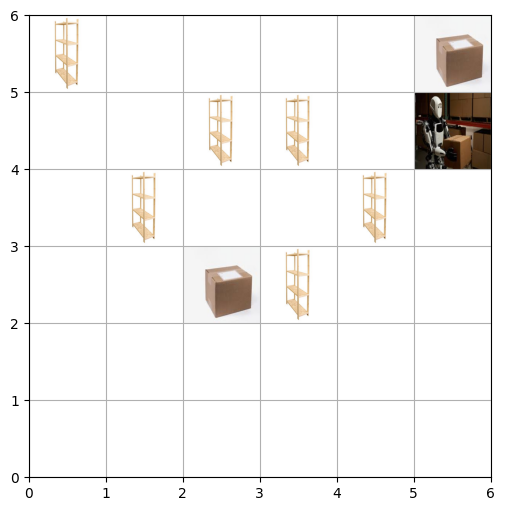

Step 16: Action=1, Position=(5, 5), Carrying=True, Reward=-1


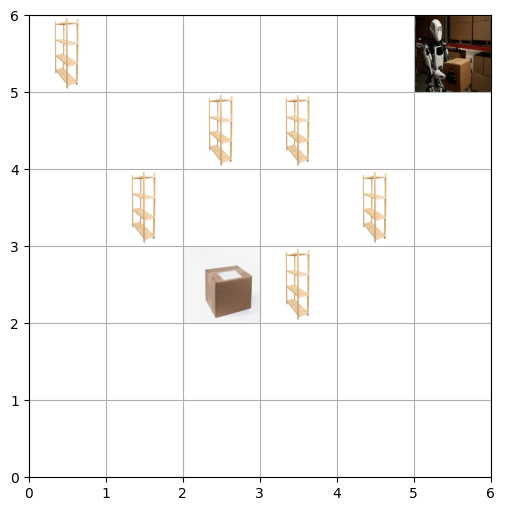

Step 17: Action=5, Position=(5, 5), Carrying=True, Reward=100


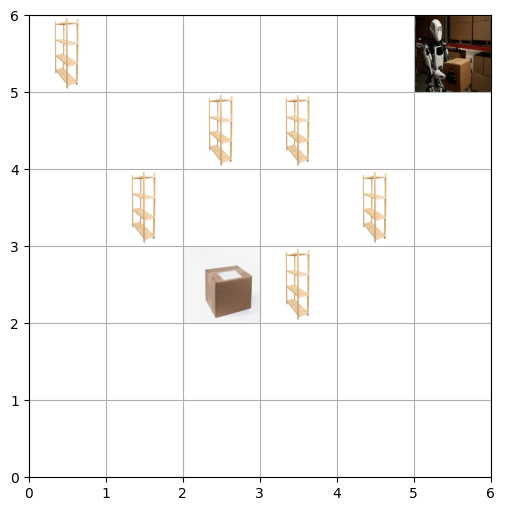

Episode 5: Task completed! Total Reward: 109
Step 0: Action=3, Position=(1, 0), Carrying=False, Reward=-1


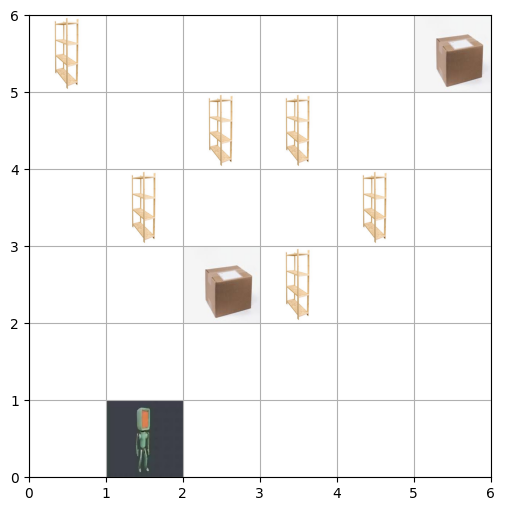

Step 1: Action=3, Position=(2, 0), Carrying=False, Reward=-1


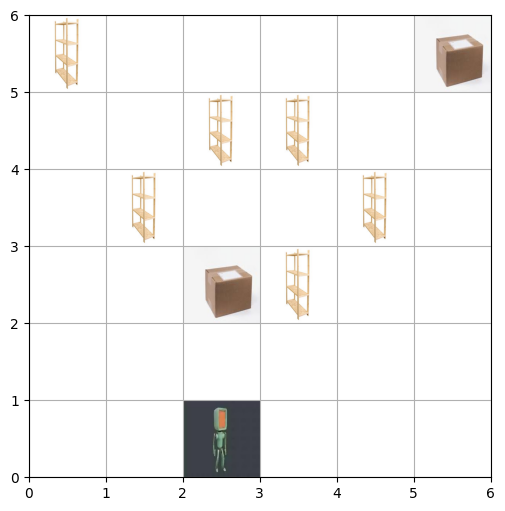

Step 2: Action=1, Position=(2, 1), Carrying=False, Reward=-1


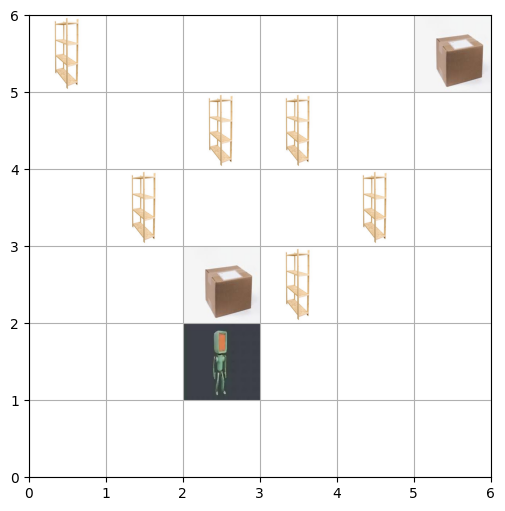

Step 3: Action=1, Position=(2, 2), Carrying=False, Reward=-1


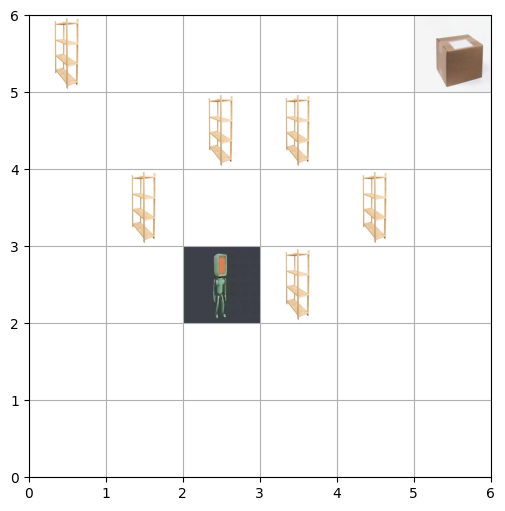

Step 4: Action=4, Position=(2, 2), Carrying=True, Reward=25


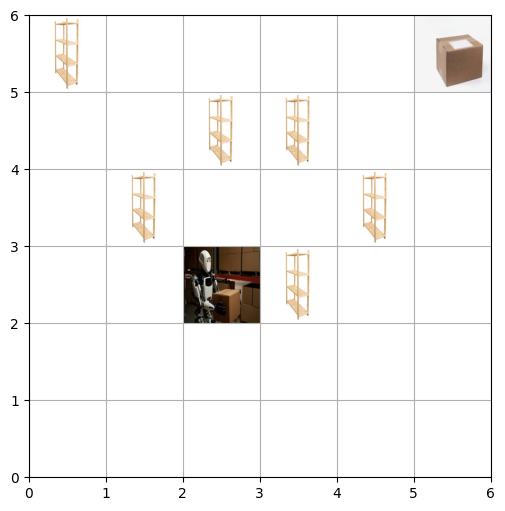

Step 5: Action=0, Position=(2, 1), Carrying=True, Reward=-1


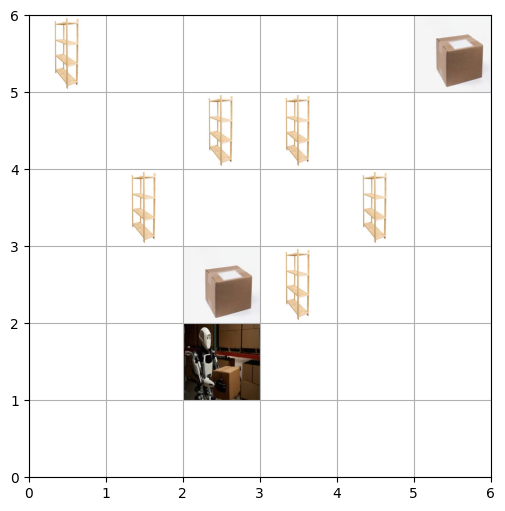

Step 6: Action=3, Position=(3, 1), Carrying=True, Reward=-1


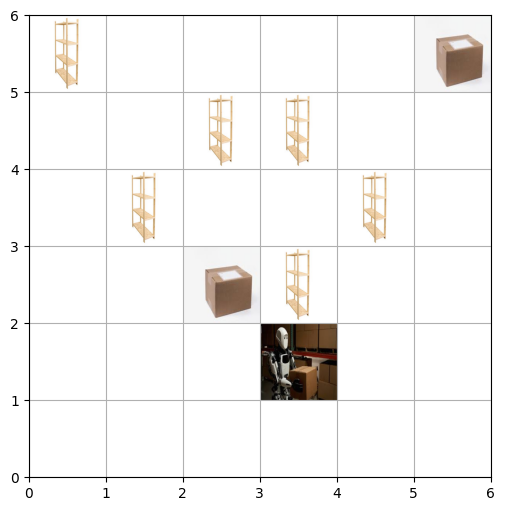

Step 7: Action=3, Position=(4, 1), Carrying=True, Reward=-1


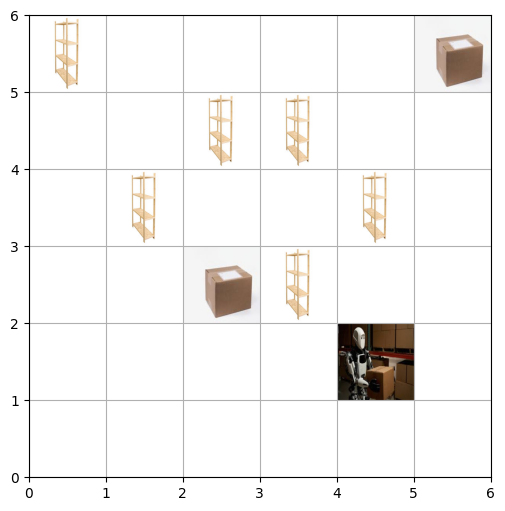

Step 8: Action=3, Position=(5, 1), Carrying=True, Reward=-1


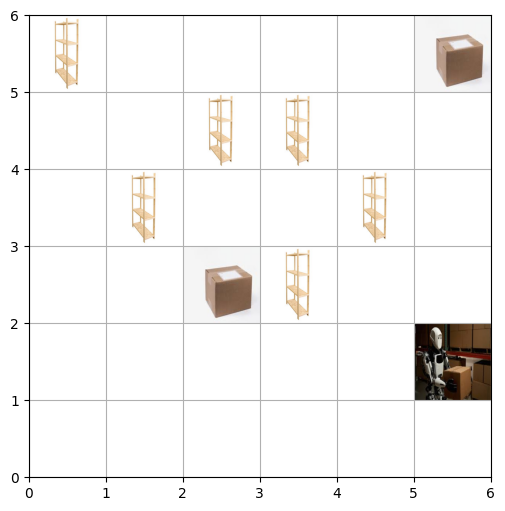

Step 9: Action=1, Position=(5, 2), Carrying=True, Reward=-1


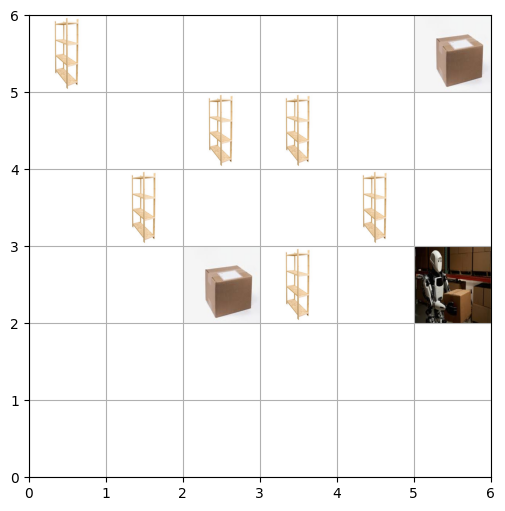

Step 10: Action=1, Position=(5, 3), Carrying=True, Reward=-1


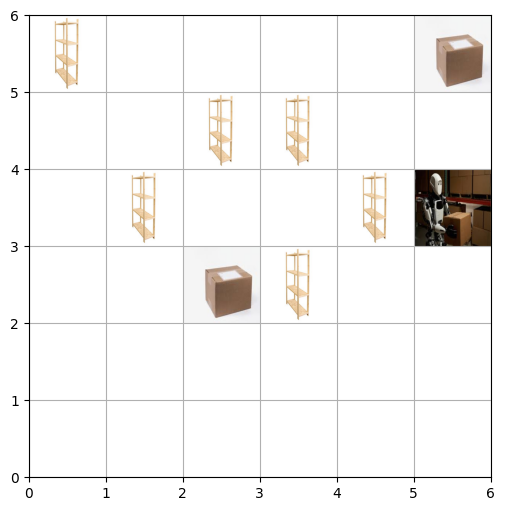

Step 11: Action=1, Position=(5, 3), Carrying=True, Reward=-1


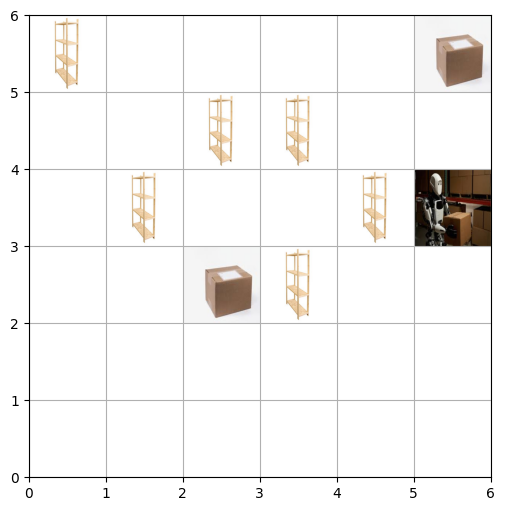

Step 12: Action=1, Position=(5, 4), Carrying=True, Reward=-1


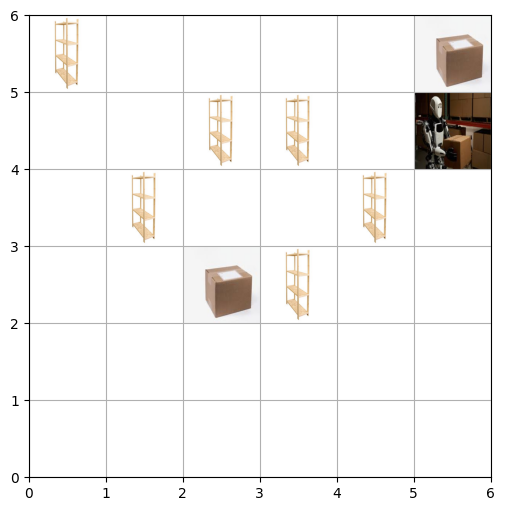

Step 13: Action=1, Position=(5, 4), Carrying=True, Reward=-1


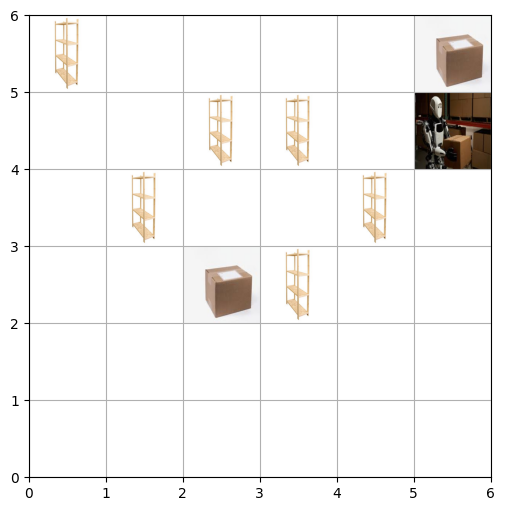

Step 14: Action=1, Position=(5, 5), Carrying=True, Reward=-1


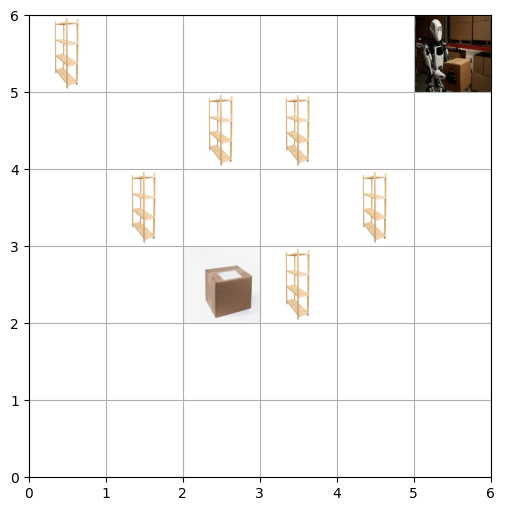

Step 15: Action=5, Position=(5, 5), Carrying=True, Reward=100


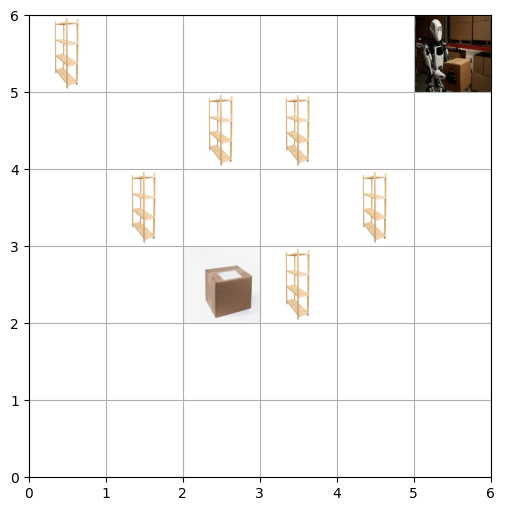

Episode 6: Task completed! Total Reward: 111
Step 0: Action=3, Position=(1, 0), Carrying=False, Reward=-1


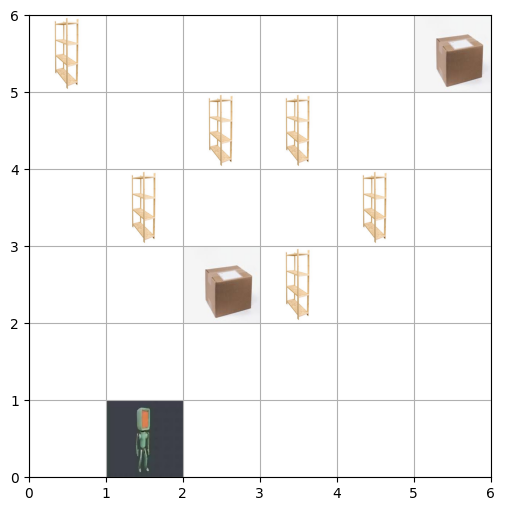

Step 1: Action=3, Position=(2, 0), Carrying=False, Reward=-1


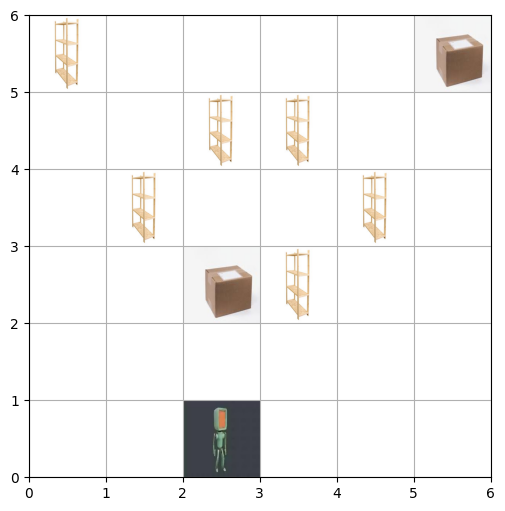

Step 2: Action=1, Position=(2, 0), Carrying=False, Reward=-1


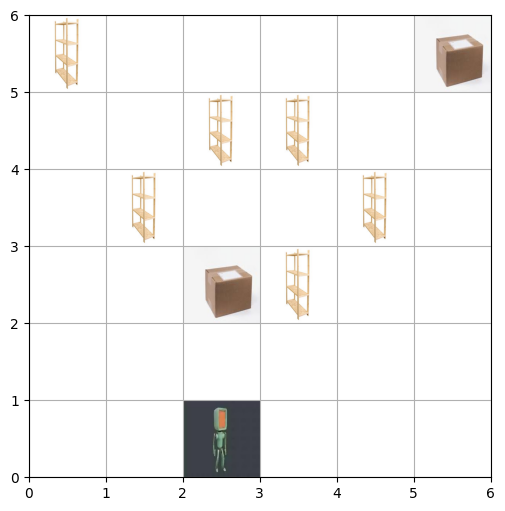

Step 3: Action=1, Position=(2, 1), Carrying=False, Reward=-1


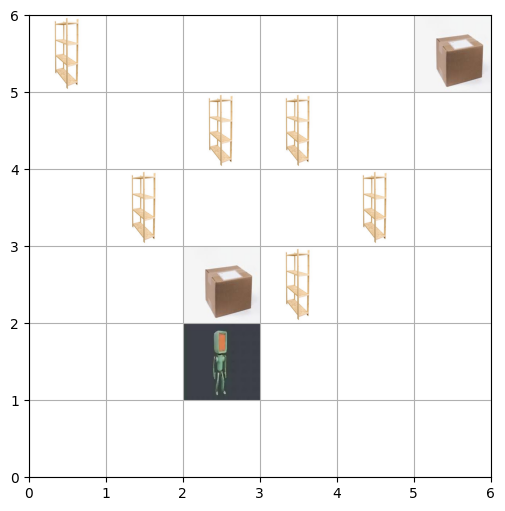

Step 4: Action=1, Position=(2, 2), Carrying=False, Reward=-1


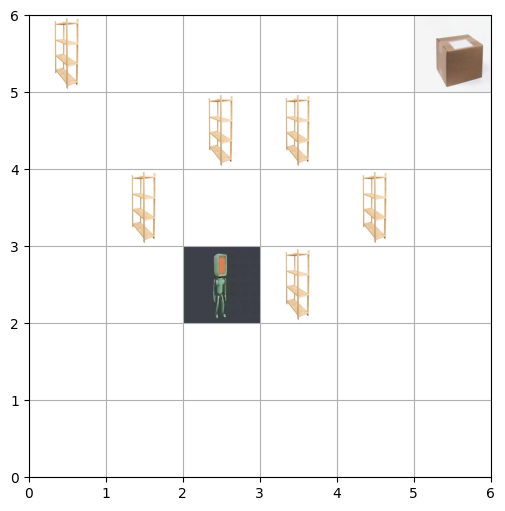

Step 5: Action=4, Position=(2, 2), Carrying=True, Reward=25


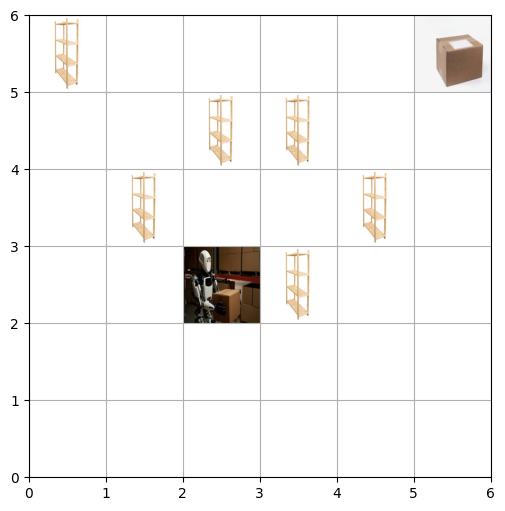

Step 6: Action=0, Position=(2, 1), Carrying=True, Reward=-1


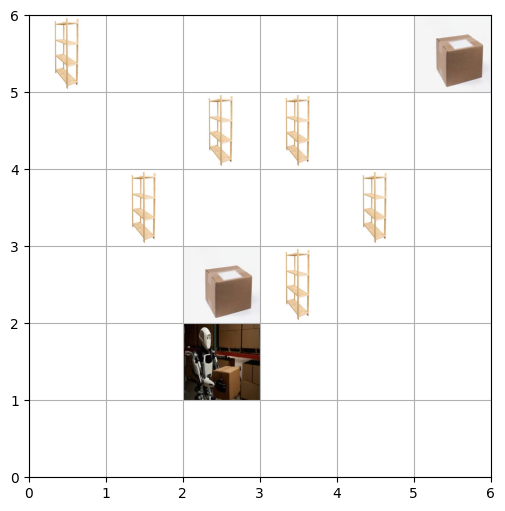

Step 7: Action=3, Position=(2, 1), Carrying=True, Reward=-1


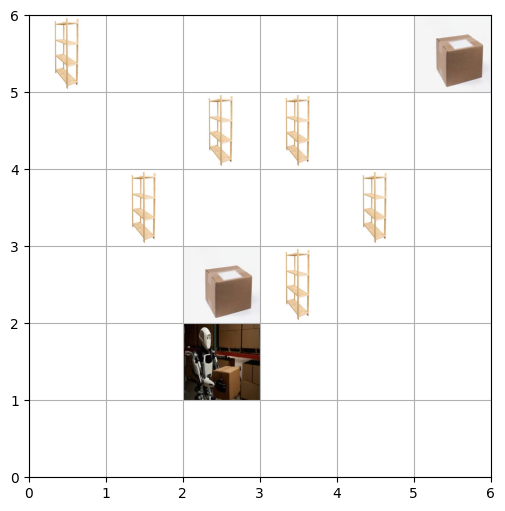

Step 8: Action=3, Position=(3, 1), Carrying=True, Reward=-1


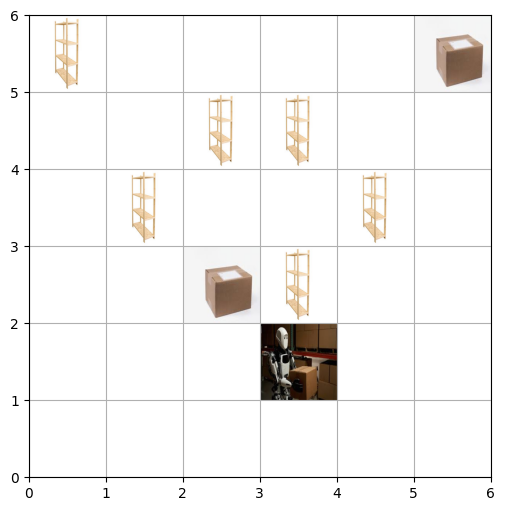

Step 9: Action=3, Position=(4, 1), Carrying=True, Reward=-1


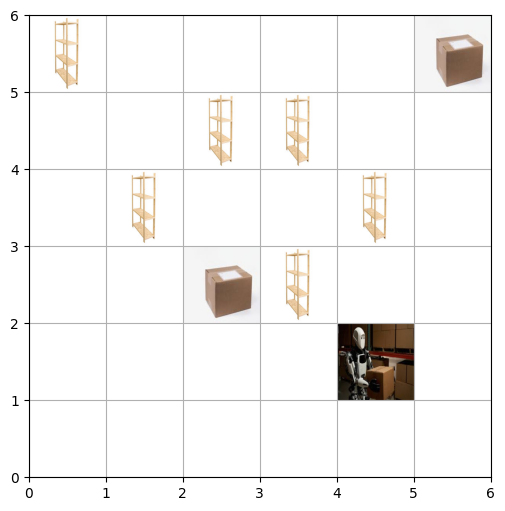

Step 10: Action=3, Position=(5, 1), Carrying=True, Reward=-1


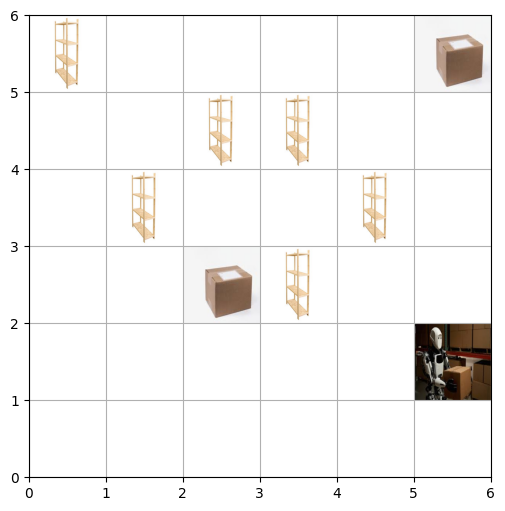

Step 11: Action=1, Position=(5, 2), Carrying=True, Reward=-1


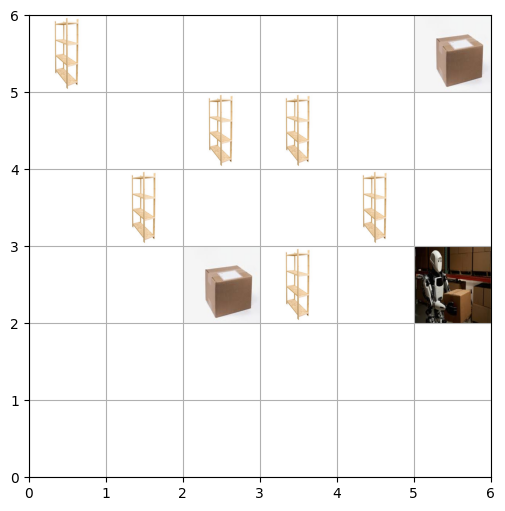

Step 12: Action=1, Position=(5, 3), Carrying=True, Reward=-1


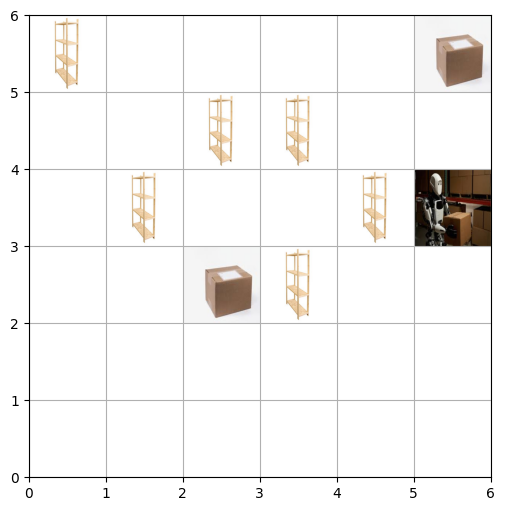

Step 13: Action=1, Position=(5, 4), Carrying=True, Reward=-1


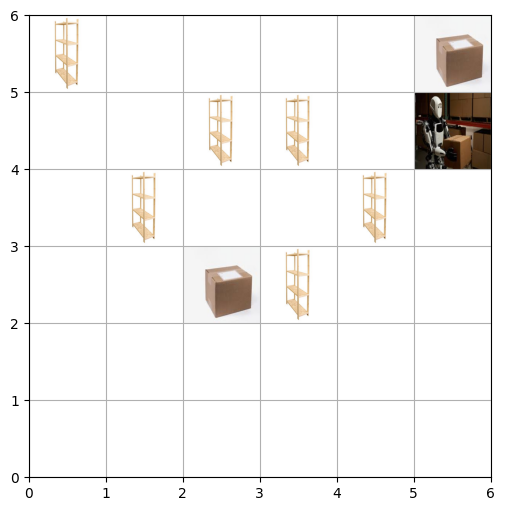

Step 14: Action=1, Position=(5, 5), Carrying=True, Reward=-1


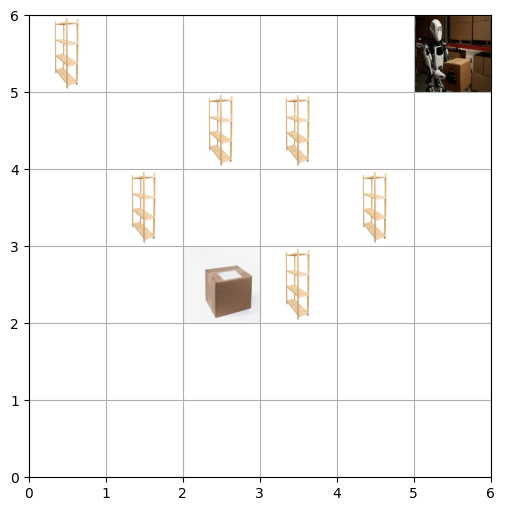

Step 15: Action=5, Position=(5, 5), Carrying=True, Reward=100


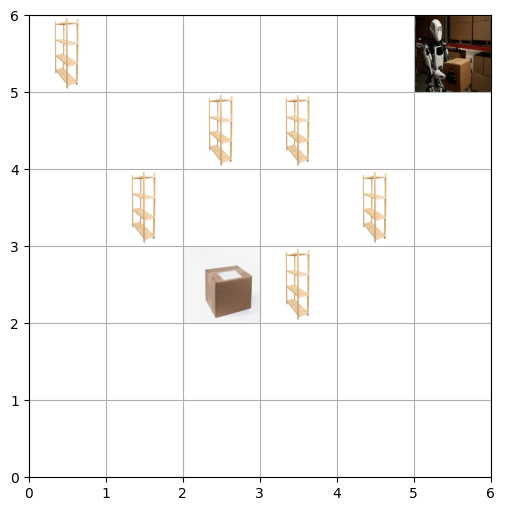

Episode 7: Task completed! Total Reward: 111
Step 0: Action=3, Position=(0, 0), Carrying=False, Reward=-1


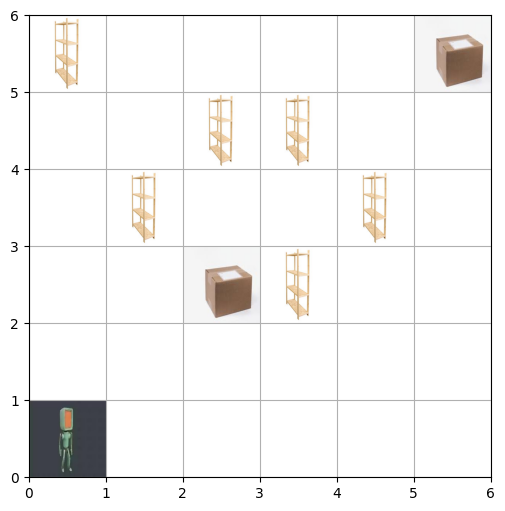

Step 1: Action=3, Position=(1, 0), Carrying=False, Reward=-1


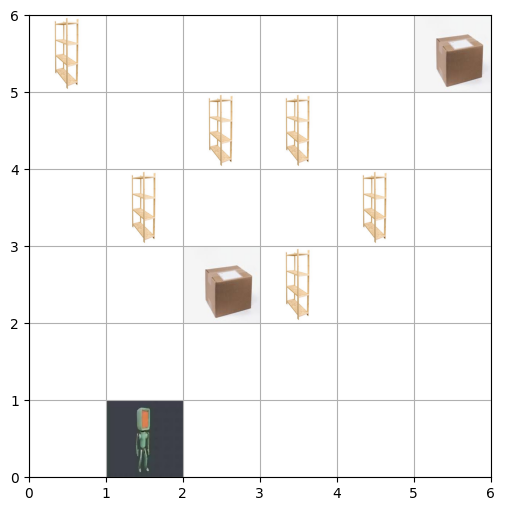

Step 2: Action=3, Position=(2, 0), Carrying=False, Reward=-1


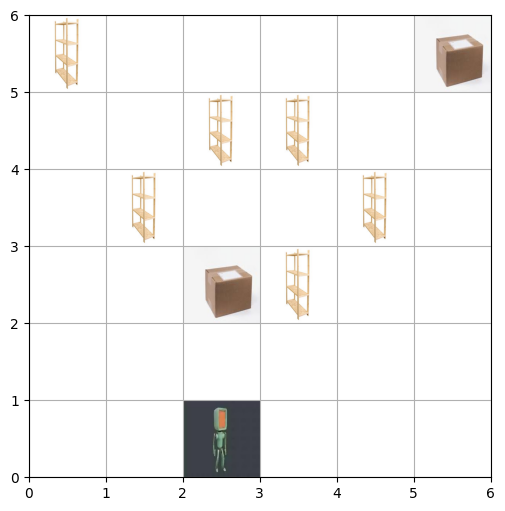

Step 3: Action=1, Position=(2, 1), Carrying=False, Reward=-1


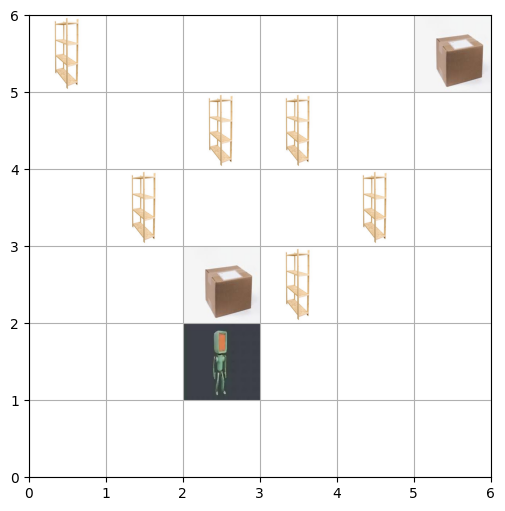

Step 4: Action=1, Position=(2, 2), Carrying=False, Reward=-1


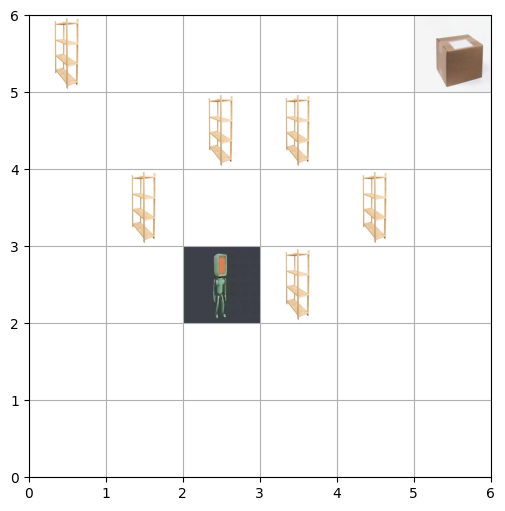

Step 5: Action=4, Position=(2, 2), Carrying=True, Reward=25


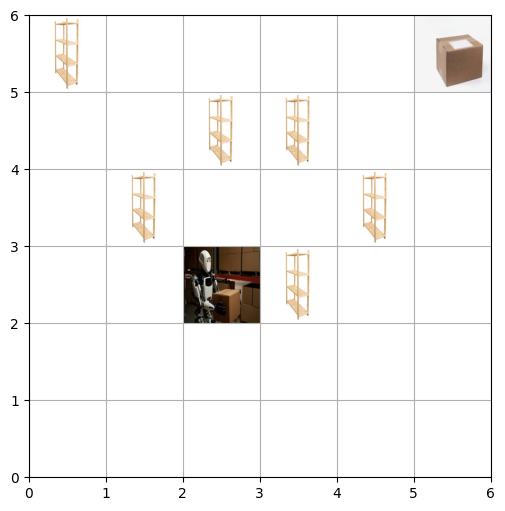

Step 6: Action=0, Position=(2, 1), Carrying=True, Reward=-1


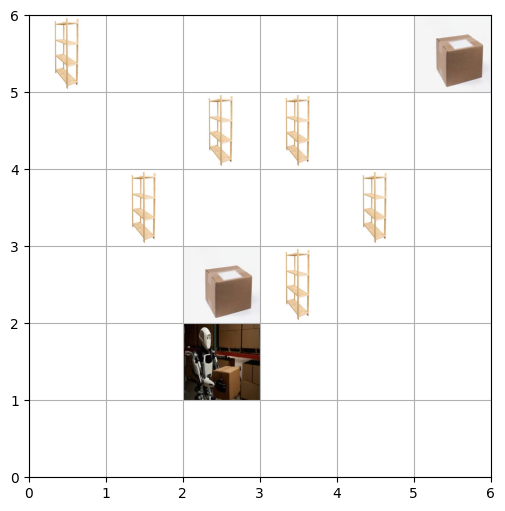

Step 7: Action=3, Position=(3, 1), Carrying=True, Reward=-1


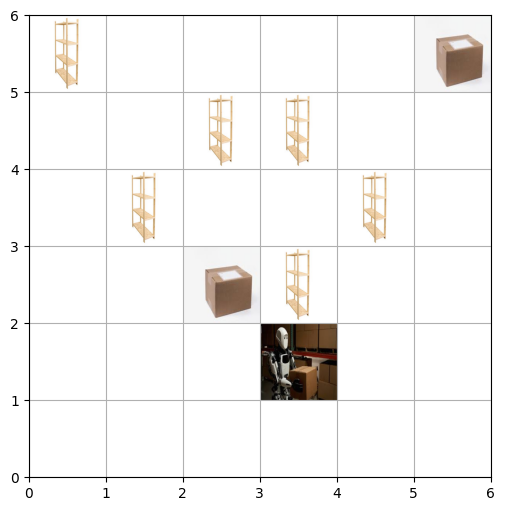

Step 8: Action=3, Position=(4, 1), Carrying=True, Reward=-1


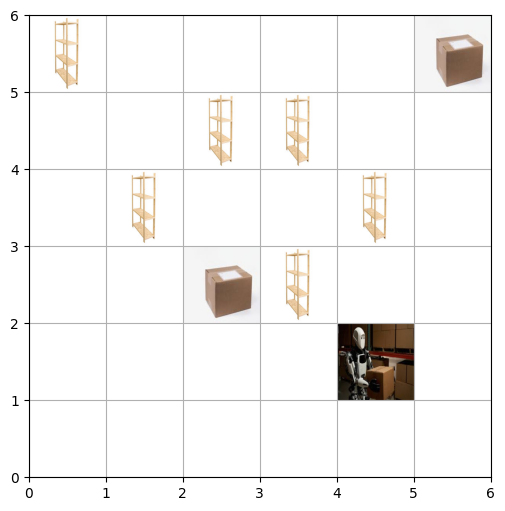

Step 9: Action=3, Position=(5, 1), Carrying=True, Reward=-1


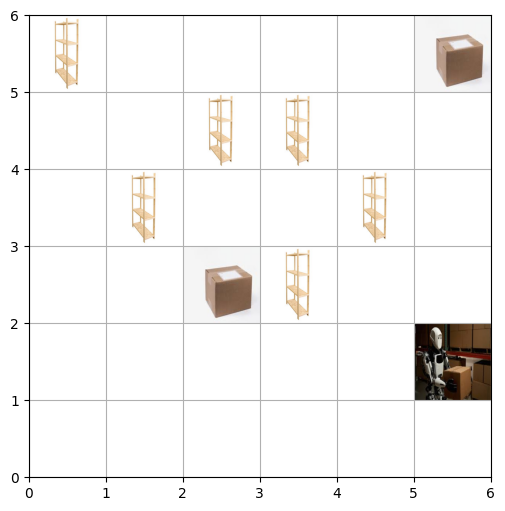

Step 10: Action=1, Position=(5, 2), Carrying=True, Reward=-1


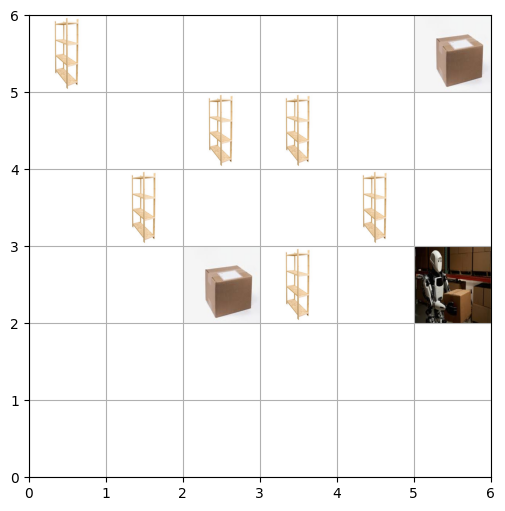

Step 11: Action=1, Position=(5, 3), Carrying=True, Reward=-1


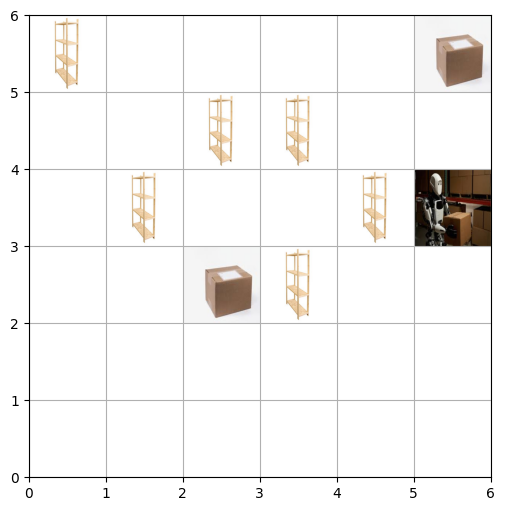

Step 12: Action=1, Position=(5, 4), Carrying=True, Reward=-1


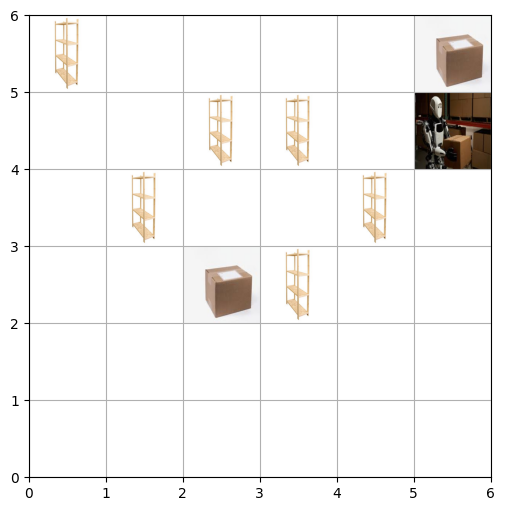

Step 13: Action=1, Position=(5, 5), Carrying=True, Reward=-1


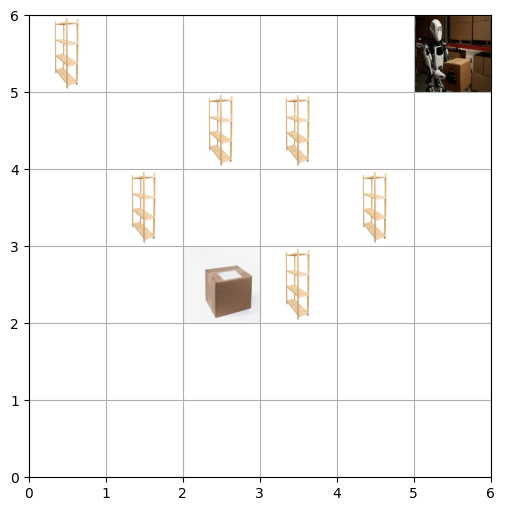

Step 14: Action=5, Position=(5, 5), Carrying=True, Reward=100


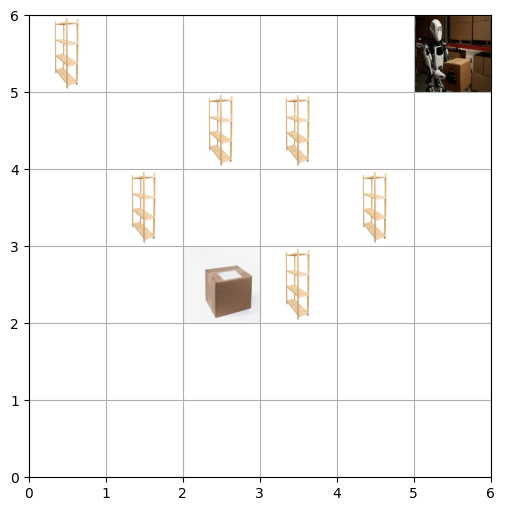

Episode 8: Task completed! Total Reward: 112
Step 0: Action=3, Position=(1, 0), Carrying=False, Reward=-1


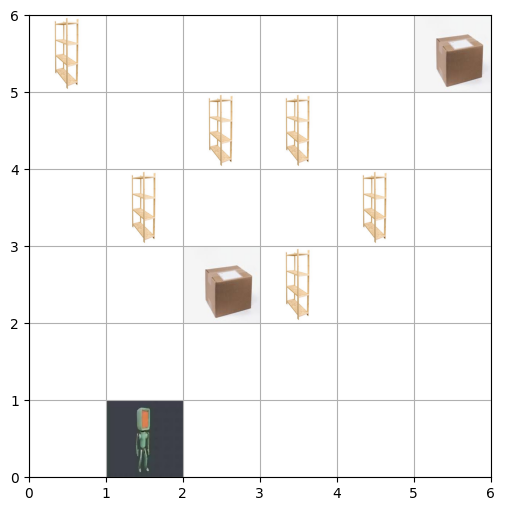

Step 1: Action=3, Position=(2, 0), Carrying=False, Reward=-1


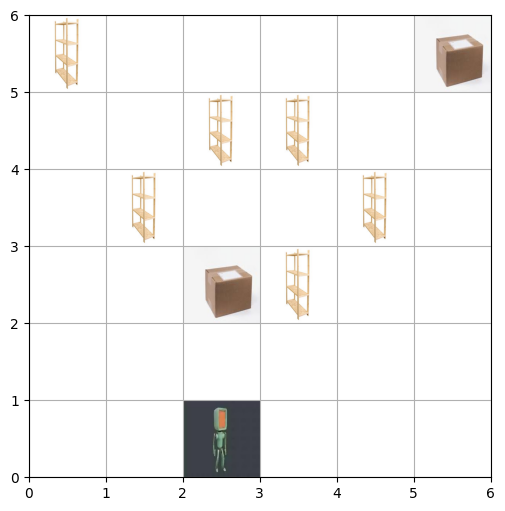

Step 2: Action=1, Position=(2, 1), Carrying=False, Reward=-1


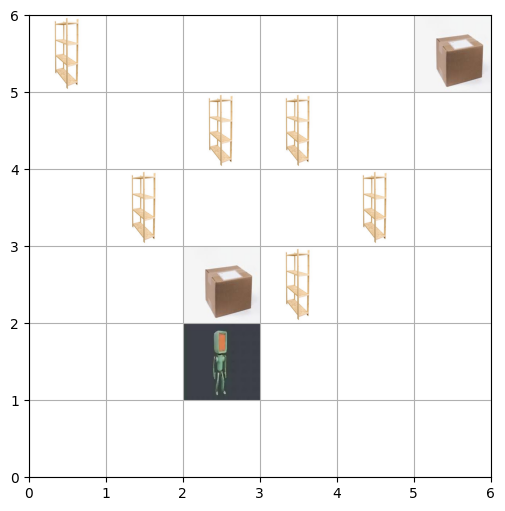

Step 3: Action=1, Position=(2, 2), Carrying=False, Reward=-1


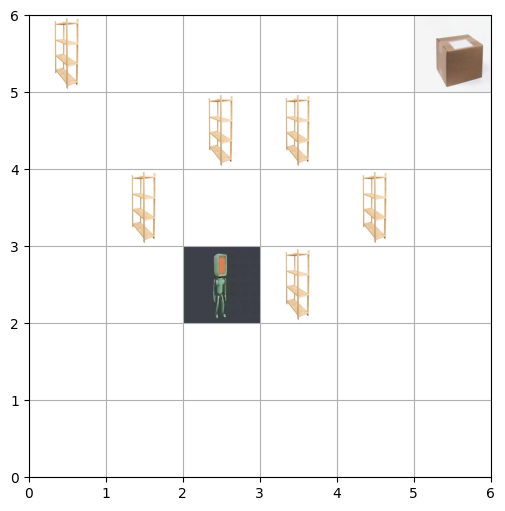

Step 4: Action=4, Position=(2, 2), Carrying=True, Reward=25


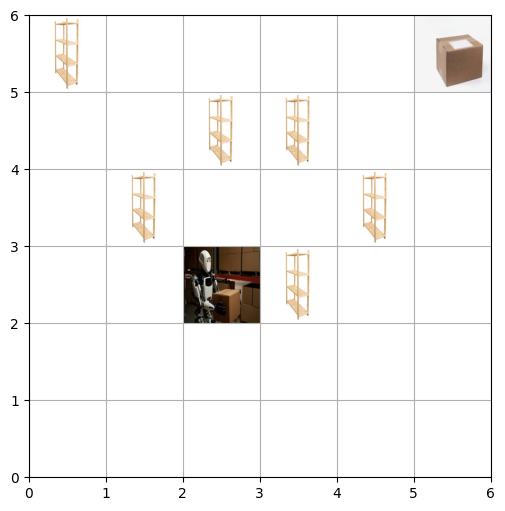

Step 5: Action=0, Position=(2, 1), Carrying=True, Reward=-1


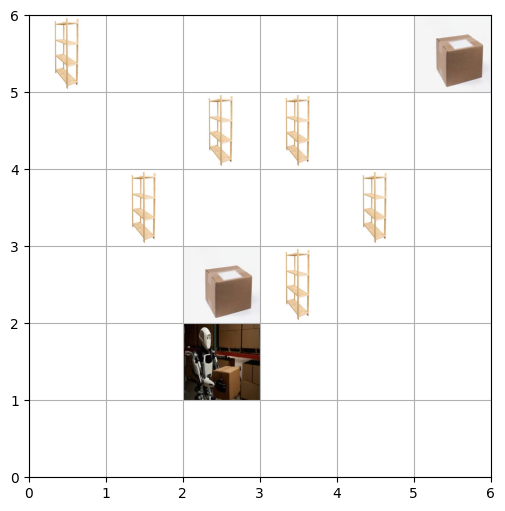

Step 6: Action=3, Position=(3, 1), Carrying=True, Reward=-1


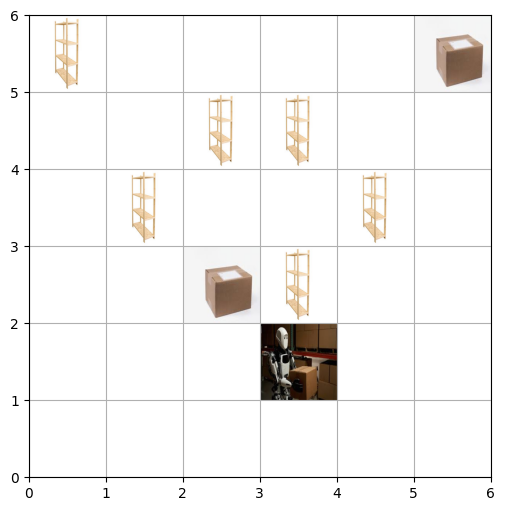

Step 7: Action=3, Position=(4, 1), Carrying=True, Reward=-1


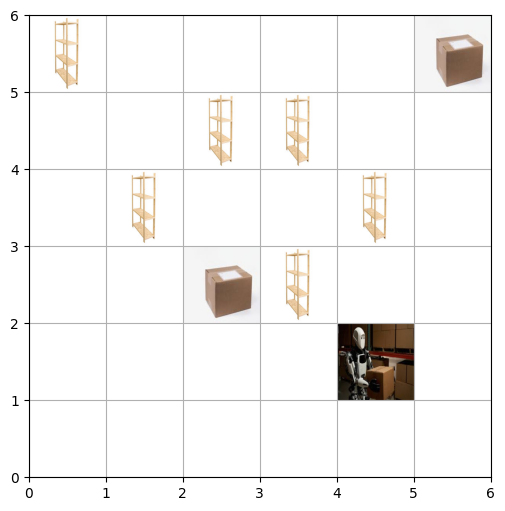

Step 8: Action=3, Position=(5, 1), Carrying=True, Reward=-1


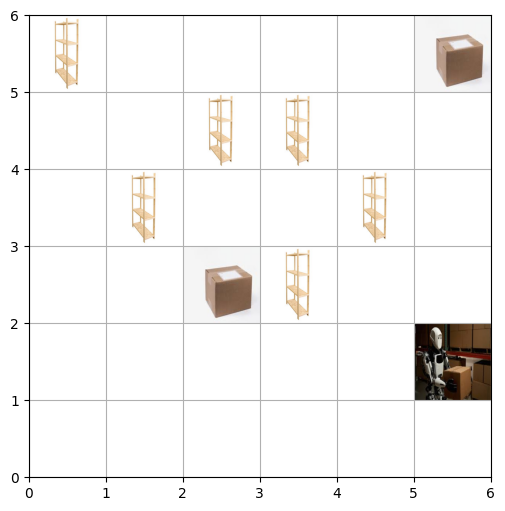

Step 9: Action=1, Position=(5, 2), Carrying=True, Reward=-1


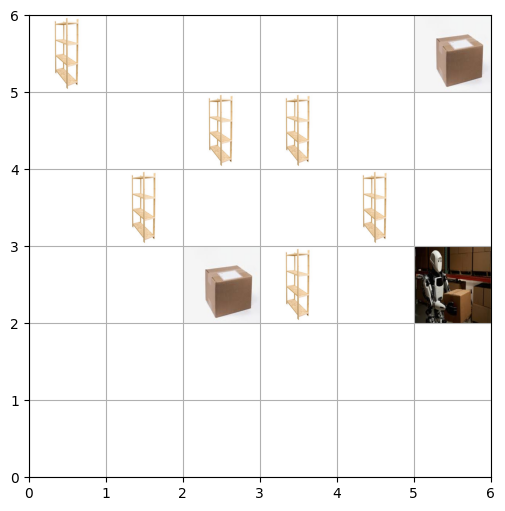

Step 10: Action=1, Position=(5, 3), Carrying=True, Reward=-1


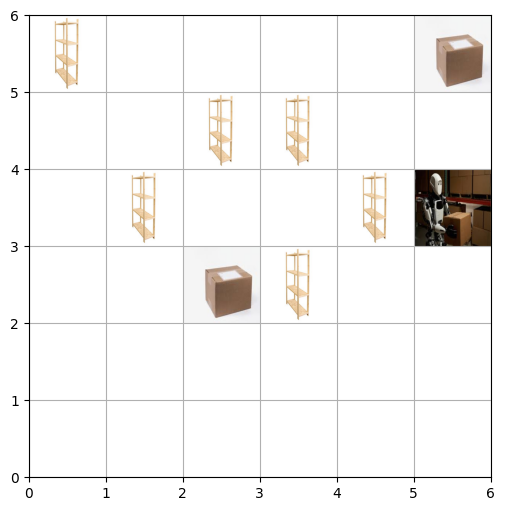

Step 11: Action=1, Position=(5, 4), Carrying=True, Reward=-1


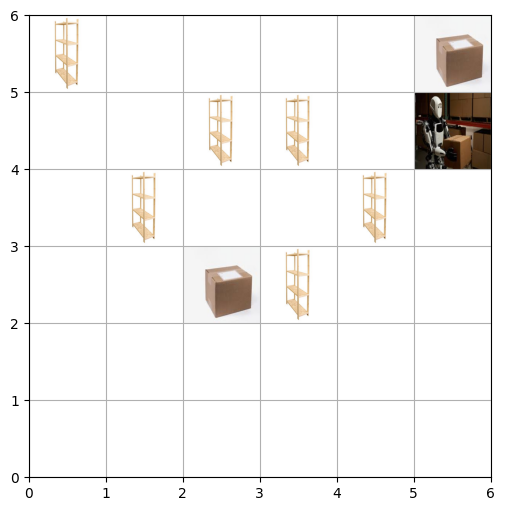

Step 12: Action=1, Position=(5, 5), Carrying=True, Reward=-1


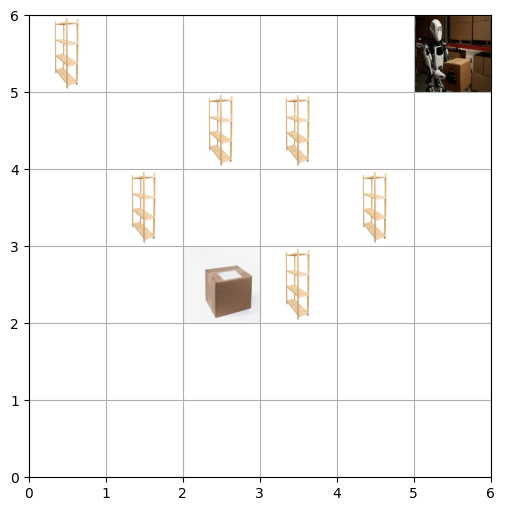

Step 13: Action=5, Position=(5, 5), Carrying=True, Reward=100


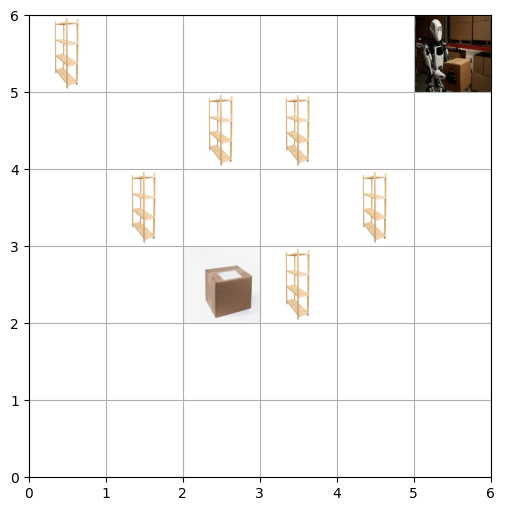

Episode 9: Task completed! Total Reward: 113
Step 0: Action=3, Position=(1, 0), Carrying=False, Reward=-1


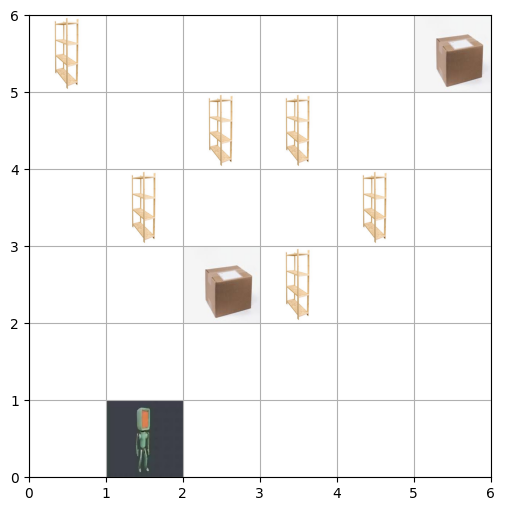

Step 1: Action=3, Position=(2, 0), Carrying=False, Reward=-1


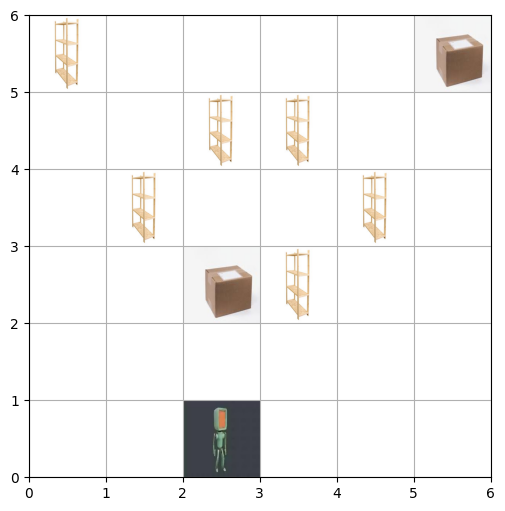

Step 2: Action=1, Position=(2, 1), Carrying=False, Reward=-1


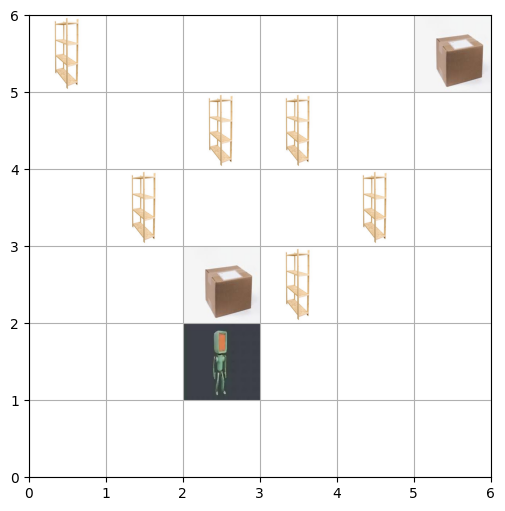

Step 3: Action=1, Position=(2, 2), Carrying=False, Reward=-1


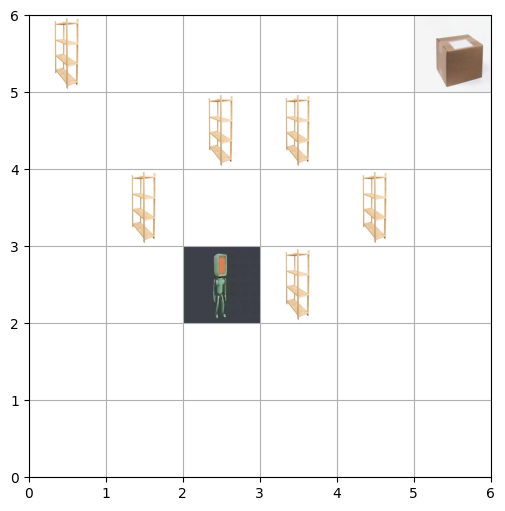

Step 4: Action=4, Position=(2, 2), Carrying=True, Reward=25


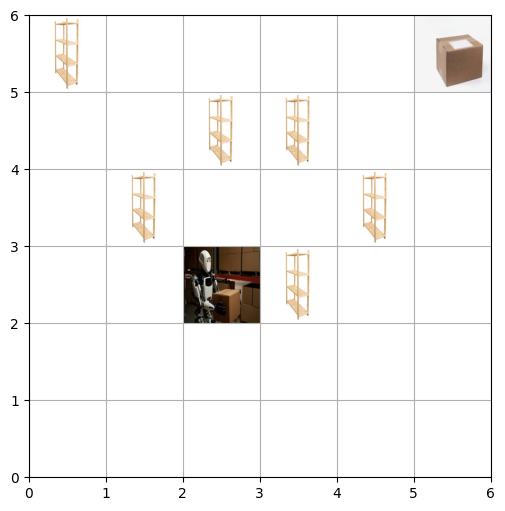

Step 5: Action=0, Position=(2, 1), Carrying=True, Reward=-1


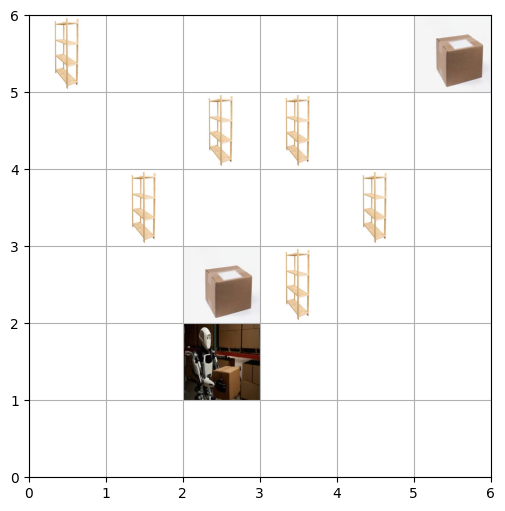

Step 6: Action=3, Position=(3, 1), Carrying=True, Reward=-1


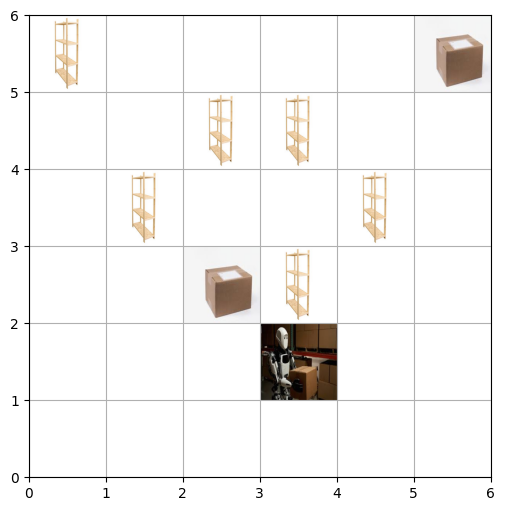

Step 7: Action=3, Position=(4, 1), Carrying=True, Reward=-1


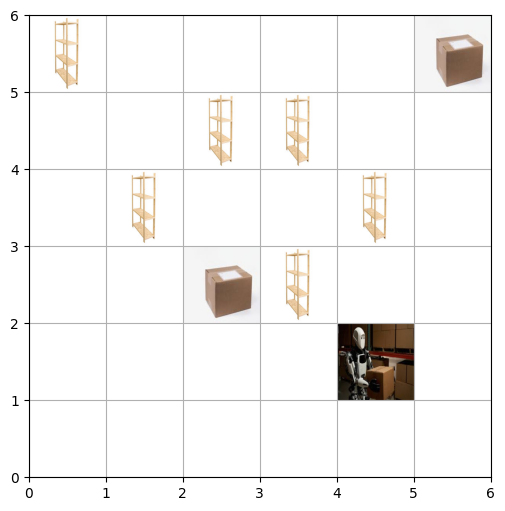

Step 8: Action=3, Position=(5, 1), Carrying=True, Reward=-1


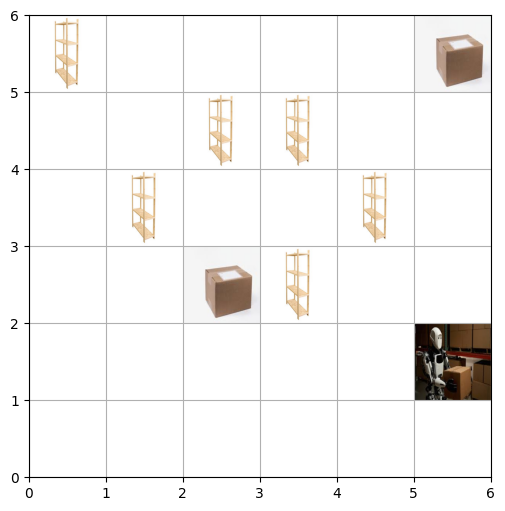

Step 9: Action=1, Position=(5, 2), Carrying=True, Reward=-1


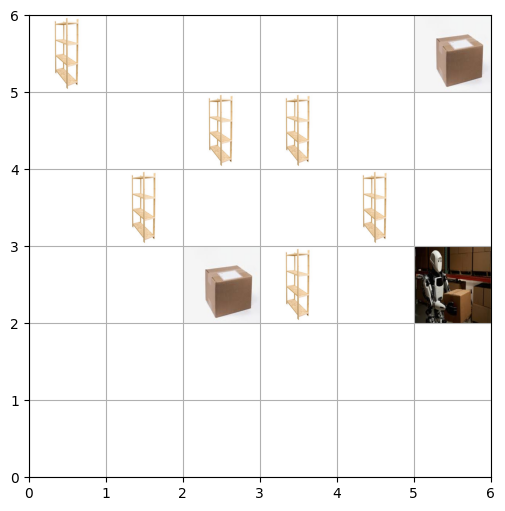

Step 10: Action=1, Position=(5, 3), Carrying=True, Reward=-1


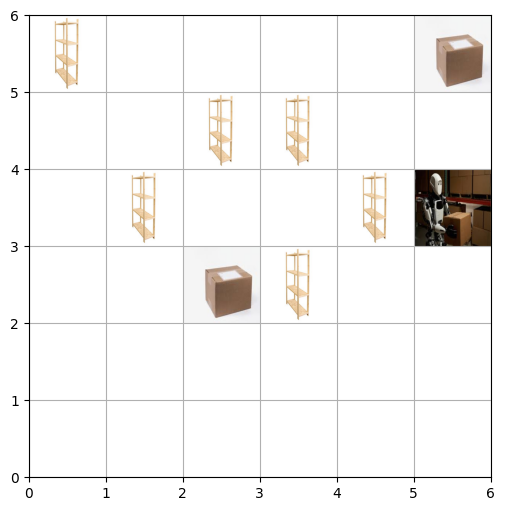

Step 11: Action=1, Position=(5, 4), Carrying=True, Reward=-1


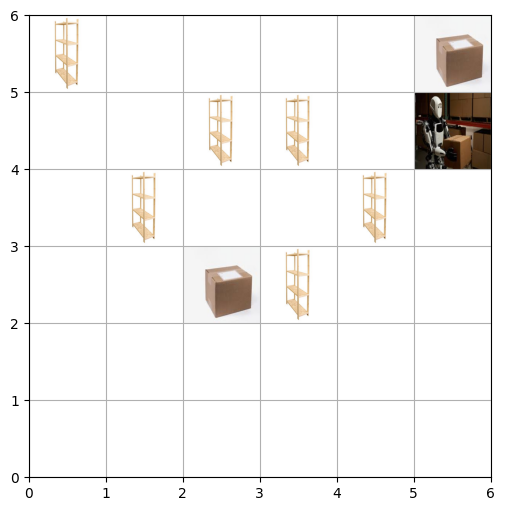

Step 12: Action=1, Position=(5, 5), Carrying=True, Reward=-1


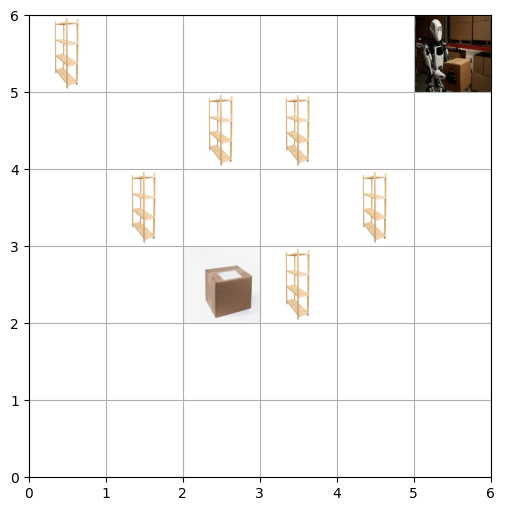

Step 13: Action=5, Position=(5, 5), Carrying=True, Reward=100


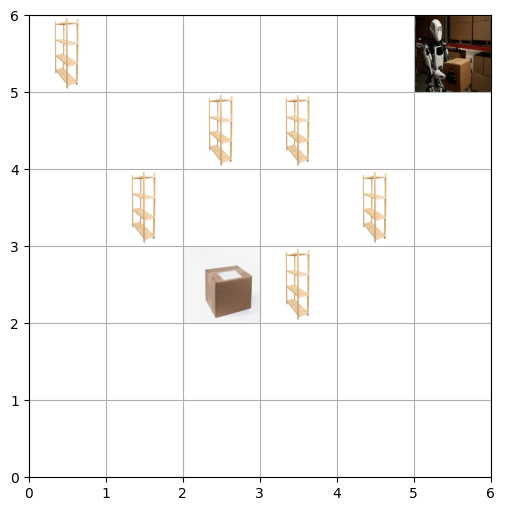

Episode 10: Task completed! Total Reward: 113


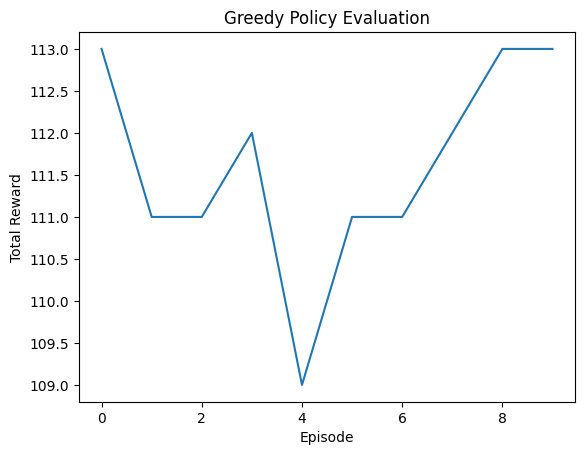

In [176]:
def testing_function(num_episodes=10):
    rewards_per_episode = [] 

    for episode in range(num_episodes):
        state, _ = env.reset()
        state = tuple(state)
        total_reward = 0
        done = False
        step = 0
        
        while not done:
            action = np.argmax(Q[state])
            next_state, reward, done, truncated, _ = env.step(action)
            next_state = tuple(next_state)
            state = next_state
            total_reward += reward
            print(f"Step {step}: Action={action}, Position={state[:2]}, Carrying={bool(state[2])}, Reward={reward}")
            env.render()
            step += 1
            if done or truncated:
                print(f"Episode {episode + 1}: Task completed! Total Reward: {total_reward}")
                break
        
        rewards_per_episode.append(total_reward)

    plt.figure()
    plt.plot(rewards_per_episode)
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.title('Greedy Policy Evaluation')
    plt.show()
    return rewards_per_episode

test_rewards_q_learning_stochastic = testing_function()


### Part3:

### Deterministic environment:

In [183]:
env = Warehouse_robot()
num_actions = env.action_space.n
num_states = (env.grid_size, env.grid_size, 2)
alpha = 0.1
gamma = 0.99
epsilon = 1.0
epsilon_min = 0.01
epsilon_decay = 0.995
Q_table = np.zeros(num_states + (num_actions,))
print("Initial Q-table (first few entries):")
print(Q_table[:5, :5, :, :])

def choose_action(state):
    if np.random.rand() < epsilon:
        return np.random.choice(num_actions)
    else:
        return np.argmax(Q_table[state])

Initial Q-table (first few entries):
[[[[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]]


 [[[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]]


 [[[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]]


 [[[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]

In [184]:
number_episodes = 500
reward_per_episode = []
epsilon_values = []

for episode in range(number_episodes):
    state, _ = env.reset()
    state = tuple(map(int, state))
    action = choose_action(state)
    total_reward = 0
    done = False

    while not done:
        next_state, reward, terminated, truncated, _ = env.step(action)
        done = terminated or truncated
        next_state = tuple(map(int, next_state))
        next_action = choose_action(next_state)
        Q_table[state][action] += alpha * (
            reward + gamma * Q_table[next_state][next_action] - Q_table[state][action]
        )
        state, action = next_state, next_action
        total_reward += reward

    epsilon = max(epsilon_min, epsilon * epsilon_decay)
    reward_per_episode.append(total_reward)
    epsilon_values.append(epsilon)
    if episode % 100 == 0:
        print(f"Episode {episode}, Total Reward: {total_reward}, Epsilon: {epsilon:.4f}")

print("\nTrained Q-table (first few entries):")
print(Q_table[:5, :5, :, :])

with open("sarsa_q_table.pkl", "wb") as f:
    pickle.dump(Q_table, f)

print("Q-table saved as 'sarsa_q_table.pkl'")

Episode 0, Total Reward: -1324, Epsilon: 0.9950
Episode 100, Total Reward: 88, Epsilon: 0.6027
Episode 200, Total Reward: 81, Epsilon: 0.3651
Episode 300, Total Reward: 109, Epsilon: 0.2212
Episode 400, Total Reward: 108, Epsilon: 0.1340

Trained Q-table (first few entries):
[[[[ 4.58945916e+01 -8.46321370e+00  6.07908355e+01  2.73677184e+02
     5.63128139e+01  3.13633558e+01]
   [-1.88526295e+01 -1.88675212e+01 -1.90100405e+01 -1.88153479e+01
    -1.88597669e+01 -1.88946943e+01]]

  [[ 9.42823617e+00 -1.18060667e+01 -1.15703788e+01  2.06312025e+01
    -1.02658163e+01 -1.19190158e+01]
   [-1.89579979e+01 -1.90467986e+01 -1.90054136e+01 -1.90854518e+01
    -1.91396251e+01 -1.90080341e+01]]

  [[-1.16983446e+01 -1.20478578e+01 -1.12949892e+01 -1.24151442e+01
    -1.16268631e+01 -1.13540201e+01]
   [-1.90649482e+01 -1.81751592e+01 -1.90988599e+01 -1.97981909e+01
    -1.92249381e+01 -1.90788169e+01]]

  [[-1.05674329e+01 -1.05168790e+01 -1.23375439e+01 -2.79587900e+01
    -1.24342472e+01 

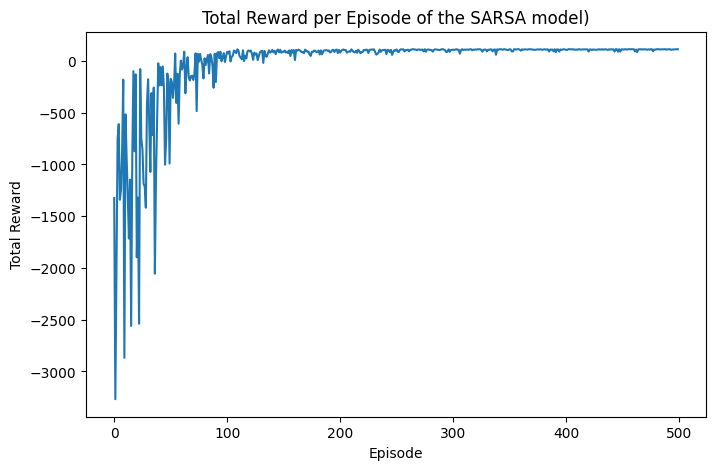

In [185]:
plt.figure(figsize=(8, 5))
plt.plot(reward_per_episode)
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("Total Reward per Episode of the SARSA model)")
plt.show()
train_rewards_sarsa = reward_per_episode

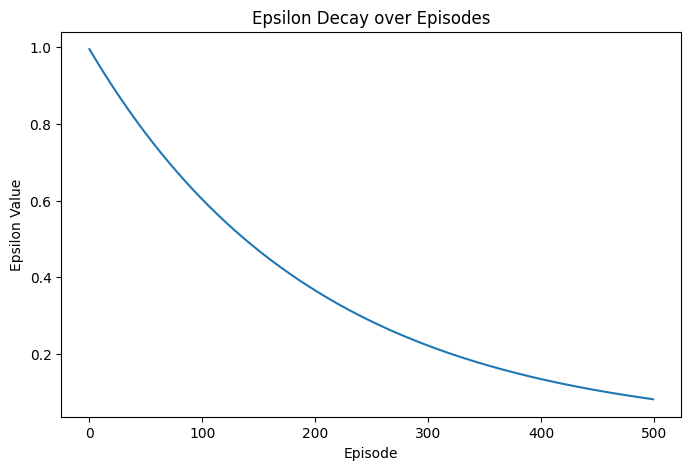

In [186]:
plt.figure(figsize=(8, 5))
plt.plot(epsilon_values)
plt.xlabel("Episode")
plt.ylabel("Epsilon Value")
plt.title("Epsilon Decay over Episodes")
plt.show()

In [187]:
greedy_rewards = []

for _ in range(10):
    state, _ = env.reset()
    state = tuple(map(int, state))
    total_reward = 0
    done = False

    while not done:
        action = np.argmax(Q_table[state])
        next_state, reward, terminated, truncated, _ = env.step(action)
        done = terminated or truncated
        next_state = tuple(map(int, next_state))
        state = next_state
        total_reward += reward

    greedy_rewards.append(total_reward)


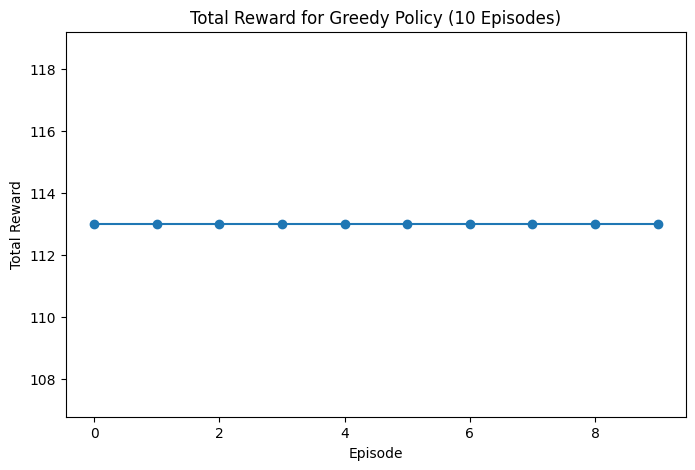

In [188]:
plt.figure(figsize=(8, 5))
plt.plot(greedy_rewards, marker='o')
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("Total Reward for Greedy Policy (10 Episodes)")
plt.show()
test_rewards_sarsa = greedy_rewards

### Stocastic environment:

In [189]:
env = Stochastic_warehouse()
number_actions = env.action_space.n
num_states = (env.grid_size, env.grid_size, 2)
alpha = 0.1
gamma = 0.99
epsilon = 1.0
epsilon_min = 0.01
epsilon_decay = 0.995
Q_table = np.zeros(num_states + (number_actions,))
print("Initial Q-table (first few entries):")
print(Q_table[:5, :5, :, :])

def choose_action(state):
    if np.random.rand() < epsilon:
        return np.random.choice(number_actions)
    else:
        return np.argmax(Q_table[state])


Initial Q-table (first few entries):
[[[[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]]


 [[[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]]


 [[[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]]


 [[[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]

In [190]:
number_episodes = 500
reward_per_episode = []
epsilon_values = []

for episode in range(number_episodes):
    state, _ = env.reset()
    state = tuple(map(int, state))
    action = choose_action(state)
    total_reward = 0
    done = False

    while not done:
        next_state, reward, terminated, truncated, _ = env.step(action)  
        done = terminated or truncated  
        next_state = tuple(map(int, next_state))
        next_action = choose_action(next_state)
        Q_table[state][action] += alpha * (
            reward + gamma * Q_table[next_state][next_action] - Q_table[state][action]
        )
        state, action = next_state, next_action
        total_reward += reward

    global epsilon
    epsilon = max(epsilon_min, epsilon * epsilon_decay)
    reward_per_episode.append(total_reward)
    epsilon_values.append(epsilon)
    if episode % 100 == 0:
        print(f"Episode {episode}, Total Reward: {total_reward}, Epsilon: {epsilon:.4f}")

print("\nTrained Q-table (first few entries):")
print(Q_table[:5, :5, :, :])

with open("sarsa_q_table_stochastic.pkl", "wb") as f:
    pickle.dump(Q_table, f)
    
print("Q-table saved as 'sarsa_q_table_stochastic.pkl'")

Episode 0, Total Reward: -6663, Epsilon: 0.9950
Episode 100, Total Reward: 54, Epsilon: 0.6027
Episode 200, Total Reward: 103, Epsilon: 0.3651
Episode 300, Total Reward: 100, Epsilon: 0.2212
Episode 400, Total Reward: 110, Epsilon: 0.1340

Trained Q-table (first few entries):
[[[[ 26.27742849  25.13780951   3.42245054 243.26080543   9.90392841
     15.32858851]
   [-22.34057775 -22.10579523 -22.53152003 -18.92254479 -22.21306555
    -22.13718419]]

  [[-12.69391044 -13.10957756 -13.1350282  170.75102076 -12.44446053
    -13.00782222]
   [-21.9844962  -22.84414447 -22.69148654 -22.53255105 -22.50592612
    -22.61733367]]

  [[ -4.24721404 -14.11574862 -12.75847353 -13.35732481 -12.74618034
    -12.79437918]
   [-23.11197431 -25.25245228 -23.54771347 -20.47954155 -23.34381461
    -23.24812112]]

  [[-11.47771338 -11.4151276  -12.70861111 -29.96171307 -11.68037693
    -11.3659915 ]
   [-22.98963828 -23.56547083 -22.95573068 -39.61106348 -23.0138617
    -23.08768423]]

  [[-10.65163836 -27

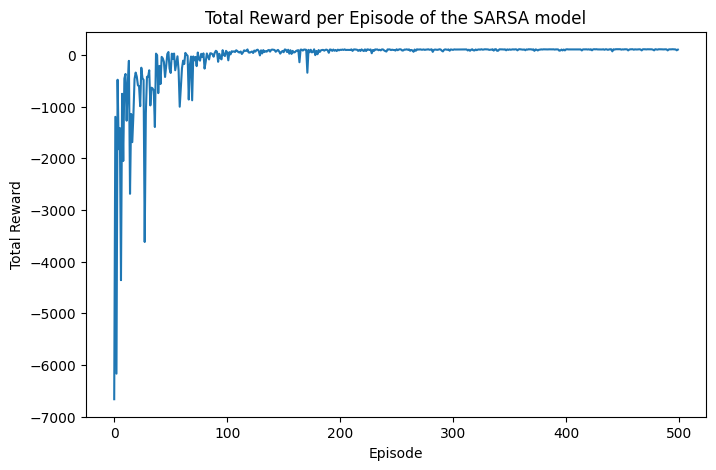

In [191]:
plt.figure(figsize=(8, 5))
plt.plot(reward_per_episode)
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("Total Reward per Episode of the SARSA model")
plt.show()
train_rewards_sarsa_stochastic = reward_per_episode

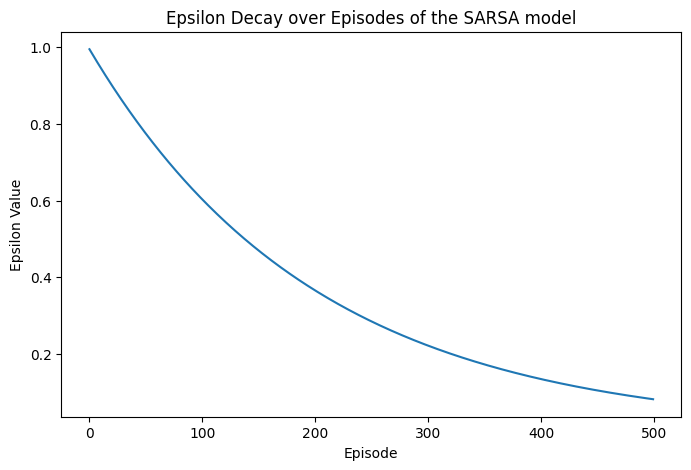

In [192]:
plt.figure(figsize=(8, 5))
plt.plot(epsilon_values)
plt.xlabel("Episode")
plt.ylabel("Epsilon Value")
plt.title("Epsilon Decay over Episodes of the SARSA model")
plt.show()

In [193]:
rewards_greedy = []

for _ in range(10):
    state, _ = env.reset()
    state = tuple(map(int, state))
    total_reward = 0
    done = False

    while not done:
        action = np.argmax(Q_table[state])
        next_state, reward, terminated, truncated, _ = env.step(action)
        done = terminated or truncated
        next_state = tuple(map(int, next_state))
        total_reward += reward
        state = next_state

    rewards_greedy.append(total_reward)


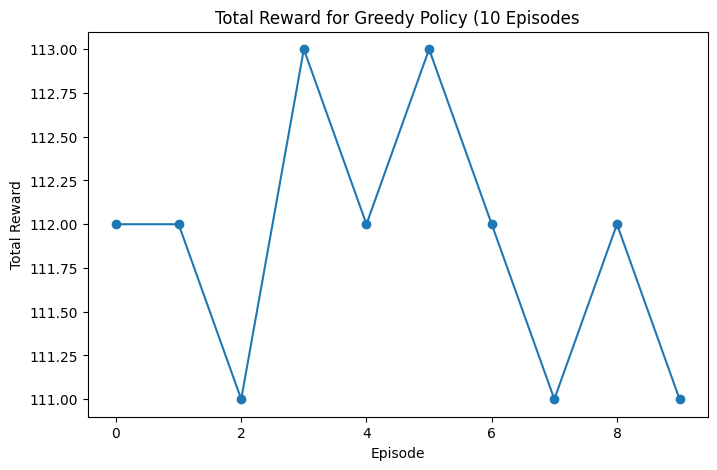

In [194]:
plt.figure(figsize=(8, 5))
plt.plot(rewards_greedy, marker='o')
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("Total Reward for Greedy Policy (10 Episodes")
plt.show()
test_rewards_sarsa_stochastic = rewards_greedy

### Comparison:

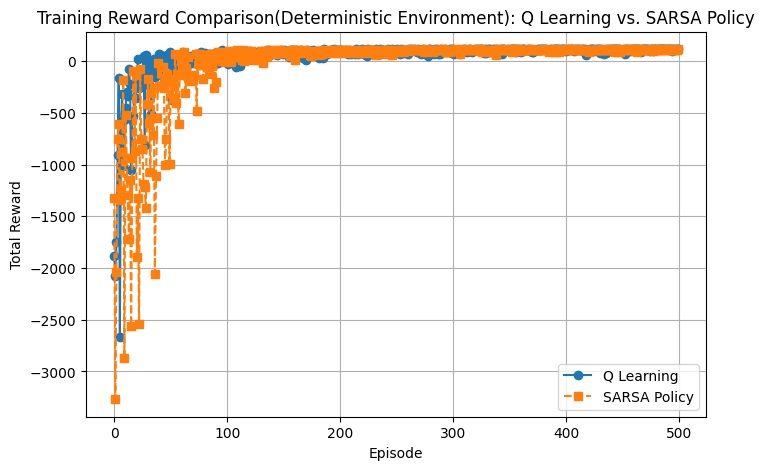

In [200]:
plt.figure(figsize=(8, 5))
plt.plot(train_rewards_q_learning, marker='o', label="Q Learning")
plt.plot(train_rewards_sarsa, marker='s', label="SARSA Policy", linestyle="--")
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("Training Reward Comparison(Deterministic Environment): Q Learning vs. SARSA Policy")
plt.legend()
plt.grid(True)
plt.show()


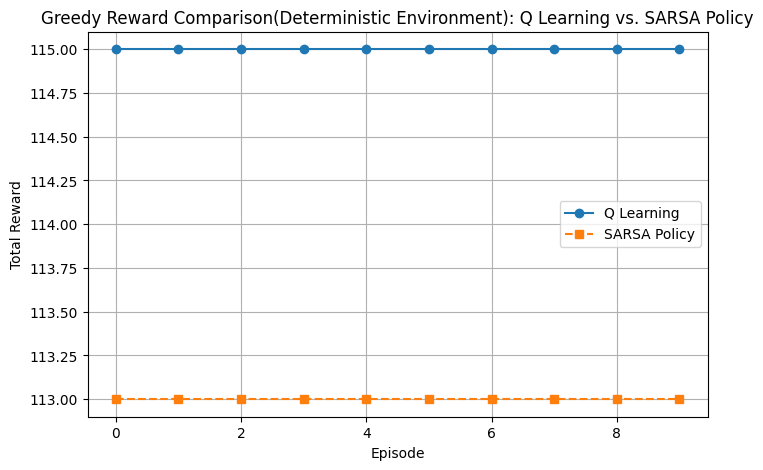

In [201]:
plt.figure(figsize=(8, 5))
plt.plot(test_rewards_q_learning, marker='o', label="Q Learning")
plt.plot(test_rewards_sarsa, marker='s', label="SARSA Policy", linestyle="--")
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("Greedy Reward Comparison(Deterministic Environment): Q Learning vs. SARSA Policy")
plt.legend()
plt.grid(True)
plt.show()

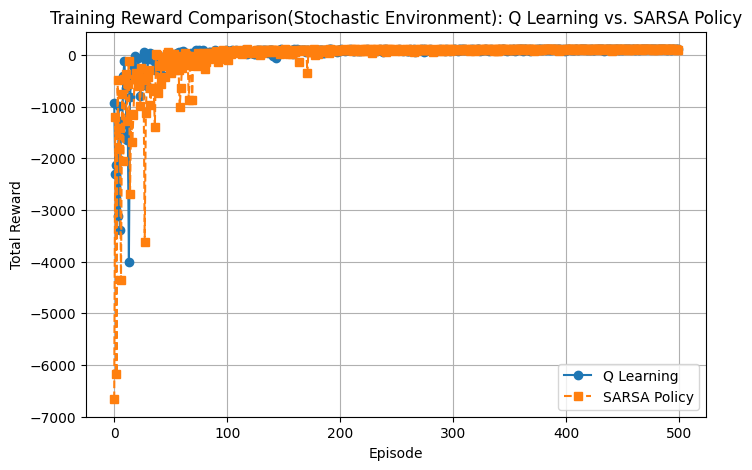

In [202]:
plt.figure(figsize=(8, 5))
plt.plot(train_rewards_q_learning_stochastic, marker='o', label="Q Learning")
plt.plot(train_rewards_sarsa_stochastic, marker='s', label="SARSA Policy", linestyle="--")
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("Training Reward Comparison(Stochastic Environment): Q Learning vs. SARSA Policy")
plt.legend()
plt.grid(True)
plt.show()

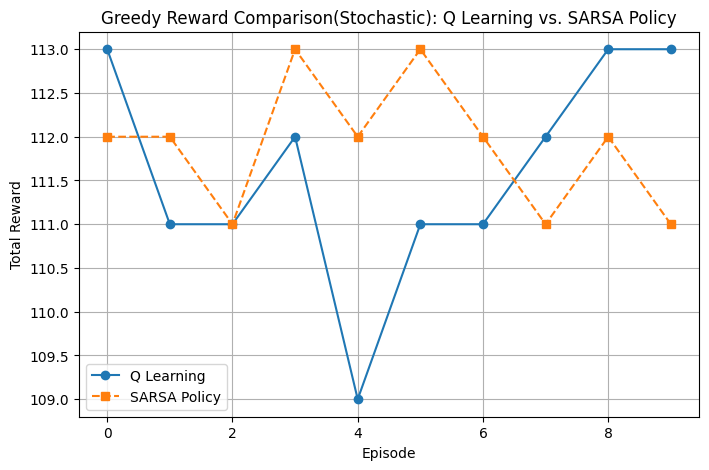

In [203]:
plt.figure(figsize=(8, 5))
plt.plot(test_rewards_q_learning_stochastic, marker='o', label="Q Learning")
plt.plot(test_rewards_sarsa_stochastic, marker='s', label="SARSA Policy", linestyle="--")
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("Greedy Reward Comparison(Stochastic): Q Learning vs. SARSA Policy")
plt.legend()
plt.grid(True)
plt.show()